In [1]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as mtick
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score 
import pandas_datareader as pdr
import math
import datetime
import itertools
import ast
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following_signal import (apply_jupyter_fullscreen_css, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices, calculate_donchian_channels)
from strategy_performance import (calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics,
                                          calculate_compounded_cumulative_returns, estimate_fee_per_trade, rolling_sharpe_ratio)
import coinbase_utils as cn
import strategy_performance as perf
import position_sizing_binary_utils as size_bin
import position_sizing_continuous_utils as size_cont
import trend_following_signal as tf
%matplotlib inline

In [204]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)
importlib.reload(size_bin)
importlib.reload(size_cont)

<module 'position_sizing_continuous_utils' from '/Users/adheerchauhan/Documents/git/trend_following/position_sizing_continuous_utils.py'>

In [3]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
apply_jupyter_fullscreen_css()

In [4]:
from strategy_performance import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance_heatmap(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def moving_avg_crossover_strategy_performance(start_date, end_date, ticker_list, fast_mavg_list=np.arange(10, 101, 10), slow_mavg_list=np.arange(50, 501, 50), rolling_donchian_window=20, long_only=True,
                                              initial_capital=15000, rolling_cov_window=20, volatility_window=20, transaction_cost_est=0.001, passive_trade_rate=0.05, use_coinbase_data=True,
                                              rolling_sharpe_window=50, cash_buffer_percentage=0.10, annualized_target_volatility=0.20, annual_trading_days=365, use_specific_start_date=False,
                                              signal_start_date=None):
    
    perf_cols = ['fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df = size.apply_target_volatility_position_sizing_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                                               mavg_stepsize, rolling_donchian_window, long_only, initial_capital,
                                                                               rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                               use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                               annual_trading_days, use_specific_start_date, signal_start_date)
                    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
                    row = {
                        # 'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio'],
                        'annualized_std_dev': performance_metrics['annualized_std_dev'],
                        'max_drawdown': performance_metrics['max_drawdown'],
                        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                        'hit_rate': performance_metrics['hit_rate'],
                        't_statistic': performance_metrics['t_statistic'],
                        'p_value': performance_metrics['p_value'],
                        'trade_count': performance_metrics['trade_count']
                    }
                    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)
    
    return df_performance

In [5]:
def plot_trend_following_performance_time_series(df, df_trend, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window):
    
    start_date = pd.to_datetime(start_date).date().strftime('%Y-%m-%d')
    end_date = pd.to_datetime(end_date).date().strftime('%Y-%m-%d')
    fig = plt.figure(figsize=(22,20))
    layout = (5,2)
    trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
    trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
    trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
    trend_signal_ax2 = trend_signal_ax.twinx()
    trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
    trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
    trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)

    _ = trend_ax.plot(df.index, df[f'{ticker}_t_1_close'], label='Price')
    for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        _ = trend_ax.plot(df_trend.index, df_trend[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

    _ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
    _ = trend_ax.set_ylabel('Price')
    _ = trend_ax.set_xlabel('Date')
    _ = trend_ax.legend(loc='upper left')
    _ = trend_ax.grid()

    _ = trend_donchian_ax.plot(df.index, df[f'{ticker}_t_1_close'], label='Price')
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}_t_2'], label='Donchian Upper Band', linestyle='--', linewidth=3)
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}_t_2'], label='Donchian Lower Band', linestyle='--', linewidth=3)

    _ = trend_donchian_ax.set_title(f'{ticker} Donchian Channels')
    _ = trend_donchian_ax.set_ylabel('Price')
    _ = trend_donchian_ax.set_xlabel('Date')
    _ = trend_donchian_ax.legend(loc='upper left')
    _ = trend_donchian_ax.grid()

    _ = trend_signal_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
    _ = trend_signal_ax2.plot(df.index, df[f'{ticker}_t_1_close'], label='Price', alpha=0.8, color='orange', linestyle='--')
    _ = trend_signal_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Signal')
    _ = trend_signal_ax.set_ylabel('Signal')
    _ = trend_signal_ax.set_xlabel('Date')
    _ = trend_signal_ax.legend(loc='upper left')
    _ = trend_signal_ax.grid()

    _ = trend_rolling_sharpe_ax.plot(df.index, df[f'portfolio_rolling_sharpe_50'],
                                     # df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                     label='Sharpe Ratio', color='orange')
    _ = trend_rolling_sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_xlabel('Date')
    _ = trend_rolling_sharpe_ax.legend(loc='upper left')
    _ = trend_rolling_sharpe_ax.grid()

    _ = trend_return_ax.plot(df.index, df[f'portfolio_daily_pct_returns'],
                             # df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                             label='Return')
    _ = trend_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Return')
    _ = trend_return_ax.set_ylabel('Return')
    _ = trend_return_ax.set_xlabel('Date')
    _ = trend_return_ax.legend(loc='upper left')
    _ = trend_return_ax.grid()

    # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
    _ = trend_cum_return_ax.plot(df.index, df['strategy_cumulative_return'], label='Cum. Return')
    _ = trend_cum_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Cumulative Return')
    _ = trend_cum_return_ax.set_ylabel('Cum. Return')
    _ = trend_cum_return_ax.set_xlabel('Date')
    _ = trend_cum_return_ax.legend(loc='upper left')
    _ = trend_cum_return_ax.grid()


    plt.tight_layout()
    
    return

## Save Crypto Data from Coinbase

In [9]:
ticker_list_save = ['BTC-USD','ETH-USD','SOL-USD','ADA-USD','AVAX-USD','XRP-USD','AAVE-USD','MATIC-USD']

In [ ]:
for ticker in ticker_list_save:
    print(ticker)
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=False, start_date=None, 
                                                        end_date=pd.Timestamp('2025-06-30').date(), save_to_file=True)

## Trend Following Signal - Moving Average and Donchian Channel

In [16]:
from collections import OrderedDict

def print_strategy_params():
    """
    Pretty-print the strategy’s configuration values, with a blank line
    separating each logical section.
    """

    # ---- Define sections (title is just for dev readability) --------------
    sections = [
        ("Dates & universe", OrderedDict([
            ("start_date",      start_date),
            ("end_date",        end_date),
            ("warm_up_days",    WARMUP_DAYS),
            ("ticker_list",     ticker_list),
        ])),

        ("Moving-average / trend", OrderedDict([
            ("fast_mavg",                  fast_mavg),
            ("slow_mavg",                  slow_mavg),
            ("mavg_stepsize",              mavg_stepsize),
            ("mavg_z_score_window",        mavg_z_score_window),
            ("moving_avg_type",            moving_avg_type),
            ("ma_crossover_signal_weight", ma_crossover_signal_weight),
        ])),

        ("Donchian channel", OrderedDict([
            ("entry_rolling_donchian_window", entry_rolling_donchian_window),
            ("exit_rolling_donchian_window", exit_rolling_donchian_window),
            ("use_donchian_exit_gate", use_donchian_exit_gate),
            ("donchian_signal_weight",  donchian_signal_weight),
        ])),

        ("Volatility & risk", OrderedDict([
            ("volatility_window",            volatility_window),
            ("annualized_target_volatility", annualized_target_volatility),
            ("rolling_cov_window",           rolling_cov_window),
            ("rolling_atr_window",           rolling_atr_window),
            ("atr_multiplier",               atr_multiplier),
            ("log_std_window",               log_std_window),
            ("coef_of_variation_window",     coef_of_variation_window),
            ("vol_of_vol_z_score_window",    vol_of_vol_z_score_window),
            ("vol_of_vol_p_min",             vol_of_vol_p_min),
            ("r2_strong_threshold",          r2_strong_threshold)
        ])),

        ("Signal gating / quality", OrderedDict([
            ("lower_r_sqr_limit",             lower_r_sqr_limit),
            ("upper_r_sqr_limit",             upper_r_sqr_limit),
            ("rolling_r2_window",             rolling_r2_window),
            ("r2_smooth_window",              r2_smooth_window),
            ("r2_confirm_days",               r2_confirm_days),
            ("rolling_sharpe_window",         rolling_sharpe_window),
            ("use_activation",                use_activation),
            ("tanh_activation_constant_dict", tanh_activation_constant_dict),
            ("weighted_signal_ewm_window",    weighted_signal_ewm_window)
        ])),

        ("Trading toggles & thresholds", OrderedDict([
            ("long_only",                  long_only),
            ("use_coinbase_data",          use_coinbase_data),
            ("use_saved_files",            use_saved_files),
            ("saved_file_end_date",        saved_file_end_date),
            ("use_specific_start_date",    use_specific_start_date),
            ("signal_start_date",          signal_start_date),
            ("price_or_returns_calc",      price_or_returns_calc),
            ("notional_threshold_pct",     notional_threshold_pct),
            ("cooldown_counter_threshold", cooldown_counter_threshold),
            ("warmup_days",                WARMUP_DAYS)
        ])),

        ("Capital & execution", OrderedDict([
            ("initial_capital",        initial_capital),
            ("cash_buffer_percentage", cash_buffer_percentage),
            ("transaction_cost_est",   transaction_cost_est),
            ("passive_trade_rate",     passive_trade_rate),
            ("annual_trading_days",    annual_trading_days),
        ])),
    ]

    # ---- Compute width for neat alignment ---------------------------------
    longest_key = max(len(k) for _, sec in sections for k in sec)

    print("\nStrategy Parameters\n" + "-" * (longest_key + 30))
    for _, sec in sections:
        for k, v in sec.items():
            print(f"{k:<{longest_key}} : {v}")
        print()  # blank line between sections
    print("-" * (longest_key + 30) + "\n")

# ---------------------------------------------------------------------------
# Example usage (uncomment after your own parameter definitions are in scope)
# ---------------------------------------------------------------------------
# if __name__ == "__main__":
#     print_strategy_params()

In [18]:
def plot_signal_performance(df_1, df_2, ticker):

    fig = plt.figure(figsize=(20,12))
    layout = (2,2)
    signal_ax = plt.subplot2grid(layout, (0,0))
    price_ax = signal_ax.twinx()
    equity_curve_ax = plt.subplot2grid(layout, (0,1))
    sharpe_ax = plt.subplot2grid(layout, (1,0))
    portfolio_value_ax = plt.subplot2grid(layout, (1,1))

    _ = signal_ax.plot(df_1.index, df_1[f'{ticker}_final_signal'], label='Orig Signal', alpha=0.9)
    _ = signal_ax.plot(df_2.index, df_2[f'{ticker}_final_signal'], label='New Signal', alpha=0.9)
    _ = price_ax.plot(df_1.index, df_2[f'{ticker}_open'], label='Price', alpha=0.7, linestyle='--', color='magenta')
    _ = signal_ax.set_title(f'Orignal Signal vs New Signal')
    _ = signal_ax.set_ylabel('Signal')
    _ = signal_ax.set_xlabel('Date')
    _ = signal_ax.legend(loc='upper left')
    _ = signal_ax.grid()

    _ = equity_curve_ax.plot(df_1.index, df_1[f'equity_curve'], label='Orig Signal', alpha=0.9)
    _ = equity_curve_ax.plot(df_2.index, df_2[f'equity_curve'], label='New Signal', alpha=0.9)
    _ = equity_curve_ax.set_title(f'Equity Curve')
    _ = equity_curve_ax.set_ylabel('Equity Curve')
    _ = equity_curve_ax.set_xlabel('Date')
    _ = equity_curve_ax.legend(loc='upper left')
    _ = equity_curve_ax.grid()

    _ = sharpe_ax.plot(df_1.index, df_1[f'portfolio_rolling_sharpe_50'], label='Orig Signal', alpha=0.9)
    _ = sharpe_ax.plot(df_2.index, df_2[f'portfolio_rolling_sharpe_50'], label='New Signal', alpha=0.9)
    _ = sharpe_ax.set_title(f'Rolling Sharpe')
    _ = sharpe_ax.set_ylabel(f'Rolling Sharpe')
    _ = sharpe_ax.set_xlabel('Date')
    _ = sharpe_ax.legend(loc='upper left')
    _ = sharpe_ax.grid()

    _ = portfolio_value_ax.plot(df_1.index, df_1[f'total_portfolio_value'], label='Orig Signal', alpha=0.9)
    _ = portfolio_value_ax.plot(df_2.index, df_2[f'total_portfolio_value'], label='New Signal', alpha=0.9)
    _ = portfolio_value_ax.set_title(f'Total Portfolio Value')
    _ = portfolio_value_ax.set_ylabel('Portfolio Value')
    _ = portfolio_value_ax.set_xlabel('Date')
    _ = portfolio_value_ax.legend(loc='upper left')
    _ = portfolio_value_ax.grid()

    plt.tight_layout()

    return

In [20]:
from scipy.stats import linregress

def calc_ribbon_slope(row, ticker, fast_mavg, slow_mavg, mavg_stepsize):
    x = np.linspace(slow_mavg, fast_mavg, mavg_stepsize)
    y = row.values
    slope, _, _, _, _ = linregress(x, y)
    return slope

In [22]:
def pct_rank(x, window=250):
    return x.rank(pct=True)

In [24]:
def calculate_average_directional_index(start_date, end_date, ticker, adx_period):
    
    ## Convert number of bars to days. ## alpha = 2/(span + 1) for the Exponentially Weighted Average
    ## If alpha = 1/n, span = 2*n - 1
    adx_atr_window = 2*adx_period - 1

    ## Pull Market Data
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, end_date=end_date, save_to_file=False)
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
        df.columns = [f'{ticker}_{x}' for x in df.columns]
    else:
        df = tf.load_financial_data(start_date, end_date, ticker, print_status=False)  # .shift(1)
        df.columns = [f'{ticker}_open', f'{ticker}_high', f'{ticker}_low', f'{ticker}_close', f'{ticker}_adjclose',
                      f'{ticker}_volume']
    
    ## Calculate Directional Move
    df[f'{ticker}_up_move'] = df[f'{ticker}_high'].diff()
    df[f'{ticker}_down_move'] = -df[f'{ticker}_low'].diff()
    
    plus_dir_move_cond = (df[f'{ticker}_up_move'] > df[f'{ticker}_down_move']) & (df[f'{ticker}_up_move'] > 0)
    minus_dir_move_cond = (df[f'{ticker}_down_move'] > df[f'{ticker}_up_move']) & (df[f'{ticker}_down_move'] > 0)
    df[f'{ticker}_plus_dir_move'] = np.where(plus_dir_move_cond, df[f'{ticker}_up_move'], 0)
    df[f'{ticker}_minus_dir_move'] = np.where(minus_dir_move_cond, df[f'{ticker}_down_move'], 0)
    
    ## Calculate the True Range (TR) and Average True Range (ATR)
    df[f'{ticker}_high-low'] = df[f'{ticker}_high'] - df[f'{ticker}_low']
    df[f'{ticker}_high-close'] = np.abs(df[f'{ticker}_high'] - df[f'{ticker}_close'].shift(1))
    df[f'{ticker}_low-close'] = np.abs(df[f'{ticker}_low'] - df[f'{ticker}_close'].shift(1))
    df[f'{ticker}_true_range_price'] = df[[f'{ticker}_high-low',f'{ticker}_high-close', f'{ticker}_low-close']].max(axis=1)
    df[f'{ticker}_{adx_atr_window}_avg_true_range'] = df[f'{ticker}_true_range_price'].ewm(span=adx_atr_window, adjust=False).mean()
    
    ## Calculate the exponentially weighted directional moves
    df[f'{ticker}_plus_dir_move_exp'] = df[f'{ticker}_plus_dir_move'].ewm(span=adx_atr_window, adjust=False).mean()
    df[f'{ticker}_minus_dir_move_exp'] = df[f'{ticker}_minus_dir_move'].ewm(span=adx_atr_window, adjust=False).mean()
    
    ## Calculate the directional indicator
    df[f'{ticker}_plus_dir_ind'] = 100 * (df[f'{ticker}_plus_dir_move_exp'] / df[f'{ticker}_{adx_atr_window}_avg_true_range'])
    df[f'{ticker}_minus_dir_ind'] = 100 * (df[f'{ticker}_minus_dir_move_exp'] / df[f'{ticker}_{adx_atr_window}_avg_true_range'])
    df[f'{ticker}_dir_ind'] = 100 * np.abs((df[f'{ticker}_plus_dir_ind'] - df[f'{ticker}_minus_dir_ind'])) / (df[f'{ticker}_plus_dir_ind'] + df[f'{ticker}_minus_dir_ind'])
    df[f'{ticker}_avg_dir_ind'] = df[f'{ticker}_dir_ind'].ewm(span=adx_atr_window, adjust=False).mean()
    
    ## Shift by a day to avoid look-ahead bias
    df[f'{ticker}_avg_dir_ind'] = df[f'{ticker}_avg_dir_ind'].shift(1)

    return df[[f'{ticker}_avg_dir_ind']]

In [26]:
# def calculate_rolling_r2(df, ticker, t_1_close_price_col, r2_window=50, lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.8):

#     log_price_col = f'{ticker}_t_1_close_price_log'
#     df[log_price_col] = np.log(df[t_1_close_price_col])
    
#     ## Define the variables
#     y = df[log_price_col]
#     x = np.arange(len(y), dtype=float) # Time

#     ## Compute rolling sums for rolling R2 calculation
#     x_sum = pd.Series(x, y.index).rolling(r2_window).sum()
#     y_sum = y.rolling(r2_window).sum()
#     x_sqr = pd.Series(x**2, y.index).rolling(r2_window).sum()
#     y_sqr = (y**2).rolling(r2_window).sum()
#     xy_sum = pd.Series(x, y.index).mul(y).rolling(r2_window).sum()

#     ## Calculate the R squared
#     n = r2_window
#     numerator = n * xy_sum - x_sum * y_sum
#     denominator = np.sqrt((n * x_sqr) - (x_sum ** 2)) * np.sqrt((n * y_sqr) - (y_sum**2))
#     df[f'{ticker}_rolling_r_sqr'] = (numerator / denominator) ** 2

#     ## Normalize the R Squared centered around 0.5 where values below the lower limit are
#     ## clipped to 0 and values above 0.8 are clipped to 1
#     df[f'{ticker}_rolling_r_sqr'] = np.clip((df[f'{ticker}_rolling_r_sqr'] - lower_r_sqr_limit) / (upper_r_sqr_limit - lower_r_sqr_limit), 0, 1)

#     return df

In [28]:
import scipy

def create_trend_strategy_log_space(df, ticker, mavg_start, mavg_end, mavg_stepsize, mavg_z_score_window=252):
    
    # ---- constants ----
    # windows = 2**np.arange(np.log2(mavg_start), np.log2(mavg_end)+0.01, log_step).round().astype(int)   # e.g. 10,14,20,28,40,56
    windows = np.geomspace(mavg_start, mavg_end, mavg_stepsize).round().astype(int)
    windows = np.unique(windows)
    x       = np.log(windows[::-1])
    xm      = x - x.mean()
    varx    = (xm**2).sum()
    
    # ---- compute MAs (vectorised) ----
    df[f'{ticker}_close_log'] = np.log(df[f'{ticker}_close'])
    for w in windows:
        df[f'{ticker}_{w}_ema'] = df[f'{ticker}_close_log'].ewm(span=w, adjust=False).mean()
    
    mavg_mat = df[[f'{ticker}_{w}_ema' for w in windows]].to_numpy()
    
    # ---- slope (vectorised) ----
    slope = mavg_mat.dot(xm) / varx                        # ndarray (T,)
    slope = pd.Series(slope, index=df.index).shift(1)      # lag to avoid look-ahead
    
    # ---- z-score & rank ----
    # z = ((slope - slope.rolling(mavg_z_score_window, min_periods=mavg_z_score_window//5).mean()) /
    #      slope.rolling(mavg_z_score_window, min_periods=mavg_z_score_window//5).std())
    # Removing the Min Period, the Z-Score will be calculated when the mavg_z_score_window history is available
    z = ((slope - slope.rolling(mavg_z_score_window, min_periods=mavg_z_score_window).mean()) /
         slope.rolling(mavg_z_score_window, min_periods=mavg_z_score_window).std())
    

    # Optional Tail Cap
    z = z.clip(-4, 4)

    # Calculate the Percentile Rank based on CDF
    rank = scipy.stats.norm.cdf(z) - 0.5              # centred 0↔±0.5
    
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    df[trend_continuous_signal_col] = slope
    df[trend_continuous_signal_rank_col] = rank

    return df

In [30]:
def calculate_donchian_channel_dual_window(start_date, end_date, ticker, price_or_returns_calc='price', entry_rolling_donchian_window=20, exit_rolling_donchian_window=20, 
                                           use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):
    if use_coinbase_data:
        if use_saved_files:
            date_list = cn.coinbase_start_date_by_ticker_dict
            file_end_date = pd.Timestamp(saved_file_end_date).date()
            filename = f"{ticker}-pickle-{pd.Timestamp(date_list[ticker]).strftime('%Y-%m-%d')}-{file_end_date.strftime('%Y-%m-%d')}"
            output_file = f'coinbase_historical_price_folder/{filename}'
            df = pd.read_pickle(output_file)
            date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
            df = df[date_cond]
        else:
            # df = cn.get_coinbase_ohlc_data(ticker=ticker)
            df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                                end_date=end_date, save_to_file=False)
            df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = load_financial_data(start_date, end_date, ticker, print_status=False)  # .shift(1)
        df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']

    if price_or_returns_calc == 'price':
        ## Entry Channel
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'] = (
            df[f'high'].rolling(window=entry_rolling_donchian_window).max())

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}'] = (
            df[f'low'].rolling(window=entry_rolling_donchian_window).min())

        ## Exit Channel
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'] = (
            df[f'high'].rolling(window=exit_rolling_donchian_window).max())

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'] = (
            df[f'low'].rolling(window=exit_rolling_donchian_window).min())

    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'close'].pct_change()

        ## Entry Channel
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=entry_rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=entry_rolling_donchian_window).min()

        ## Exit Channel
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=exit_rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=exit_rolling_donchian_window).min()

    # Middle of the channel (optional, could be just average of upper and lower)
    # Entry Middle Band
    df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_middle_band_{price_or_returns_calc}'] = (
        (df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'] +
         df[f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}']) / 2)

    # Exit Middle Band
    df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_middle_band_{price_or_returns_calc}'] = (
        (df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'] +
         df[f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}']) / 2)

    # Shift only the Keltner channel metrics to avoid look-ahead bias
    shift_columns = [
        f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_middle_band_{price_or_returns_calc}',
        f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}',
        f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}',
        f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_middle_band_{price_or_returns_calc}',
        f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}',
        f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'
    ]
    df[shift_columns] = df[shift_columns].shift(1)

    return df

In [156]:
## Original Signal
def generate_trend_signal_with_donchian_channel_continuous(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window, 
                                                           exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                           use_activation=True, tanh_activation_constant_dict=None, 
                                                           moving_avg_type='exponential', price_or_returns_calc='price',
                                                           long_only=False, use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    # Pull Close Prices from Coinbase
    date_list = cn.coinbase_start_date_by_ticker_dict
    if use_saved_files:
        file_end_date = pd.Timestamp(saved_file_end_date).date()
        filename = f"{ticker}-pickle-{pd.Timestamp(date_list[ticker]).strftime('%Y-%m-%d')}-{file_end_date.strftime('%Y-%m-%d')}"
        output_file = f'coinbase_historical_price_folder/{filename}'
        df = pd.read_pickle(output_file)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    else:
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                            end_date=end_date, save_to_file=False)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_signal_col = f'{ticker}_final_signal'

    ## Generate Trend Signal in Log Space
    df_trend = create_trend_strategy_log_space(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window)
    
    ## Generate Donchian Channels
    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian = calculate_donchian_channel_dual_window(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                                         entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                         use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    t_1_close_col = f't_1_close'
    df_donchian[t_1_close_col] = df_donchian[f'close'].shift(1)
    donchian_entry_upper_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'
    donchian_entry_lower_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}'
    donchian_entry_middle_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_middle_band_{price_or_returns_calc}'
    donchian_exit_upper_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'
    donchian_exit_lower_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'
    donchian_exit_middle_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_middle_band_{price_or_returns_calc}'
    shift_cols = [donchian_entry_upper_band_col, donchian_entry_lower_band_col, donchian_entry_middle_band_col,
                  donchian_exit_upper_band_col, donchian_exit_lower_band_col, donchian_exit_middle_band_col]
    for col in shift_cols:
        df_donchian[f'{col}_t_2'] = df_donchian[col].shift(1)

    # Donchian Continuous Signal
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_entry_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_entry_upper_band_col}_t_2'] - df_donchian[f'{donchian_entry_lower_band_col}_t_2']))

    ## Calculate Donchian Channel Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_donchian[donchian_continuous_signal_rank_col] = pct_rank(df_donchian[donchian_continuous_signal_col]) - 0.5

    # Donchian Binary Signal
    gate_long_condition  = df_donchian[t_1_close_col] >= df_donchian[f'{donchian_exit_lower_band_col}_t_2']
    gate_short_condition = df_donchian[t_1_close_col] <= df_donchian[f'{donchian_exit_upper_band_col}_t_2']
    # sign of *entry* score decides direction
    entry_sign = np.sign(df_donchian[donchian_continuous_signal_col])
    # treat exact zero as "flat but allowed" (gate=1) so ranking not wiped out
    entry_sign = np.where(entry_sign == 0, 1, entry_sign)  # default to long-side keep
    df_donchian[donchian_binary_signal_col] = np.where(
        entry_sign > 0, gate_long_condition, gate_short_condition).astype(float)
    
    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_entry_upper_band_col}_t_2', f'{donchian_entry_lower_band_col}_t_2', f'{donchian_entry_middle_band_col}_t_2',
                     f'{donchian_exit_upper_band_col}_t_2', f'{donchian_exit_lower_band_col}_t_2', f'{donchian_exit_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    ## Trend and Donchian Channel Signal
    # Calculate the exponential weighted average of the ranked signals to remove short-term flip flops (whiplash)
    df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]] = (
        df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]].ewm(span=weighted_signal_ewm_window, adjust=False).mean())

    # Weighted Sum of Rank Columns
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_rank_col] +
                                                    donchian_signal_weight * df_trend[donchian_continuous_signal_rank_col])

    # Activation Scaled Signal
    if use_activation:
        final_signal_unscaled_95th_percentile = np.abs(df_trend[final_weighted_additive_signal_col]).quantile(0.95)
        if tanh_activation_constant_dict:
            k = tanh_activation_constant_dict[ticker]
            df_trend[f'{ticker}_activation'] = np.tanh(df_trend[final_weighted_additive_signal_col] * k)
        else:
            if (final_signal_unscaled_95th_percentile == 0):#| (final_signal_unscaled_95th_percentile.isnan()):
                k = 1.0
            else:
                k = np.arctanh(0.9) / final_signal_unscaled_95th_percentile
            df_trend[f'{ticker}_activation'] = np.tanh(df_trend[final_weighted_additive_signal_col] * k)
    else:
        df_trend[f'{ticker}_activation'] = df_trend[final_weighted_additive_signal_col]

    # Apply Binary Gate
    if use_donchian_exit_gate:
        df_trend[f'{ticker}_activation'] = df_trend[f'{ticker}_activation'] * df_trend[donchian_binary_signal_col]

    ## Long-Only Filter
    df_trend[final_signal_col] = np.where(long_only, np.maximum(0, df_trend[f'{ticker}_activation']), df_trend[f'{ticker}_activation'])

    return df_trend

def get_trend_donchian_signal_for_portfolio_continuous(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window, 
                                                       exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                       use_activation=True, tanh_activation_constant_dict=None, 
                                                       moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                       use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    
    for ticker in ticker_list:
        # Create Column Names
        donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
        donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
        trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
        trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
        final_signal_col = f'{ticker}_final_signal'
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            run_date = pd.to_datetime(date_list[ticker]).date()
        else:
            run_date = start_date

        df_trend = generate_trend_signal_with_donchian_channel_continuous(
                start_date=run_date, end_date=end_date, ticker=ticker,
                fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window,
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate,
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict, 
                moving_avg_type=moving_avg_type, price_or_returns_calc=price_or_returns_calc, long_only=long_only,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)
            
        trend_cols = [close_price_col, open_price_col, trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col, final_signal_col]
        # trend_cols = [close_price_col, open_price_col, lower_donchian_col, upper_donchian_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col,
        #               trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col, final_signal_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [172]:
def apply_target_volatility_position_sizing_continuous_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, 
                                                                entry_rolling_donchian_window, exit_rolling_donchian_window, use_donchian_exit_gate, 
                                                                ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window=4,
                                                                use_activation=True, tanh_activation_constant_dict=None,
                                                                moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                                initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                                rolling_atr_window=20, atr_multiplier=0.5,
                                                                transaction_cost_est=0.001, passive_trade_rate=0.05, notional_threshold_pct=0.05, cooldown_counter_threshold=3,
                                                                use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31', 
                                                                rolling_sharpe_window=50, cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                                annual_trading_days=365, use_specific_start_date=False,
                                                                signal_start_date=None):

    ## Check if data is available for all the tickers
    date_list = cn.coinbase_start_date_by_ticker_dict
    ticker_list = [ticker for ticker in ticker_list if pd.Timestamp(date_list[ticker]).date() < end_date]
    
    print('Generating Moving Average Ribbon Signal!!')
    ## Generate Trend Signal for all tickers
    df_trend = get_trend_donchian_signal_for_portfolio_continuous(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                  slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                                                                  entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                                  use_donchian_exit_gate=use_donchian_exit_gate, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                                  donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                                                                  use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                                                                  moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc, 
                                                                  use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    print('Generating Volatility Adjusted Trend Signal!!')
    ## Get Volatility Adjusted Trend Signal
    df_signal = size_cont.get_volatility_adjusted_trend_signal_continuous(df_trend, ticker_list, volatility_window, annual_trading_days)

    print('Getting Average True Range for Stop Loss Calculation!!')
    ## Get Average True Range for Stop Loss Calculation
    df_atr = size_cont.get_average_true_range_portfolio(start_date=start_date, end_date=end_date, ticker_list=ticker_list, rolling_atr_window=rolling_atr_window,
                                                        price_or_returns_calc='price', use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files,
                                                        saved_file_end_date=saved_file_end_date)
    df_signal = pd.merge(df_signal, df_atr, left_index=True, right_index=True, how='left')

    print('Calculating Volatility Targeted Position Size and Cash Management!!')
    ## Get Target Volatility Position Sizing and Run Cash Management
    df = size_cont.get_target_volatility_daily_portfolio_positions(df_signal, ticker_list=ticker_list, initial_capital=initial_capital, rolling_cov_window=rolling_cov_window,
                                                                   rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier, cash_buffer_percentage=cash_buffer_percentage,
                                                                   annualized_target_volatility=annualized_target_volatility, transaction_cost_est=transaction_cost_est,
                                                                   passive_trade_rate=passive_trade_rate, notional_threshold_pct=notional_threshold_pct,
                                                                   cooldown_counter_threshold=cooldown_counter_threshold, annual_trading_days=annual_trading_days,
                                                                   use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

    print('Calculating Portfolio Performance!!')
    ## Calculate Portfolio Performance
    df = size_bin.calculate_portfolio_returns(df, rolling_sharpe_window)

    return df

In [160]:
def calculate_asset_level_returns(df, end_date, ticker_list):
    ## Check if data is available for all the tickers
    date_list = cn.coinbase_start_date_by_ticker_dict
    ticker_list = [ticker for ticker in ticker_list if pd.Timestamp(date_list[ticker]).date() < end_date]
    
    for ticker in ticker_list:
        df[f'{ticker}_daily_pnl'] = (df[f'{ticker}_actual_position_size'] * df[f'{ticker}_open'].diff().shift(-1))
        df[f'{ticker}_daily_pct_returns'] = (df[f'{ticker}_daily_pnl'] / df[f'total_portfolio_value'].shift(1)).fillna(0)
        df[f'{ticker}_position_count'] = np.where((df[f'{ticker}_actual_position_notional'] != 0), 1, 0) ## This is not entirely accurate
    return df

## Moving Average Ribbon and Donchian Channel Breakout Parameter Optimization

In [39]:
start_date = pd.to_datetime('2022-04-01').date()
end_date = pd.to_datetime('2023-12-31').date()
start_date_os = pd.to_datetime('2024-01-01').date()
end_date_os = pd.to_datetime('2025-10-01').date()
WARMUP_DAYS = 285
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','ADA-USD','AVAX-USD']#,'XRP-USD','AAVE-USD']
fast_mavg = 20
slow_mavg = 200
mavg_stepsize = 8
mavg_z_score_window = 126
entry_rolling_donchian_window = 56
exit_rolling_donchian_window = 28
use_donchian_exit_gate = False
long_only = True
use_coinbase_data = True
use_saved_files = True
saved_file_end_date = '2025-07-31'
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 2.0
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

ma_crossover_signal_weight = 0.9
donchian_signal_weight = 0.1
weighted_signal_ewm_window = 4
use_activation = False
tanh_activation_constant_dict = None
rolling_r2_window = 100
lower_r_sqr_limit = 0.45
upper_r_sqr_limit = 0.90
r2_smooth_window = 3
r2_confirm_days = 0
log_std_window = 14
coef_of_variation_window = 20
vol_of_vol_z_score_window = 126
vol_of_vol_p_min = 0.1
r2_strong_threshold = 0.75
use_specific_start_date = True
signal_start_date = pd.Timestamp('2022-04-01').date()

In [178]:
print_strategy_params()


Strategy Parameters
-----------------------------------------------------------
start_date                    : 2022-04-01
end_date                      : 2025-07-31
warm_up_days                  : 285
ticker_list                   : ['BTC-USD', 'ETH-USD', 'SOL-USD', 'ADA-USD', 'AVAX-USD']

fast_mavg                     : 20
slow_mavg                     : 200
mavg_stepsize                 : 8
mavg_z_score_window           : 126
moving_avg_type               : exponential
ma_crossover_signal_weight    : 0.9

entry_rolling_donchian_window : 56
exit_rolling_donchian_window  : 28
use_donchian_exit_gate        : False
donchian_signal_weight        : 0.1

volatility_window             : 20
annualized_target_volatility  : 0.7
rolling_cov_window            : 20
rolling_atr_window            : 20
atr_multiplier                : 2.0
log_std_window                : 14
coef_of_variation_window      : 20
vol_of_vol_z_score_window     : 126
vol_of_vol_p_min              : 0.1
r2_strong_threshold  

In [180]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-07-31').date()
df_final_test = tf.apply_target_volatility_position_sizing_continuous_strategy(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final_test = df_final_test[df_final_test.index >= start_date]
df_final_test = perf.calculate_asset_level_returns(df_final_test, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [182]:
perf.calculate_risk_and_performance_metrics(df_final_test, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': 0.07935257431173559,
 'annualized_sharpe_ratio': 0.2787607893122489,
 'calmar_ratio': 0.13113754900678962,
 'annualized_std_dev': 0.5605445182529785,
 'max_drawdown': -0.60510948170632,
 'max_drawdown_duration': Timedelta('680 days 00:00:00'),
 'hit_rate': 0.3226600985221675,
 't_statistic': 0.7164722758314328,
 'p_value': 0.4738372434244257,
 'trade_count': 1522.0}

In [174]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-07-31').date()
df_final = apply_target_volatility_position_sizing_continuous_strategy(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final = df_final[df_final.index >= start_date]
df_final = calculate_asset_level_returns(df_final, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [176]:
calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': 0.07935257431173559,
 'annualized_sharpe_ratio': 0.2787607893122489,
 'calmar_ratio': 0.13113754900678962,
 'annualized_std_dev': 0.5605445182529785,
 'max_drawdown': -0.60510948170632,
 'max_drawdown_duration': Timedelta('680 days 00:00:00'),
 'hit_rate': 0.3226600985221675,
 't_statistic': 0.7164722758314328,
 'p_value': 0.4738372434244257,
 'trade_count': 1522.0}

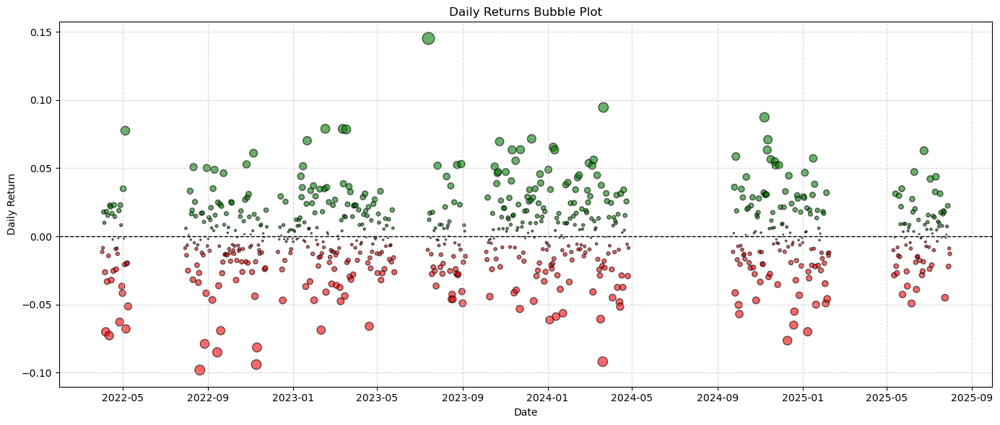

In [43]:
perf.plot_daily_returns_bubble(df_final[(df_final.index >= pd.Timestamp(start_date).date())], return_col='portfolio_daily_pct_returns')

<Axes: xlabel='date'>

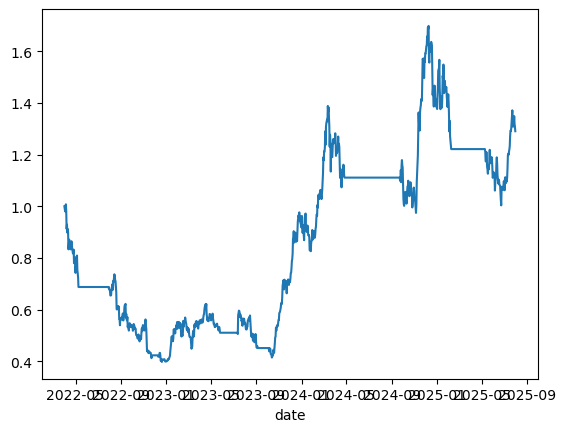

In [44]:
df_final['equity_curve'].plot()

<Axes: xlabel='date'>

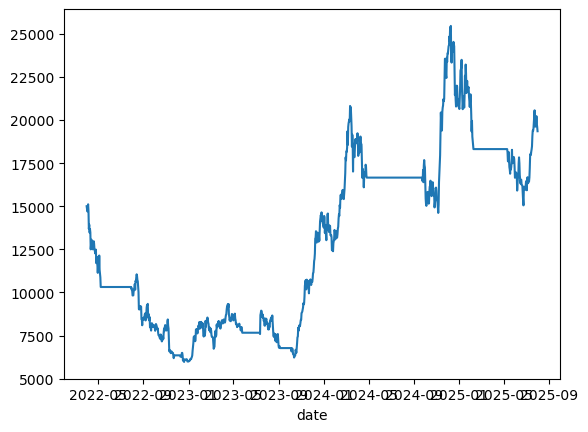

In [45]:
df_final['total_portfolio_value'].plot()

## Add Rolling R Squared Filter

### 📘 Pearson Correlation Coefficient Formula

The Pearson correlation coefficient \( r \) is given by:

$$
r = \frac{\sum_{i=1}^{n} (x_i - \bar{x})(y_i - \bar{y})}
         {\sqrt{\sum_{i=1}^{n} (x_i - \bar{x})^2} \cdot \sqrt{\sum_{i=1}^{n} (y_i - \bar{y})^2}}
$$

Where:

- \( x_i, y_i \) are individual data points  
- \( \bar{x}, \bar{y} \) are the sample means of \( x \) and \( y \)  
- \( n \) is the number of observations


### 📘 Simplified Pearson Correlation Formula (Using Raw Sums)

The Pearson correlation coefficient \( r \) can also be written as:

$$
r = \frac{n \sum x_i y_i - \sum x_i \sum y_i}
         {\sqrt{n \sum x_i^2 - (\sum x_i)^2} \cdot \sqrt{n \sum y_i^2 - (\sum y_i)^2}}
$$

Where:

- \( x_i, y_i \) are the data values  
- \( n \) is the number of observations  
- \( \sum x_i y_i \) is the sum of the elementwise products  
- \( \sum x_i \), \( \sum y_i \) are the sums of each series  
- \( \sum x_i^2 \), \( \sum y_i^2 \) are the sums of squares


In [43]:
def calculate_rolling_r2(df, ticker, t_1_close_price_col, rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3):

    log_price_col = f'{ticker}_t_1_close_price_log'
    df[log_price_col] = np.log(df[t_1_close_price_col])
    
    ## Define the variables
    y = df[log_price_col]
    x = np.arange(len(y), dtype=float) # Time

    ## Compute rolling sums for rolling R2 calculation
    x_sum = pd.Series(x, y.index).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    y_sum = y.rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    x_sqr = pd.Series(x**2, y.index).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    y_sqr = (y**2).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    xy_sum = pd.Series(x, y.index).mul(y).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()

    ## Calculate the R squared
    n = rolling_r2_window
    numerator = n * xy_sum - x_sum * y_sum
    denominator = np.sqrt((n * x_sqr) - (x_sum ** 2)) * np.sqrt((n * y_sqr) - (y_sum**2))
    df[f'{ticker}_rolling_r_sqr'] = (numerator / denominator) ** 2

    ## Normalize the R Squared centered around 0.5 where values below the lower limit are
    ## clipped to 0 and values above the upper limit are clipped to 1
    df[f'{ticker}_rolling_r_sqr'] = np.clip((df[f'{ticker}_rolling_r_sqr'] - lower_r_sqr_limit) / (upper_r_sqr_limit - lower_r_sqr_limit), 0, 1)

    ## Smoothing the Rolling R Squared Signal
    if r2_smooth_window >= 1:
        df[f'{ticker}_rolling_r_sqr'] = df[f'{ticker}_rolling_r_sqr'].ewm(span=r2_smooth_window, adjust=False).mean()

    ## Adding Convex Scaling to further reduce the signal during low trends and amplify during high trends
    # df[f'{ticker}_rolling_r_sqr'] = df[f'{ticker}_rolling_r_sqr'].clip(0, 1) ** 1.5

    return df

In [45]:
## Original Signal
def generate_trend_signal_with_donchian_channel_continuous_with_rolling_r_sqr(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window, 
                                                                              exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                                              rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                                              use_activation=True, tanh_activation_constant_dict=None, 
                                                                              moving_avg_type='exponential', price_or_returns_calc='price',
                                                                              long_only=False, use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    # Pull Close Prices from Coinbase
    date_list = cn.coinbase_start_date_by_ticker_dict
    if use_saved_files:
        file_end_date = pd.Timestamp(saved_file_end_date).date()
        filename = f"{ticker}-pickle-{pd.Timestamp(date_list[ticker]).strftime('%Y-%m-%d')}-{file_end_date.strftime('%Y-%m-%d')}"
        output_file = f'coinbase_historical_price_folder/{filename}'
        df = pd.read_pickle(output_file)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    else:
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                            end_date=end_date, save_to_file=False)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_signal_col = f'{ticker}_final_signal'

    ## Generate Trend Signal in Log Space
    df_trend = create_trend_strategy_log_space(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window)
    
    ## Generate Donchian Channels
    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian = calculate_donchian_channel_dual_window(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                                         entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                         use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    t_1_close_col = f't_1_close'
    df_donchian[t_1_close_col] = df_donchian[f'close'].shift(1)
    donchian_entry_upper_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'
    donchian_entry_lower_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}'
    donchian_entry_middle_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_middle_band_{price_or_returns_calc}'
    donchian_exit_upper_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'
    donchian_exit_lower_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'
    donchian_exit_middle_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_middle_band_{price_or_returns_calc}'
    shift_cols = [donchian_entry_upper_band_col, donchian_entry_lower_band_col, donchian_entry_middle_band_col,
                  donchian_exit_upper_band_col, donchian_exit_lower_band_col, donchian_exit_middle_band_col]
    for col in shift_cols:
        df_donchian[f'{col}_t_2'] = df_donchian[col].shift(1)

    # Donchian Continuous Signal
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_entry_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_entry_upper_band_col}_t_2'] - df_donchian[f'{donchian_entry_lower_band_col}_t_2']))

    ## Calculate Donchian Channel Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_donchian[donchian_continuous_signal_rank_col] = pct_rank(df_donchian[donchian_continuous_signal_col]) - 0.5

    # Donchian Binary Signal
    gate_long_condition  = df_donchian[t_1_close_col] >= df_donchian[f'{donchian_exit_lower_band_col}_t_2']
    gate_short_condition = df_donchian[t_1_close_col] <= df_donchian[f'{donchian_exit_upper_band_col}_t_2']
    # sign of *entry* score decides direction
    entry_sign = np.sign(df_donchian[donchian_continuous_signal_col])
    # treat exact zero as "flat but allowed" (gate=1) so ranking not wiped out
    entry_sign = np.where(entry_sign == 0, 1, entry_sign)  # default to long-side keep
    df_donchian[donchian_binary_signal_col] = np.where(
        entry_sign > 0, gate_long_condition, gate_short_condition).astype(float)
    
    # Merging the Trend and Donchian Dataframes
    donchian_cols = [t_1_close_col, f'{donchian_entry_upper_band_col}_t_2', f'{donchian_entry_lower_band_col}_t_2', f'{donchian_entry_middle_band_col}_t_2',
                     f'{donchian_exit_upper_band_col}_t_2', f'{donchian_exit_lower_band_col}_t_2', f'{donchian_exit_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    ## Trend and Donchian Channel Signal
    # Calculate the exponential weighted average of the ranked signals to remove short-term flip flops (whiplash)
    df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]] = (
        df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]].ewm(span=weighted_signal_ewm_window, adjust=False).mean())

    # Weighted Sum of Rank Columns
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_rank_col] +
                                                    donchian_signal_weight * df_trend[donchian_continuous_signal_rank_col])
    
    # Apply Binary Gate
    if use_donchian_exit_gate:
        df_trend[final_weighted_additive_signal_col] = df_trend[final_weighted_additive_signal_col] * df_trend[donchian_binary_signal_col]
        
    ## Calculate Rolling R Squared Signal
    df_trend = calculate_rolling_r2(df_trend, ticker=ticker, t_1_close_price_col=t_1_close_col, rolling_r2_window=rolling_r2_window,
                                    lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window)

    ## Apply Regime Filters
    # Introduce a 3-day confirmation period for Rolling R Squared Signal
    if r2_confirm_days >= 1:
        df_trend[f'{ticker}_r2_enable'] = (df_trend[f'{ticker}_rolling_r_sqr'] > 0.5).rolling(r2_confirm_days, min_periods=r2_confirm_days).min().fillna(0.0).astype(float)
        df_trend[final_signal_col] = df_trend[final_weighted_additive_signal_col] * df_trend[f'{ticker}_rolling_r_sqr'] * df_trend[f'{ticker}_r2_enable']
    else:
        df_trend[final_signal_col] = df_trend[final_weighted_additive_signal_col] * df_trend[f'{ticker}_rolling_r_sqr']
    
    ## Long-Only Filter
    df_trend[final_signal_col] = np.where(long_only, np.maximum(0, df_trend[final_signal_col]), df_trend[final_signal_col])

    return df_trend

def get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window, 
                                                               exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                               rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                               use_activation=True, tanh_activation_constant_dict=None, 
                                                               moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                               use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    
    for ticker in ticker_list:
        # Create Column Names
        donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
        donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
        trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
        trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
        final_signal_col = f'{ticker}_final_signal'
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        rolling_r2_col = f'{ticker}_rolling_r_sqr'
        # rolling_r2_enable_col = f'{ticker}_r2_enable'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            run_date = pd.to_datetime(date_list[ticker]).date()
        else:
            run_date = start_date
            
        df_trend = generate_trend_signal_with_donchian_channel_continuous_with_rolling_r_sqr(
            start_date=start_date, end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window,
            entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
            ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
            rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
            use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict, 
            moving_avg_type=moving_avg_type, price_or_returns_calc=price_or_returns_calc, long_only=long_only,
            use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)
            
        trend_cols = [close_price_col, open_price_col, trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col,
                      rolling_r2_col, final_signal_col]
        # trend_cols = [close_price_col, open_price_col, lower_donchian_col, upper_donchian_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col,
        #               trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col, final_signal_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [184]:
def apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, 
                                                                                   entry_rolling_donchian_window, exit_rolling_donchian_window, use_donchian_exit_gate, 
                                                                                   ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window=4,
                                                                                   rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                                                   use_activation=True, tanh_activation_constant_dict=None,
                                                                                   moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                                                   initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                                                   rolling_atr_window=20, atr_multiplier=0.5,
                                                                                   transaction_cost_est=0.001, passive_trade_rate=0.05, notional_threshold_pct=0.05, cooldown_counter_threshold=3,
                                                                                   use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31', 
                                                                                   rolling_sharpe_window=50, cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                                                   annual_trading_days=365, use_specific_start_date=False, signal_start_date=None):

    ## Check if data is available for all the tickers
    date_list = cn.coinbase_start_date_by_ticker_dict
    ticker_list = [ticker for ticker in ticker_list if pd.Timestamp(date_list[ticker]).date() < end_date]
    
    print('Generating Moving Average Ribbon Signal!!')
    ## Generate Trend Signal for all tickers
    df_trend = get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                          slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                                                                          entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                                          use_donchian_exit_gate=use_donchian_exit_gate,
                                                                          ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                                                                          rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit,
                                                                          r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                                                                          use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                                                                          moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc, 
                                                                          use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    print('Generating Volatility Adjusted Trend Signal!!')
    ## Get Volatility Adjusted Trend Signal
    df_signal = size_cont.get_volatility_adjusted_trend_signal_continuous(df_trend, ticker_list, volatility_window, annual_trading_days)

    print('Getting Average True Range for Stop Loss Calculation!!')
    ## Get Average True Range for Stop Loss Calculation
    df_atr = size_cont.get_average_true_range_portfolio(start_date=start_date, end_date=end_date, ticker_list=ticker_list, rolling_atr_window=rolling_atr_window,
                                                        price_or_returns_calc='price', use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files,
                                                        saved_file_end_date=saved_file_end_date)
    df_signal = pd.merge(df_signal, df_atr, left_index=True, right_index=True, how='left')

    print('Calculating Volatility Targeted Position Size and Cash Management!!')
    ## Get Target Volatility Position Sizing and Run Cash Management
    df = size_cont.get_target_volatility_daily_portfolio_positions(df_signal, ticker_list=ticker_list, initial_capital=initial_capital, rolling_cov_window=rolling_cov_window,
                                                                   rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier, cash_buffer_percentage=cash_buffer_percentage,
                                                                   annualized_target_volatility=annualized_target_volatility, transaction_cost_est=transaction_cost_est,
                                                                   passive_trade_rate=passive_trade_rate, notional_threshold_pct=notional_threshold_pct,
                                                                   cooldown_counter_threshold=cooldown_counter_threshold, annual_trading_days=annual_trading_days,
                                                                   use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

    print('Calculating Portfolio Performance!!')
    ## Calculate Portfolio Performance
    df = size_bin.calculate_portfolio_returns(df, rolling_sharpe_window)

    return df

In [87]:
rolling_r2_window=30; lower_r_sqr_limit=0.2; upper_r_sqr_limit=0.8; 
## Check if data is available for all the tickers
date_list = cn.coinbase_start_date_by_ticker_dict
ticker_list = [ticker for ticker in ticker_list if pd.Timestamp(date_list[ticker]).date() < end_date]

print('Generating Moving Average Ribbon Signal!!')
## Generate Trend Signal for all tickers
df_trend = get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                      slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                                                                      entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                                      use_donchian_exit_gate=use_donchian_exit_gate,
                                                                      ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                                                                      rolling_r2_window=100, lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0,
                                                                      use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                                                                      moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc, 
                                                                      use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

Generating Moving Average Ribbon Signal!!


<Axes: xlabel='date'>

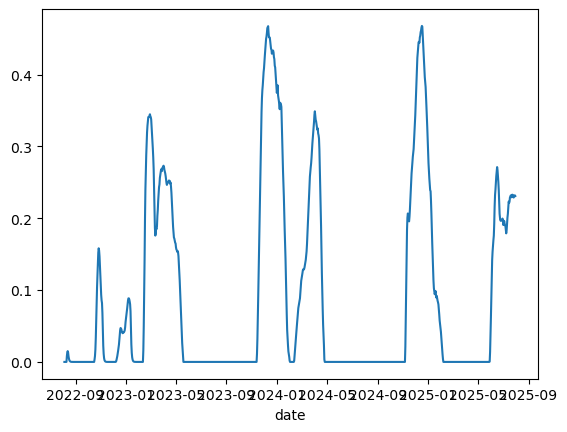

In [72]:
df_trend['BTC-USD_final_signal'].plot()

In [196]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-07-31').date()
df_final_with_rolling_r2_test = tf.apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, 
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final_with_rolling_r2_test = df_final_with_rolling_r2_test[df_final_with_rolling_r2_test.index >= start_date]
df_final_with_rolling_r2_test = calculate_asset_level_returns(df_final_with_rolling_r2_test, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [197]:
calculate_risk_and_performance_metrics(df_final_with_rolling_r2_test, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': -0.004708056108961967,
 'annualized_sharpe_ratio': 0.10494827233149469,
 'calmar_ratio': -0.007545847318089719,
 'annualized_std_dev': 0.5701236687241779,
 'max_drawdown': -0.6239267653448681,
 'max_drawdown_duration': Timedelta('696 days 00:00:00'),
 'hit_rate': 0.3218390804597701,
 't_statistic': 0.3898821006736223,
 'p_value': 0.6966919514682504,
 'trade_count': 2253.0}

In [190]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-07-31').date()
df_final_with_rolling_r2 = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, 
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final_with_rolling_r2 = df_final_with_rolling_r2[df_final_with_rolling_r2.index >= start_date]
df_final_with_rolling_r2 = calculate_asset_level_returns(df_final_with_rolling_r2, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [194]:
calculate_risk_and_performance_metrics(df_final_with_rolling_r2, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': -0.004708056108961967,
 'annualized_sharpe_ratio': 0.10494827233149469,
 'calmar_ratio': -0.007545847318089719,
 'annualized_std_dev': 0.5701236687241779,
 'max_drawdown': -0.6239267653448681,
 'max_drawdown_duration': Timedelta('696 days 00:00:00'),
 'hit_rate': 0.3218390804597701,
 't_statistic': 0.3898821006736223,
 'p_value': 0.6966919514682504,
 'trade_count': 2253.0}

<Axes: xlabel='date'>

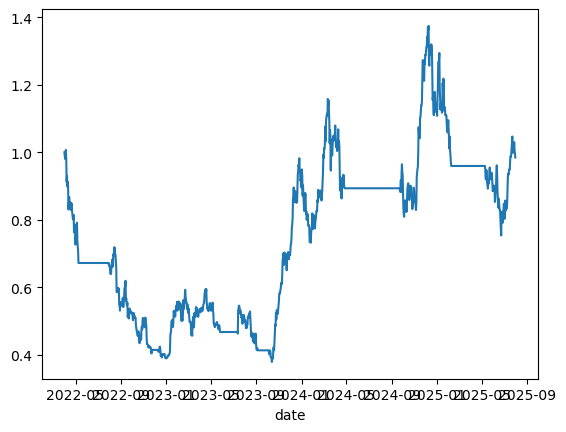

In [200]:
df_final_with_rolling_r2['equity_curve'].plot()

## Walk Forward Analysis for Rolling R Squared

In [49]:
import itertools

def generate_rolling_r_sqr_params():
    parameter_grid = {
        "rolling_r2_window": [14, 20, 30, 50, 80, 100, 126],
        "lower_r_sqr_limit": [0.15, 0.25, 0.35, 0.45],
        "upper_r_sqr_limit": [0.60, 0.75, 0.80, 0.90]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [51]:
def run_walk_forward_rolling_r_sqr(start_date, end_date, ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                   entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                   ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'rolling_r2_window', 'lower_r_sqr_limit', 'upper_r_sqr_limit', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_rolling_r_sqr_params():
            print(params)
            rolling_r2_window = params['rolling_r2_window']
            lower_r_sqr_limit = params['lower_r_sqr_limit']
            upper_r_sqr_limit = params['upper_r_sqr_limit']
            
            print(rolling_r2_window, lower_r_sqr_limit, upper_r_sqr_limit)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                use_donchian_exit_gate=use_donchian_exit_gate,
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, 
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'rolling_r2_window': rolling_r2_window,
                'lower_r_sqr_limit': lower_r_sqr_limit,
                'upper_r_sqr_limit': upper_r_sqr_limit
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        walk_forward_run_cond = in_sample_cond & date_cond

        ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        best_rolling_r2_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['rolling_r2_window'].iloc[0]
        best_lower_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['lower_r_sqr_limit'].iloc[0]
        best_upper_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['upper_r_sqr_limit'].iloc[0]
        
        ## Out of Sample Dataframe
        print('Pulling Out of Sample Data!!')
        df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
            start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
            mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
            use_donchian_exit_gate=use_donchian_exit_gate,
            ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
            rolling_r2_window=best_rolling_r2_window, lower_r_sqr_limit=best_lower_r_sqr_limit, upper_r_sqr_limit=best_upper_r_sqr_limit,
            use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
            moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
            initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
            rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
            use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
            rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
            annualized_target_volatility=annualized_target_volatility,
            annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
        print('Calculating Out of Sample Asset Returns!!')
        df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
        
        ## Out of Sample Performance Metrics
        print('Pulling Out of Sample Performance Metrics!!')
        row_parameters_os = {
            'sampling_category': 'out_sample',
            'start_date': start_date_os,
            'end_date': end_date_os,
            'rolling_r2_window': best_rolling_r2_window,
            'lower_r_sqr_limit': best_lower_r_sqr_limit,
            'upper_r_sqr_limit': best_upper_r_sqr_limit
        }
        portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                           strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                           passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

        print('Getting Out of Sample Asset Performance!!')
        for ticker in ticker_list:
            ## Out of Sample
            ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                 strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                 annual_trading_days=365, include_transaction_costs_and_fees=False)
            ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
            ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
            portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
        
        row_parameters_os.update(portfolio_perf_metrics_os)

        ## Assign out of sample metrics to performance dataframe
        df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [53]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-10-01').date()
start_date = pd.Timestamp(start_date).date()
end_date = pd.Timestamp(end_date).date()
perf_cols = ['sampling_category', 'start_date', 'end_date', 'rolling_r2_window', 'lower_r_sqr_limit', 'upper_r_sqr_limit', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
             'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count', 'ticker_sharpe_mean', 'ticker_sharpe_std', 'turnover', 'rolling_r2_score']
ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])

df_performance = pd.DataFrame(columns=perf_cols)

IS_LEN = pd.DateOffset(months=18)
OS_LEN = pd.DateOffset(months=6)
start_date_is = start_date
last_available_date = pd.Timestamp('2025-07-31').date()
WARMUP_DAYS = 323
while True:
    end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
    start_date_os = (end_date_is + pd.Timedelta(days=1))
    end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
    fmt = "%Y-%m-%d"
    
    fields = [
        ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
        ("IS start",          start_date_is),
        ("IS end",            end_date_is),
        ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
        ("OS start",          start_date_os),
        ("OS end",            end_date_os),
    ]
    
    print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    ## Break Condition for While loop
    if end_date_os > end_date - pd.Timedelta(days=1):
        break

    if end_date_os > last_available_date:
        print('end_date_os > last_available_date')
        end_date_os = last_available_date
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
    
    print("Run Dates: ")
    print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))

    start_date_is = (start_date_is + OS_LEN).date()

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS s

In [135]:
%%time
df_performance_rolling_r2_1 = run_walk_forward_rolling_r_sqr(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                             entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                             ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.6}
14 0.15 0.6
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.75}
14 0.15 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average T

In [136]:
df_performance_rolling_r2_1

,sampling_category,start_date,end_date,rolling_r2_window,lower_r_sqr_limit,upper_r_sqr_limit,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,14,0.15,0.60,-0.605355,-2.197697,-0.723289,0.579904,-0.836948,543 days,0.209859,-2.897840,0.003873,914.0,0.060991,-0.097304,-0.116875,-0.171776,-0.045766,0.154024,-0.897480,-0.854461,-2.037706,-0.961378,0.173914,0.276788,0.340659,0.198202,0.183864,-0.107921,-0.288590,-0.287165,-0.324914,-0.160165
1,in_sample,2022-04-01,2023-09-30,14,0.15,0.75,-0.605121,-2.192787,-0.723440,0.578227,-0.836450,543 days,0.209859,-2.891216,0.003955,926.0,0.064068,-0.098555,-0.118631,-0.176305,-0.045998,0.182302,-0.903354,-0.862447,-2.061515,-0.952267,0.175589,0.277589,0.341582,0.200387,0.185915,-0.108983,-0.294480,-0.287165,-0.331806,-0.156482
2,in_sample,2022-04-01,2023-09-30,14,0.15,0.80,-0.603084,-2.180086,-0.722420,0.577375,-0.834810,543 days,0.209859,-2.873513,0.004181,927.0,0.065219,-0.099008,-0.117699,-0.173645,-0.047102,0.193131,-0.905897,-0.855033,-2.032813,-0.962567,0.175446,0.277768,0.342147,0.200498,0.186222,-0.108294,-0.296561,-0.287165,-0.327860,-0.157735
3,in_sample,2022-04-01,2023-09-30,14,0.15,0.90,-0.603846,-2.183066,-0.722856,0.578689,-0.835362,543 days,0.208451,-2.877781,0.004125,927.0,0.063322,-0.097772,-0.118448,-0.173850,-0.049061,0.175924,-0.895529,-0.859417,-2.011683,-0.986127,0.174277,0.278185,0.342214,0.202729,0.185843,-0.107399,-0.297923,-0.287165,-0.328342,-0.159156
4,in_sample,2022-04-01,2023-09-30,14,0.25,0.60,-0.598776,-2.223629,-0.720059,0.571532,-0.831566,543 days,0.195775,-2.929677,0.003502,826.0,0.026761,-0.058773,-0.042850,-0.164127,-0.056386,-0.197912,-0.607107,-0.434568,-1.900025,-0.939650,0.170333,0.303290,0.351853,0.212371,0.217869,-0.111967,-0.282781,-0.183403,-0.314846,-0.183071
5,in_sample,2022-04-01,2023-09-30,14,0.25,0.75,-0.596314,-2.206197,-0.719194,0.570564,-0.829142,543 days,0.197183,-2.905504,0.003781,841.0,0.029546,-0.062481,-0.044507,-0.166855,-0.055874,-0.164278,-0.627703,-0.442347,-1.928938,-0.920919,0.173063,0.304917,0.352974,0.212229,0.220776,-0.114099,-0.292368,-0.183403,-0.318088,-0.181140
6,in_sample,2022-04-01,2023-09-30,14,0.25,0.80,-0.597108,-2.206732,-0.719581,0.569741,-0.829800,543 days,0.198592,-2.906541,0.003768,847.0,0.029852,-0.062821,-0.046088,-0.166921,-0.057204,-0.159989,-0.629300,-0.451240,-1.912706,-0.931267,0.173807,0.305175,0.353189,0.214026,0.221317,-0.115285,-0.294950,-0.183403,-0.318116,-0.183596
7,in_sample,2022-04-01,2023-09-30,14,0.25,0.90,-0.596370,-2.203653,-0.719287,0.570313,-0.829112,543 days,0.197183,-2.902150,0.003821,848.0,0.029862,-0.061638,-0.046377,-0.166992,-0.058526,-0.162266,-0.620545,-0.452716,-1.893582,-0.947856,0.172178,0.305518,0.353312,0.216177,0.220522,-0.112628,-0.296246,-0.183403,-0.318002,-0.183547
8,in_sample,2022-04-01,2023-09-30,14,0.35,0.60,-0.608860,-2.387198,-0.725141,0.561859,-0.839643,543 days,0.171831,-3.151409,0.001693,747.0,0.028724,-0.047731,0.011769,-0.194581,-0.092827,-0.192752,-0.521198,-0.138792,-1.956129,-1.282408,0.169706,0.329875,0.361792,0.253404,0.235118,-0.114159,-0.248520,-0.143226,-0.368690,-0.205700
9,in_sample,2022-04-01,2023-09-30,14,0.35,0.75,-0.603630,-2.349194,-0.722925,0.562950,-0.834983,543 days,0.174648,-3.098630,0.002021,766.0,0.030713,-0.053223,0.008254,-0.194265,-0.091134,-0.164396,-0.549989,-0.158516,-1.959324,-1.2

In [137]:
df_performance_rolling_r2_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2022-04-01-2024-04-01.pickle')

In [138]:
%%time
df_performance_rolling_r2_2 = run_walk_forward_rolling_r_sqr(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                             entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                             ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.6}
14 0.15 0.6
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.75}
14 0.15 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average T

In [139]:
df_performance_rolling_r2_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2022-10-01-2024-10-01.pickle')

In [140]:
%%time
df_performance_rolling_r2_3 = run_walk_forward_rolling_r_sqr(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                             entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                             ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.6}
14 0.15 0.6
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.75}
14 0.15 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average T

In [141]:
df_performance_rolling_r2_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2023-04-01-2025-04-01.pickle')

In [142]:
%%time
df_performance_rolling_r2_4 = run_walk_forward_rolling_r_sqr(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                             entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                             ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.6}
14 0.15 0.6
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'rolling_r2_window': 14, 'lower_r_sqr_limit': 0.15, 'upper_r_sqr_limit': 0.75}
14 0.15 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjuste

In [143]:
df_performance_rolling_r2_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2023-10-01-2025-10-01.pickle')

In [153]:
df_performance_rolling_r2 = pd.concat([df_performance_rolling_r2_1, df_performance_rolling_r2_2,
                                       df_performance_rolling_r2_3, df_performance_rolling_r2_4], axis=0, ignore_index=True)

In [155]:
df_performance_rolling_r2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2022-04-01-2025-10-01.pickle')

### Analyze Walk Forward Results from Rolling R Squared

In [95]:
df_performance_rolling_r2 = pd.read_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Performance-2022-04-01-2025-10-01.pickle')

In [97]:
df_performance_rolling_r2_is = df_performance_rolling_r2[df_performance_rolling_r2.sampling_category == 'in_sample'].reset_index(drop=True)
df_performance_rolling_r2_os = df_performance_rolling_r2[df_performance_rolling_r2.sampling_category == 'out_sample'].reset_index(drop=True)

In [114]:
agg_dict = {'annualized_sharpe_ratio':['median','mean','std'],
            'annualized_return':['median','mean','std'],
            'max_drawdown':['median','mean','std'],
            'trade_count':['median','mean','std'],
            'BTC-USD_annualized_sharpe_ratio':['median','mean','std'],
            'ETH-USD_annualized_sharpe_ratio':['median','mean','std'],
            'SOL-USD_annualized_sharpe_ratio':['median','mean','std'],
            'ADA-USD_annualized_sharpe_ratio':['median','mean','std'],
            'AVAX-USD_annualized_sharpe_ratio':['median','mean','std']}

In [105]:
# ## Best In Sample Perforamance by Fold
# df_best_score_per_fold_is = df_performance_rolling_r2_is.groupby(['start_date','end_date']).agg(agg_dict).reset_index()
# perf_cols = ['rolling_r2_score','rolling_r2_window','lower_r_sqr_limit','upper_r_sqr_limit','annualized_sharpe_ratio','annualized_std_dev','max_drawdown','trade_count']
# df_best_score_per_fold_is = pd.merge(df_best_score_per_fold_is, df_performance_rolling_r2_is[perf_cols], on='rolling_r2_score',how='inner')
# df_best_score_per_fold_is

In [107]:
df_performance_rolling_r2_os

,sampling_category,start_date,end_date,rolling_r2_window,lower_r_sqr_limit,upper_r_sqr_limit,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,0.754504,1.791767,4.146337,0.591695,-0.181969,323 days,0.175258,2.244515,0.025250,299.0,0.114914,0.216032,0.093085,0.132412,0.136989,0.617686,1.215048,0.533397,1.007821,0.987882,0.210551,0.245516,0.166570,0.182780,0.191066,-0.052472,-0.127634,-0.044004,-0.045807,-0.059199
1,out_sample,2024-04-01,2024-09-30,126,0.15,0.9,-0.069894,-0.836694,-0.449353,0.554462,-0.155543,309 days,0.032990,-0.545076,0.585952,43.0,-0.031339,-0.031050,-0.009709,0.009139,0.029385,-1.026853,-2.017102,-5.659033,-2.391760,-0.299244,0.346024,0.218476,0.071315,0.174314,0.490207,-0.096664,-0.058369,-0.013141,-0.006473,-0.038956
2,out_sample,2024-10-01,2025-03-31,126,0.15,0.9,0.037346,0.092228,0.145114,0.542099,-0.257358,307 days,0.128099,0.311660,0.755433,238.0,0.166789,-0.007681,-0.044711,-0.005523,0.019259,0.954060,-1.121604,-2.565562,-0.324142,-0.510961,0.262650,0.129472,0.099147,0.283263,0.142827,-0.050619,-0.056496,-0.067009,-0.097383,-0.056725
3,out_sample,2025-04-01,2025-07-31,100,0.25,0.9,0.042860,0.016397,0.217895,0.376415,-0.196700,341 days,0.101415,0.406756,0.684393,77.0,0.048478,0.073538,0.003058,0.000000,-0.013330,0.018425,0.392582,-1.333190,-inf,-5.812817,0.189727,0.166117,0.113026,NaN,0.073270,-0.059336,-0.079415,-0.027278,0.000000,-0.015527


In [109]:
## Overall Out of Sample Stats
df_performance_rolling_r2_is.groupby(['rolling_r2_window']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                   median      mean       std   
rolling_r2_window                                               
126                              0.978254  0.663896  0.742160   
100                              0.939202  0.603675  0.784023   
50                               0.959310  0.484024  0.982255   
80                               0.717011  0.364149  0.768021   
30                               0.626694  0.209947  0.945099   
20                               0.356584 -0.113585  0.967079   
14                              -0.232468 -0.604335  0.982530   

                  annualized_return                     max_drawdown  \
                             median      mean       std       median   
rolling_r2_window                                                      
126                        0.346473  0.263670  0.291370    -0.356464   
100                        0.352633  0.251375  0.283263    -0.337942   
50                         0.361237  0.226123  0.355046    -0.368290   
80                         0.245978  0.151641  0.261842    -0.330252   
30                         0.224605  0.105532  0.317722    -0.406735   
20                         0.118078 -0.015128  0.294502    -0.443522   
14                        -0.091807 -0.170432  0.255690    -0.529890   

                                      trade_count                          \
                       mean       std      median        mean         std   
rolling_r2_window                                                           
126               -0.367786  0.122010       538.5  546.937500  117.666043   
100               -0.350202  0.121737       519.0  522.718750  139.008447   
50                -0.397423  0.122642       605.5  607.640625  126.814997   
80                -0.366205  0.111093       548.5  554.906250  141.437711   
30                -0.450995  0.136441       631.5  663.453125  127.849854   
20                -0.494658  0.157827       710.5  742.843750  163.904174   
14                -0.568709  0.163160       803.0  812.734375  180.867683   

                  BTC-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
126                                      0.110792  0.319053  0.398862   
100                                      0.565362  0.413848  0.467929   
50                                       0.227651  0.059018  0.696054   
80                                       0.588235  0.440770  0.426782   
30                                       0.102835 -0.131353  0.761686   
20                                       0.139502  0.141284  0.364047   
14                                      -0.119711 -0.075176  0.300934   

                  ETH-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
126                                      0.381041  0.377102  0.369672   
100                                      0.468110  0.291732  0.563796   
50                                      -0.228414 -0.364867  0.342022   
80                                       0.591482  0.354722  0.598333   
30                                       0.367097  0.150160  0.498000   
20                                       0.643976  0.480176  0.577686   
14                                       1.391729  0.948106  0.918723   

                  SOL-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
126                                     -0.073456 -0.095784  0.337380   
100                                     -0.078962 -0.006589  0.717603   
50                                       0.74938

In [111]:
## Overall Out of Sample Stats
df_performance_rolling_r2_os.groupby(['rolling_r2_window']).agg(agg_dict)

annualized_sharpe_ratio                      \
                                   median      mean       std   
rolling_r2_window                                               
100                              0.904082  0.904082  1.255376   
126                             -0.372233 -0.372233  0.656847   

                  annualized_return                     max_drawdown  \
                             median      mean       std       median   
rolling_r2_window                                                      
100                        0.398682  0.398682  0.503208    -0.189334   
126                       -0.016274 -0.016274  0.075830    -0.206450   

                                      trade_count                     \
                       mean       std      median   mean         std   
rolling_r2_window                                                      
100               -0.189334  0.010416       188.0  188.0  156.977705   
126               -0.206450  0.071994       140.5  140.5  137.885822   

                  BTC-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
100                                      0.318055  0.318055  0.423742   
126                                     -0.036396 -0.036396  1.400717   

                  ETH-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
100                                      0.803815  0.803815  0.581571   
126                                     -1.569353 -1.569353  0.633212   

                  SOL-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
100                                     -0.399897 -0.399897  1.319876   
126                                     -4.112297 -4.112297  2.187414   

                  ADA-USD_annualized_sharpe_ratio                      \
                                           median      mean       std   
rolling_r2_window                                                       
100                                          -inf      -inf       NaN   
126                                     -1.357951 -1.357951  1.462027   

                  AVAX-USD_annualized_sharpe_ratio                      
                                            median      mean       std  
rolling_r2_window                                                       
100                                      -2.412468 -2.412468  4.808821  
126                                      -0.405103 -0.405103  0.149706

In [175]:
df_performance_rolling_r2_is.groupby(['rolling_r2_window','lower_r_sqr_limit','upper_r_sqr_limit']).agg(agg_dict).reset_index().sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit  \
                                                            
99                126              0.15              0.90   
98                126              0.15              0.80   
97                126              0.15              0.75   
96                126              0.15              0.60   
90                100              0.35              0.80   
91                100              0.35              0.90   
89                100              0.35              0.75   
88                100              0.35              0.60   
103               126              0.25              0.90   
102               126              0.25              0.80   
101               126              0.25              0.75   
100               126              0.25              0.60   
94                100              0.45              0.80   
93                100              0.45              0.75   
95                100              0.45              0.90   
92                100              0.45              0.60   
59                 50              0.35              0.90   
56                 50              0.35              0.60   
58                 50              0.35              0.80   
57                 50              0.35              0.75   
52                 50              0.25              0.60   
55                 50              0.25              0.90   
54                 50              0.25              0.80   
53                 50              0.25              0.75   
107               126              0.35              0.90   
106               126              0.35              0.80   
105               126              0.35              0.75   
86                100              0.25              0.80   
87                100              0.25              0.90   
85                100              0.25              0.75   
104               126              0.35              0.60   
84                100              0.25              0.60   
111               126              0.45              0.90   
110               126              0.45              0.80   
109               126              0.45              0.75   
48                 50              0.15              0.60   
108               126              0.45              0.60   
81                100              0.15              0.75   
50                 50              0.15              0.80   
51                 50              0.15              0.90   
82                100              0.15              0.80   
49                 50              0.15              0.75   
80                100              0.15              0.60   
83                100              0.15              0.90   
70                 80              0.25              0.80   
69                 80              0.25              0.75   
71                 80              0.25              0.90   
68                 80              0.25              0.60   
79                 80              0.45              0.90   
78                 80              0.45              0.80   
77                 80              0.45              0.75   
76                 80              0.45              0.60   
65                 80              0.15              0.75   
66                 80              0.15              0.80   
67                 80              0.15              0.90   
64                 80              0.15              0.60   
45                 30              0.45              0.75   
46                 30              0.45              0.80   
63                 50              0.45              0.90   
60                 50              0.45              0.60   
47                 30              0.45              0.90   
74                 80              0.35              0.80   
75                 80              0.35              0.90   
62                 50              0.45

In [177]:
df_performance_rolling_r2_os.groupby(['rolling_r2_window','lower_r_sqr_limit','upper_r_sqr_limit']).agg(agg_dict).reset_index().sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit  \
                                                          
1               100              0.45               0.9   
0               100              0.25               0.9   
2               126              0.15               0.9   

  annualized_sharpe_ratio                     annualized_return            \
                   median      mean       std            median      mean   
1                1.791767  1.791767       NaN          0.754504  0.754504   
0                0.016397  0.016397       NaN          0.042860  0.042860   
2               -0.372233 -0.372233  0.656847         -0.016274 -0.016274   

           max_drawdown                     trade_count                     \
       std       median      mean       std      median   mean         std   
1      NaN    -0.181969 -0.181969       NaN       299.0  299.0         NaN   
0      NaN    -0.196700 -0.196700       NaN        77.0   77.0         NaN   
2  0.07583    -0.206450 -0.206450  0.071994       140.5  140.5  137.885822   

  BTC-USD_annualized_sharpe_ratio                      \
                           median      mean       std   
1                        0.617686  0.617686       NaN   
0                        0.018425  0.018425       NaN   
2                       -0.036396 -0.036396  1.400717   

  ETH-USD_annualized_sharpe_ratio                      \
                           median      mean       std   
1                        1.215048  1.215048       NaN   
0                        0.392582  0.392582       NaN   
2                       -1.569353 -1.569353  0.633212   

  SOL-USD_annualized_sharpe_ratio                      \
                           median      mean       std   
1                        0.533397  0.533397       NaN   
0                       -1.333190 -1.333190       NaN   
2                       -4.112297 -4.112297  2.187414   

  ADA-USD_annualized_sharpe_ratio                      \
                           median      mean       std   
1                        1.007821  1.007821       NaN   
0                            -inf      -inf       NaN   
2                       -1.357951 -1.357951  1.462027   

  AVAX-USD_annualized_sharpe_ratio                      
                            median      mean       std  
1                         0.987882  0.987882       NaN  
0                        -5.812817 -5.812817       NaN  
2                        -0.405103 -0.405103  0.149706

In [179]:
df_performance_rolling_r2_is[(df_performance_rolling_r2_is.rolling_r2_window == 100) & (df_performance_rolling_r2_is.lower_r_sqr_limit == 0.45) & (df_performance_rolling_r2_is.upper_r_sqr_limit == 0.90)]

,sampling_category,start_date,end_date,rolling_r2_window,lower_r_sqr_limit,upper_r_sqr_limit,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
95,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,-0.049380,-0.232763,-0.139705,0.589749,-0.353456,282 days,0.129577,-0.072207,0.942457,297.0,0.151304,0.020904,-0.047660,-0.000085,-0.024401,0.871067,-0.234508,-1.632075,-0.531636,-0.753221,0.237450,0.245296,0.182941,0.324125,0.275340,-0.073219,-0.112837,-0.129921,-0.123879,-0.196398
207,in_sample,2022-10-01,2024-03-31,100,0.45,0.9,0.381449,0.983495,1.078020,0.595553,-0.353842,318 days,0.203529,1.721948,0.085443,573.0,0.195315,0.156121,0.012390,0.080039,0.036926,1.057678,0.911145,-0.397674,0.333112,-0.065905,0.224891,0.213113,0.178823,0.246682,0.237112,-0.082220,-0.126482,-0.149978,-0.112098,-0.205032
319,in_sample,2023-04-01,2024-09-30,100,0.45,0.9,0.297860,0.926595,1.371973,0.566227,-0.217103,311 days,0.144536,1.693777,0.090674,373.0,0.029522,0.102382,0.047478,0.090363,0.076746,-0.118368,0.514991,-0.007176,0.608632,0.424736,0.234130,0.222176,0.161048,0.191820,0.191178,-0.102568,-0.126624,-0.044052,-0.045802,-0.058406
431,in_sample,2023-10-01,2025-03-31,100,0.45,0.9,0.332417,0.929327,1.523848,0.571023,-0.218143,323 days,0.170588,1.660828,0.097117,526.0,0.117486,0.090953,0.038057,0.061494,0.084882,0.514526,0.416550,-0.119394,0.183787,0.503660,0.263547,0.215677,0.161246,0.174422,0.160427,-0.102713,-0.144741,-0.068409,-0.070382,-0.058814


## Generate Rolling R Squared Out of Sample Performance for Locked Rolling R Squared Config

In [55]:
import itertools

def generate_rolling_r_sqr_smooth_days_r2_confirm_params():
    parameter_grid = {
        "rolling_r2_window": [100],
        "lower_r_sqr_limit": [0.45],
        "upper_r_sqr_limit": [0.90],
        "r2_smooth_window": [0, 2, 3, 5, 8],
        "r2_confirm_days": [0, 2, 3, 5]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [57]:
def run_walk_forward_rolling_r_sqr_smooth_days_r2_confirm(start_date, end_date, ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                          entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                          ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'rolling_r2_window', 'lower_r_sqr_limit', 'upper_r_sqr_limit', 'r2_smooth_window', 'r2_confirm_days', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_rolling_r_sqr_smooth_days_r2_confirm_params():
            print(params)
            rolling_r2_window = params['rolling_r2_window']
            lower_r_sqr_limit = params['lower_r_sqr_limit']
            upper_r_sqr_limit = params['upper_r_sqr_limit']
            r2_smooth_window = params['r2_smooth_window']
            r2_confirm_days = params['r2_confirm_days']
            
            print(rolling_r2_window, lower_r_sqr_limit, upper_r_sqr_limit, r2_smooth_window, r2_confirm_days)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                use_donchian_exit_gate=use_donchian_exit_gate,
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'rolling_r2_window': rolling_r2_window,
                'lower_r_sqr_limit': lower_r_sqr_limit,
                'upper_r_sqr_limit': upper_r_sqr_limit,
                'r2_smooth_window': r2_smooth_window,
                'r2_confirm_days': r2_confirm_days
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_rolling_r2_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['rolling_r2_window'].iloc[0]
        # best_lower_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['lower_r_sqr_limit'].iloc[0]
        # best_upper_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['upper_r_sqr_limit'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                use_donchian_exit_gate=use_donchian_exit_gate,
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'rolling_r2_window': rolling_r2_window,
                'lower_r_sqr_limit': lower_r_sqr_limit,
                'upper_r_sqr_limit': upper_r_sqr_limit,
                'r2_smooth_window': r2_smooth_window,
                'r2_confirm_days': r2_confirm_days
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [342]:
%%time
df_performance_rolling_r2_smooth_window_confirm_1 = run_walk_forward_rolling_r_sqr_smooth_days_r2_confirm(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                                        entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                                        ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'rolling_r2_window': 100, 'lower_r_sqr_limit': 0.45, 'upper_r_sqr_limit': 0.9, 'r2_smooth_window': 0, 'r2_confirm_days': 0}
100 0.45 0.9 0 0
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!


In [343]:
df_performance_rolling_r2_smooth_window_confirm_1

,sampling_category,start_date,end_date,rolling_r2_window,lower_r_sqr_limit,upper_r_sqr_limit,r2_smooth_window,r2_confirm_days,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,0,0,-0.049380,-0.232763,-0.139705,0.589749,-0.353456,282 days,0.129577,-0.072207,0.942457,297.0,0.151304,0.020904,-0.047660,-0.000085,-0.024401,0.871067,-0.234508,-1.632075,-0.531636,-0.753221,0.237450,0.245296,0.182941,0.324125,0.275340,-0.073219,-0.112837,-0.129921,-0.123879,-0.196398
1,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,0,0,0.754504,1.791767,4.146337,0.591695,-0.181969,323 days,0.175258,2.244515,0.025250,299.0,0.114914,0.216032,0.093085,0.132412,0.136989,0.617686,1.215048,0.533397,1.007821,0.987882,0.210551,0.245516,0.166570,0.182780,0.191066,-0.052472,-0.127634,-0.044004,-0.045807,-0.059199
2,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,0,2,0.169329,0.523535,0.815315,0.949478,-0.207685,367 days,0.071831,0.977884,0.328465,59.0,0.123293,-0.038044,0.026279,-0.073766,0.237207,0.534916,-2.190095,-0.612940,-0.984357,0.981311,0.424241,0.196735,0.392337,0.686900,1.075665,-0.096074,-0.087680,-0.015258,-0.197360,-0.044673
3,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,0,2,0.196575,0.616153,0.749920,0.615801,-0.262128,323 days,0.121649,0.917262,0.359462,187.0,0.083890,-0.064456,0.139860,0.098744,0.041330,0.435900,-1.023860,0.852662,0.641138,-0.140197,0.196963,0.264464,0.235009,0.211525,0.144029,-0.060205,-0.160901,-0.092389,-0.045807,-0.059199
4,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,0,3,0.133553,0.410879,0.643053,0.955497,-0.207685,369 days,0.069014,0.821620,0.411569,58.0,0.105587,-0.037434,0.034163,-0.073160,0.208212,0.425808,-2.339241,-0.427675,-0.978933,0.852085,0.427383,0.188921,0.356852,0.703541,1.123150,-0.096074,-0.073906,-0.008899,-0.197360,-0.044673
5,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,0,3,0.183200,0.575445,0.750274,0.623104,-0.244177,323 days,0.119588,0.870614,0.384396,182.0,0.082403,-0.074204,0.146167,0.095634,0.036268,0.478828,-0.964254,0.903889,0.601754,-0.239028,0.169502,0.306560,0.236878,0.214154,0.144594,-0.035238,-0.168946,-0.092389,-0.045807,-0.059199
6,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,0,5,0.119145,0.366665,0.573682,0.962031,-0.207685,370 days,0.064789,0.766179,0.443825,54.0,0.109116,-0.036386,0.010410,-0.075652,0.217914,0.444842,-2.592935,-2.270615,-1.001713,0.903081,0.436748,0.180789,0.274935,0.739140,1.164659,-0.096074,-0.074992,-0.009061,-0.197360,-0.044672
7,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,0,5,0.207053,0.662671,0.944066,0.576552,-0.219320,323 days,0.113402,0.978717,0.328209,168.0,0.066763,-0.033721,0.144404,0.098610,0.023844,0.285498,-0.595587,0.882143,0.622338,-0.501824,0.158766,0.324725,0.241689,0.223916,0.141962,-0.039058,-0.145551,-0.092389,-0.045807,-0.059199
8,in_sample,2022-04-01,2023-09-30,100,0.45,0.9,2,0,-0.180508,-0.535707,-0.322976,0.462525,-0.558890,543 days,0.230986,-0.552021,0.581108,1083.0,0.061987,0.010904,-0.009791,-0.104104,-0.024241,0.151342,-0.295821,-0.367428,-0.916873,-0.768307,0.223471,0.167924,0.202710,0.250320,0.148555,-0.201019,-0.112837,-0.138425,-0.293817,-0.196303
9,out_sample,2023-10-01,2024-03-31,100,0.45,0.9,2,0,1.305081,2.415209,7.190855,0.577991,-0.181492,323 days,0.193814,2.944313,0.003392,483.0,0.118646,0.219005,0.095361,0.153582,0.456864,0.648616,1.233537,0.551935,1.235952,1.874

In [344]:
df_performance_rolling_r2_smooth_window_confirm_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Smooth_Confirm_Days_Performance-2022-04-01-2024-04-01.pickle')

In [345]:
%%time
df_performance_rolling_r2_smooth_window_confirm_2 = run_walk_forward_rolling_r_sqr_smooth_days_r2_confirm(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                                        entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                                        ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'rolling_r2_window': 100, 'lower_r_sqr_limit': 0.45, 'upper_r_sqr_limit': 0.9, 'r2_smooth_window': 0, 'r2_confirm_days': 0}
100 0.45 0.9 0 0
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!


In [346]:
df_performance_rolling_r2_smooth_window_confirm_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Smooth_Confirm_Days_Performance-2022-10-01-2024-10-01.pickle')

In [347]:
%%time
df_performance_rolling_r2_smooth_window_confirm_3 = run_walk_forward_rolling_r_sqr_smooth_days_r2_confirm(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                                        entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                                        ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'rolling_r2_window': 100, 'lower_r_sqr_limit': 0.45, 'upper_r_sqr_limit': 0.9, 'r2_smooth_window': 0, 'r2_confirm_days': 0}
100 0.45 0.9 0 0
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!


In [348]:
df_performance_rolling_r2_smooth_window_confirm_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Smooth_Confirm_Days_Performance-2023-04-01-2025-04-01.pickle')

In [349]:
%%time
df_performance_rolling_r2_smooth_window_confirm_4 = run_walk_forward_rolling_r_sqr_smooth_days_r2_confirm(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                                        entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                                        ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'rolling_r2_window': 100, 'lower_r_sqr_limit': 0.45, 'upper_r_sqr_limit': 0.9, 'r2_smooth_window': 0, 'r2_confirm_days': 0}
100 0.45 0.9 0 0
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True 

In [350]:
df_performance_rolling_r2_smooth_window_confirm_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Smooth_Confirm_Days_Performance-2023-10-01-2025-10-01.pickle')

In [390]:
df_performance_rolling_r2_smooth_window_confirm = pd.concat([df_performance_rolling_r2_smooth_window_confirm_1, df_performance_rolling_r2_smooth_window_confirm_2,
                                                             df_performance_rolling_r2_smooth_window_confirm_3, df_performance_rolling_r2_smooth_window_confirm_4], axis=0)

In [392]:
df_performance_rolling_r2_smooth_window_confirm.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Smooth_Confirm_Days_Performance-2022-04-01-2025-10-01.pickle')

In [394]:
in_sample_cond = (df_performance_rolling_r2_smooth_window_confirm.sampling_category == 'in_sample')
df_performance_rolling_r2_smooth_window_confirm_is = df_performance_rolling_r2_smooth_window_confirm[in_sample_cond].reset_index(drop=True)
df_performance_rolling_r2_smooth_window_confirm_os = df_performance_rolling_r2_smooth_window_confirm[~in_sample_cond].reset_index(drop=True)

In [398]:
df_performance_rolling_r2_smooth_window_confirm_is.groupby(['r2_smooth_window','r2_confirm_days']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                  median      mean       std   
r2_smooth_window r2_confirm_days                                               
3                0                              1.275666  0.862727  0.887212   
2                0                              1.273874  0.843725  0.921309   
0                0                              0.927961  0.651663  0.590199   
5                0                              0.996691  0.566839  0.961375   
8                0                              0.792684  0.411574  0.956013   
0                2                              0.309864  0.332112  0.372478   
                 5                              0.248139  0.289361  0.308960   
                 3                              0.239251  0.258270  0.339742   
8                5                              0.200684  0.250048  0.212968   
2                3                              0.215230  0.237522  0.354304   
3                5                              0.204010  0.236804  0.291748   
                 3                              0.196859  0.233304  0.280492   
8                2                              0.150334  0.221906  0.226422   
2                2                              0.192135  0.219196  0.335107   
                 5                              0.176111  0.216712  0.300922   
5                3                              0.149703  0.211530  0.228246   
8                3                              0.127146  0.200355  0.213555   
3                2                              0.180643  0.186752  0.341755   
5                5                              0.101605  0.181651  0.190940   
                 2                              0.132102  0.170376  0.261407   

                                 annualized_return                      \
                                            median      mean       std   
r2_smooth_window r2_confirm_days                                         
3                0                        0.501097  0.366736  0.377812   
2                0                        0.501461  0.369373  0.373692   
0                0                        0.315138  0.240587  0.196329   
5                0                        0.405781  0.239399  0.382963   
8                0                        0.310468  0.171906  0.365333   
0                2                        0.106755  0.122822  0.124564   
                 5                        0.086217  0.106221  0.101118   
                 3                        0.085322  0.098330  0.108932   
8                5                        0.070544  0.089197  0.069226   
2                3                        0.078516  0.092293  0.112209   
3                5                        0.073777  0.090298  0.093830   
                 3                        0.071272  0.088588  0.090637   
8                2                        0.056073  0.082542  0.075369   
2                2                        0.072309  0.085961  0.105970   
                 5                        0.066223  0.084195  0.095087   
5                3                        0.058208  0.080105  0.073122   
8                3                        0.051356  0.076464  0.068695   
3                2                        0.069969  0.076655  0.103994   
5                5                        0.044723  0.069988  0.059968   
                 2                        0.054292  0.068615  0.080091   

                                 max_drawdown                     trade_count  \
                                       median      mean       std      median   
r2_smooth_window r2_confirm_days                                                
3                0                  -0.310048 -0.353381  0.159129      1013.5   
2                0                  -0.310111 -0.348963  0.150306      1083.0   
0                0                  -0.285800 -0.285636  0.078536       449.5   
5  

In [396]:
df_performance_rolling_r2_smooth_window_confirm_os.groupby(['r2_smooth_window','r2_confirm_days']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                  median      mean       std   
r2_smooth_window r2_confirm_days                                               
3                0                              0.431403  0.631357  1.356371   
2                0                              0.402861  0.611544  1.369375   
5                0                              0.411287  0.601311  1.307946   
8                0                              0.302105  0.524753  1.264394   
0                0                              0.357099  0.322122  1.254845   
                 2                             -0.004627  0.002208  1.143254   
8                5                             -0.023838 -0.053278  1.023235   
0                5                              0.000867 -0.053896  1.041641   
3                3                             -0.041411 -0.073414  1.062828   
0                3                             -0.067373 -0.075368  1.094307   
2                2                             -0.064583 -0.075937  1.037881   
5                2                             -0.073215 -0.092044  1.033261   
                 5                              0.062705 -0.095008  0.893730   
3                2                             -0.131719 -0.105482  1.052913   
2                3                             -0.102646 -0.106677  1.026044   
5                3                              0.024335 -0.108227  0.946103   
8                3                              0.004669 -0.118435  0.919787   
                 2                             -0.080812 -0.128963  1.024799   
2                5                             -0.058139 -0.160101  0.903654   
3                5                             -0.091211 -0.200491  0.880427   

                                 annualized_return                      \
                                            median      mean       std   
r2_smooth_window r2_confirm_days                                         
3                0                        0.096664  0.350907  0.620379   
2                0                        0.090880  0.356122  0.639682   
5                0                        0.093665  0.323931  0.569833   
8                0                        0.075962  0.296954  0.537790   
0                0                        0.081056  0.207017  0.375594   
                 2                        0.051369  0.051786  0.159480   
8                5                        0.012757  0.060408  0.180678   
0                5                        0.033023  0.046573  0.152734   
3                3                        0.030401  0.042450  0.154142   
0                3                        0.034716  0.039937  0.152687   
2                2                        0.036241  0.034617  0.135013   
5                2                        0.029601  0.037401  0.148770   
                 5                        0.026256  0.044228  0.137474   
3                2                        0.023551  0.028816  0.136380   
2                3                        0.031626  0.032118  0.138822   
5                3                        0.015577  0.041214  0.149121   
8                3                        0.017705  0.041887  0.144977   
                 2                        0.010209  0.045577  0.177246   
2                5                        0.017704  0.027429  0.126879   
3                5                        0.005162  0.026628  0.134107   

                                 max_drawdown                     trade_count  \
                                       median      mean       std      median   
r2_smooth_window r2_confirm_days                                                
3                0                  -0.165892 -0.158531  0.046150       290.5   
2                0                  -0.166065 -0.158591  0.045392       307.5   
5                0                  -0.166030 -0.160556  0.047461       271.5   
8  

In [400]:
df_performance_rolling_r2_smooth_window_confirm.groupby(['sampling_category','start_date']).size()

sampling_category  start_date
in_sample          2022-04-01    20
                   2022-10-01    20
                   2023-04-01    20
                   2023-10-01    20
out_sample         2023-10-01    20
                   2024-04-01    20
                   2024-10-01    20
                   2025-04-01    20
dtype: int64

## Walk Forward Analysis with Locked Parameters With and Without the Rolling R Squared Filter

In [59]:
start_date = pd.to_datetime('2022-04-01').date()
end_date = pd.to_datetime('2023-12-31').date()
start_date_os = pd.to_datetime('2024-01-01').date()
end_date_os = pd.to_datetime('2025-10-01').date()
WARMUP_DAYS = 285
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','ADA-USD','AVAX-USD']#,'XRP-USD','AAVE-USD']
fast_mavg = 20
slow_mavg = 200
mavg_stepsize = 8
mavg_z_score_window = 126
entry_rolling_donchian_window = 56
exit_rolling_donchian_window = 28
use_donchian_exit_gate = False
long_only = True
use_coinbase_data = True
use_saved_files = True
saved_file_end_date = '2025-07-31'
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 2.0
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

ma_crossover_signal_weight = 0.9
donchian_signal_weight = 0.1
weighted_signal_ewm_window = 4
use_activation = False
tanh_activation_constant_dict = None
rolling_r2_window = 100
lower_r_sqr_limit = 0.45
upper_r_sqr_limit = 0.90
r2_smooth_window = 3
r2_confirm_days = 0
log_std_window = 14
coef_of_variation_window = 20
vol_of_vol_z_score_window = 126
vol_of_vol_p_min = 0.1
r2_strong_threshold = 0.75
use_specific_start_date = True
signal_start_date = pd.Timestamp('2022-04-01').date()

In [61]:
print_strategy_params()


Strategy Parameters
-----------------------------------------------------------
start_date                    : 2022-04-01
end_date                      : 2023-12-31
warm_up_days                  : 285
ticker_list                   : ['BTC-USD', 'ETH-USD', 'SOL-USD', 'ADA-USD', 'AVAX-USD']

fast_mavg                     : 20
slow_mavg                     : 200
mavg_stepsize                 : 8
mavg_z_score_window           : 126
moving_avg_type               : exponential
ma_crossover_signal_weight    : 0.9

entry_rolling_donchian_window : 56
exit_rolling_donchian_window  : 28
use_donchian_exit_gate        : False
donchian_signal_weight        : 0.1

volatility_window             : 20
annualized_target_volatility  : 0.7
rolling_cov_window            : 20
rolling_atr_window            : 20
atr_multiplier                : 2.0
log_std_window                : 14
coef_of_variation_window      : 20
vol_of_vol_z_score_window     : 126
vol_of_vol_p_min              : 0.1
r2_strong_threshold  

In [63]:
import itertools

def generate_with_without_rolling_r2_params():
    parameter_grid = {
        "with_rolling_r2": [True, False]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [65]:
def run_walk_forward_with_without_rolling_r2_locked(start_date, end_date, ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                    entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                    ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10, rolling_r2_window=100,
                                                    lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'with_rolling_r2', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_with_without_rolling_r2_params():
            print(params)
            with_rolling_r2 = params['with_rolling_r2']
            
            print(with_rolling_r2)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            if with_rolling_r2:
                df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                    start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            else:
                df_is = apply_target_volatility_position_sizing_continuous_strategy(
                    start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'with_rolling_r2': with_rolling_r2
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_rolling_r2_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['rolling_r2_window'].iloc[0]
        # best_lower_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['lower_r_sqr_limit'].iloc[0]
        # best_upper_r_sqr_limit = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['upper_r_sqr_limit'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            if with_rolling_r2:
                df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
            else:
                df_os = apply_target_volatility_position_sizing_continuous_strategy(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'with_rolling_r2': with_rolling_r2
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [426]:
%%time
df_performance_with_wo_rolling_r2_1 = run_walk_forward_with_without_rolling_r2_locked(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                      entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                      ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10, rolling_r2_window=100,
                                                                                      lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'with_rolling_r2': True}
True
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calcula

In [430]:
df_performance_with_wo_rolling_r2_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2022-04-01-2024-04-01.pickle')

In [432]:
%%time
df_performance_with_wo_rolling_r2_2 = run_walk_forward_with_without_rolling_r2_locked(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list, fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                      entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                      ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10, rolling_r2_window=100,
                                                                                      lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'with_rolling_r2': True}
True
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calcula

In [433]:
df_performance_with_wo_rolling_r2_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2022-10-01-2024-10-01.pickle')

In [434]:
%%time
df_performance_with_wo_rolling_r2_3 = run_walk_forward_with_without_rolling_r2_locked(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                      entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                      ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10, rolling_r2_window=100,
                                                                                      lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'with_rolling_r2': True}
True
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calcula

In [435]:
df_performance_with_wo_rolling_r2_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2023-04-01-2025-04-01.pickle')

In [436]:
%%time
df_performance_with_wo_rolling_r2_4 = run_walk_forward_with_without_rolling_r2_locked(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list,fast_mavg=20, slow_mavg=200, mavg_stepsize=8, mavg_z_score_window=126,
                                                                                      entry_rolling_donchian_window=56, exit_rolling_donchian_window=28, use_donchian_exit_gate=False,
                                                                                      ma_crossover_signal_weight=0.90, donchian_signal_weight=0.10, rolling_r2_window=100,
                                                                                      lower_r_sqr_limit=0.45, upper_r_sqr_limit=0.90, r2_smooth_window=3, r2_confirm_days=0)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'with_rolling_r2': True}
True
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculati

In [437]:
df_performance_with_wo_rolling_r2_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2023-10-01-2025-10-01.pickle')

In [442]:
df_performance_with_wo_rolling_r2 = pd.concat([df_performance_with_wo_rolling_r2_1, df_performance_with_wo_rolling_r2_2,
                                               df_performance_with_wo_rolling_r2_3, df_performance_with_wo_rolling_r2_4], axis=0, ignore_index=True)

In [456]:
df_performance_with_wo_rolling_r2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2022-04-01-2025-10-01.pickle')

In [127]:
df_performance_with_wo_rolling_r2 = pd.read_pickle('/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_With_Without_Rolling_R2_Performance-2022-04-01-2025-10-01.pickle')

In [129]:
in_sample_cond = (df_performance_with_wo_rolling_r2.sampling_category == 'in_sample')
df_performance_with_wo_rolling_r2_is = df_performance_with_wo_rolling_r2[in_sample_cond].reset_index(drop=True)
df_performance_with_wo_rolling_r2_os = df_performance_with_wo_rolling_r2[~in_sample_cond].reset_index(drop=True)

In [131]:
df_performance_with_wo_rolling_r2_is.groupby(['with_rolling_r2']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                     annualized_return  \
                                 median      mean       std            median   
with_rolling_r2                                                                 
True                           1.275666  0.862727  0.887212          0.501097   
False                          0.937001  0.545954  1.067983          0.375376   

                                    max_drawdown                      \
                     mean       std       median      mean       std   
with_rolling_r2                                                        
True             0.366736  0.377812    -0.310048 -0.353381  0.159129   
False            0.247133  0.415016    -0.367697 -0.414915  0.145414   

                trade_count                       \
                     median     mean         std   
with_rolling_r2                                    
True                 1013.5  1051.25  122.630543   
False                 684.0   708.75  135.280881   

                BTC-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                   0.382165  0.472548  0.567304   
False                                  0.224205  0.306411  0.499777   

                ETH-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                   0.507223  0.377881  0.479081   
False                                  0.523240  0.320086  0.807267   

                SOL-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                  -0.114722 -0.106751  0.144246   
False                                  0.087859  0.115600  0.769839   

                ADA-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                   0.321555  0.186733  0.770083   
False                                  0.442326 -0.009546  1.065147   

                AVAX-USD_annualized_sharpe_ratio                      
                                          median      mean       std  
with_rolling_r2                                                       
True                                    0.947062  0.591461  0.966224  
False                                   0.460128  0.057859  0.969754

In [133]:
df_performance_with_wo_rolling_r2_os.groupby(['with_rolling_r2']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                     annualized_return  \
                                 median      mean       std            median   
with_rolling_r2                                                                 
True                           0.431403  0.631357  1.356371          0.096664   
False                          0.307081  0.554170  1.360013          0.104008   

                                    max_drawdown                      \
                     mean       std       median      mean       std   
with_rolling_r2                                                        
True             0.350907  0.620379    -0.165892 -0.158531  0.046150   
False            0.356101  0.625296    -0.180168 -0.197039  0.051693   

                trade_count                     \
                     median   mean         std   
with_rolling_r2                                  
True                  290.5  276.0  191.838474   
False                 207.0  212.5  152.469669   

                BTC-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                   0.452600  0.138018  0.798179   
False                                  0.198565  0.040076  0.783436   

                ETH-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                  -0.410255 -0.417687  1.641613   
False                                  0.021424 -0.151132  1.487438   

                SOL-USD_annualized_sharpe_ratio                      \
                                         median      mean       std   
with_rolling_r2                                                       
True                                  -0.842666 -2.069323  3.476137   
False                                 -0.745967 -1.379157  3.228893   

                ADA-USD_annualized_sharpe_ratio                     \
                                         median      mean      std   
with_rolling_r2                                                      
True                                  -2.896963      -inf      NaN   
False                                 -1.265304 -1.466653  2.72777   

                AVAX-USD_annualized_sharpe_ratio                      
                                          median      mean       std  
with_rolling_r2                                                       
True                                   -0.174542 -0.924035  2.997847  
False                                  -0.053753 -0.202633  1.295798

In [135]:
df_performance_with_wo_rolling_r2_is

,sampling_category,start_date,end_date,with_rolling_r2,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,True,-0.189532,-0.464938,-0.328296,0.547196,-0.577319,543 days,0.235211,-0.474847,0.635042,975.0,0.074962,0.009600,-0.001739,-0.136067,-0.027274,0.221555,-0.307363,-0.274641,-0.857662,-0.821536,0.275839,0.167512,0.233696,0.319977,0.144944,-0.226610,-0.112848,-0.143193,-0.336344,-0.194056
1,in_sample,2022-04-01,2023-09-30,False,-0.351452,-1.027936,-0.563400,0.575355,-0.623806,543 days,0.239437,-1.260556,0.207884,672.0,0.027705,-0.058449,-0.104385,-0.113013,-0.042464,-0.164130,-0.829023,-0.797395,-1.590178,-1.367025,0.155622,0.191400,0.285328,0.163674,0.114733,-0.145481,-0.216875,-0.233511,-0.224491,-0.137833
2,in_sample,2022-10-01,2024-03-31,True,0.654282,1.364511,1.868509,0.532674,-0.350163,305 days,0.264706,2.274107,0.023208,1224.0,0.224928,0.146103,0.050847,0.104512,0.163917,1.226720,0.804442,0.077079,0.482385,0.775621,0.202376,0.181572,0.223827,0.184355,0.228097,-0.080602,-0.126992,-0.146361,-0.103338,-0.202762
3,in_sample,2022-10-01,2024-03-31,False,0.440521,1.013988,1.318057,0.556590,-0.334220,305 days,0.265882,1.741222,0.082007,895.0,0.154568,0.159814,0.059207,0.073260,0.066961,0.941363,1.062886,0.137376,0.303286,0.257025,0.162927,0.152085,0.277565,0.131552,0.118713,-0.074438,-0.095941,-0.275714,-0.078484,-0.084287
4,in_sample,2023-04-01,2024-09-30,True,0.499680,1.330043,2.312170,0.410444,-0.216109,311 days,0.185664,2.277491,0.023005,954.0,0.031619,0.106540,0.034659,0.118101,0.234860,-0.100859,0.549558,-0.102206,0.961481,1.293257,0.223051,0.210923,0.174711,0.123453,0.196579,-0.101923,-0.127142,-0.117057,-0.046091,-0.058313
5,in_sample,2023-04-01,2024-09-30,False,0.310232,0.860014,0.773312,0.547792,-0.401173,311 days,0.188014,1.549770,0.121569,572.0,0.044408,0.097078,0.043787,0.097732,0.100068,-0.011638,0.535357,0.038341,0.667339,0.678205,0.183201,0.178504,0.275805,0.137186,0.154521,-0.096748,-0.104443,-0.280404,-0.062039,-0.058690
6,in_sample,2023-10-01,2025-03-31,True,0.502513,1.221290,1.861623,0.455345,-0.269933,384 days,0.205882,2.082255,0.037618,1052.0,0.122002,0.096691,0.037343,0.060445,0.224823,0.542776,0.464888,-0.127238,0.160726,1.118503,0.244709,0.193897,0.138256,0.137581,0.208490,-0.102061,-0.144927,-0.068636,-0.113481,-0.101484
7,in_sample,2023-10-01,2025-03-31,False,0.589231,1.337752,1.961077,0.581090,-0.300463,317 days,0.214118,2.249737,0.024721,696.0,0.097342,0.098606,0.189265,0.107652,0.114457,0.460048,0.511122,1.084080,0.581366,0.663232,0.189789,0.179781,0.225967,0.172268,0.174989,-0.097106,-0.107142,-0.074859,-0.105536,-0.075065


In [136]:
df_performance_with_wo_rolling_r2_os

,sampling_category,start_date,end_date,with_rolling_r2,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,out_sample,2023-10-01,2024-03-31,True,1.270968,2.420165,7.001529,0.563227,-0.181527,323 days,0.193814,2.953731,0.003292,485.0,0.119147,0.223278,0.096339,0.180927,0.393009,0.654782,1.259057,0.558375,1.486033,1.841731,0.195449,0.228415,0.149589,1.396450e-01,0.295251,-0.050749,-0.128166,-0.043780,-0.046078,-0.059450
1,out_sample,2023-10-01,2024-03-31,False,1.285010,2.425124,7.012018,0.581578,-0.183258,317 days,0.204124,2.958385,0.003244,395.0,0.123199,0.209080,0.375090,0.160740,0.140702,0.786197,1.355847,1.833430,1.285525,1.207484,0.167542,0.193370,0.271701,1.412414e-01,0.131665,-0.049782,-0.097819,-0.074859,-0.047645,-0.059484
2,out_sample,2024-04-01,2024-09-30,True,-0.060669,-0.757543,-0.403771,0.566024,-0.150256,309 days,0.032990,-0.456498,0.648237,38.0,-0.034453,-0.025353,-0.007235,0.004773,0.035774,-1.023224,-2.109296,-7.150336,-4.627720,-0.163923,0.360349,0.194754,0.054173,1.009731e-01,0.559074,-0.101267,-0.048784,-0.009851,-0.004276,-0.038956
3,out_sample,2024-04-01,2024-09-30,False,-0.068622,-0.822606,-0.441723,0.557314,-0.155350,309 days,0.032990,-0.530548,0.595975,41.0,-0.030722,-0.031572,-0.009323,0.008005,0.030846,-1.023024,-2.003224,-5.858124,-2.800455,-0.263132,0.344625,0.221383,0.068432,1.532879e-01,0.509030,-0.095701,-0.059236,-0.012623,-0.005738,-0.038956
4,out_sample,2024-10-01,2025-03-31,True,0.028016,0.037459,0.137010,0.487427,-0.204478,307 days,0.132231,0.270499,0.786892,360.0,0.136009,-0.015362,-0.020058,-0.030324,0.032045,0.670096,-1.508335,-1.352433,-1.166205,-0.185161,0.268239,0.100698,0.115399,1.298284e-01,0.162411,-0.065938,-0.047571,-0.069098,-0.075981,-0.052888
5,out_sample,2024-10-01,2025-03-31,False,0.140211,0.431220,0.514591,0.562473,-0.272471,307 days,0.134298,0.693978,0.488029,266.0,0.083139,0.009971,-0.002853,0.072592,0.059841,0.426818,-0.640629,-0.962219,0.269847,0.155626,0.165961,0.138356,0.120410,1.864190e-01,0.168698,-0.045595,-0.049291,-0.078546,-0.097739,-0.059898
6,out_sample,2025-04-01,2025-07-31,True,0.165312,0.825348,1.689256,0.315415,-0.097861,341 days,0.117925,1.271676,0.204187,221.0,0.068782,0.098918,0.032546,0.000000,0.000371,0.250418,0.687824,-0.332898,-inf,-5.188786,0.194997,0.160510,0.107310,6.344903e-27,0.021440,-0.067794,-0.043750,-0.018724,0.000000,-0.006755
7,out_sample,2025-04-01,2025-07-31,False,0.067805,0.182941,0.382911,0.442420,-0.177077,341 days,0.103774,0.486205,0.627074,148.0,0.047269,0.094611,0.017985,-0.012265,-0.032667,-0.029688,0.683477,-0.529714,-4.621528,-1.910508,0.110774,0.146816,0.126116,7.543881e-02,0.096688,-0.037947,-0.058413,-0.057838,-0.020109,-0.061172


## Vol of Vol Signal

In [67]:
start_date = pd.to_datetime('2022-04-01').date()
end_date = pd.to_datetime('2023-12-31').date()
start_date_os = pd.to_datetime('2024-01-01').date()
end_date_os = pd.to_datetime('2025-10-01').date()
WARMUP_DAYS = 285
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','ADA-USD','AVAX-USD']#,'XRP-USD','AAVE-USD']
fast_mavg = 20
slow_mavg = 200
mavg_stepsize = 8
mavg_z_score_window = 126
entry_rolling_donchian_window = 56
exit_rolling_donchian_window = 28
use_donchian_exit_gate = False
long_only = True
use_coinbase_data = True
use_saved_files = True
saved_file_end_date = '2025-07-31'
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 2.0
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

ma_crossover_signal_weight = 0.9
donchian_signal_weight = 0.1
weighted_signal_ewm_window = 4
use_activation = False
tanh_activation_constant_dict = None
rolling_r2_window = 100
lower_r_sqr_limit = 0.45
upper_r_sqr_limit = 0.90
r2_smooth_window = 3
r2_confirm_days = 0
log_std_window = 14
coef_of_variation_window = 20
vol_of_vol_z_score_window = 126
vol_of_vol_p_min = 0.1
r2_strong_threshold=0.75
use_specific_start_date = True
signal_start_date = pd.Timestamp('2022-04-01').date()

In [69]:
print_strategy_params()


Strategy Parameters
-----------------------------------------------------------
start_date                    : 2022-04-01
end_date                      : 2023-12-31
warm_up_days                  : 285
ticker_list                   : ['BTC-USD', 'ETH-USD', 'SOL-USD', 'ADA-USD', 'AVAX-USD']

fast_mavg                     : 20
slow_mavg                     : 200
mavg_stepsize                 : 8
mavg_z_score_window           : 126
moving_avg_type               : exponential
ma_crossover_signal_weight    : 0.9

entry_rolling_donchian_window : 56
exit_rolling_donchian_window  : 28
use_donchian_exit_gate        : False
donchian_signal_weight        : 0.1

volatility_window             : 20
annualized_target_volatility  : 0.7
rolling_cov_window            : 20
rolling_atr_window            : 20
atr_multiplier                : 2.0
log_std_window                : 14
coef_of_variation_window      : 20
vol_of_vol_z_score_window     : 126
vol_of_vol_p_min              : 0.1
r2_strong_threshold  

In [71]:
def calculate_rolling_r2(df, ticker, t_1_close_price_col, rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3):

    log_price_col = f'{ticker}_t_1_close_price_log'
    df[log_price_col] = np.log(df[t_1_close_price_col])
    
    ## Define the variables
    y = df[log_price_col]
    x = np.arange(len(y), dtype=float) # Time

    ## Compute rolling sums for rolling R2 calculation
    x_sum = pd.Series(x, y.index).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    y_sum = y.rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    x_sqr = pd.Series(x**2, y.index).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    y_sqr = (y**2).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()
    xy_sum = pd.Series(x, y.index).mul(y).rolling(rolling_r2_window, min_periods=rolling_r2_window).sum()

    ## Calculate the R squared
    n = rolling_r2_window
    numerator = n * xy_sum - x_sum * y_sum
    denominator = np.sqrt((n * x_sqr) - (x_sum ** 2)) * np.sqrt((n * y_sqr) - (y_sum**2))
    df[f'{ticker}_rolling_r_sqr'] = (numerator / denominator) ** 2

    ## Normalize the R Squared centered around 0.5 where values below the lower limit are
    ## clipped to 0 and values above the upper limit are clipped to 1
    df[f'{ticker}_rolling_r_sqr'] = np.clip((df[f'{ticker}_rolling_r_sqr'] - lower_r_sqr_limit) / (upper_r_sqr_limit - lower_r_sqr_limit), 0, 1)

    ## Smoothing the Rolling R Squared Signal
    if r2_smooth_window >= 1:
        df[f'{ticker}_rolling_r_sqr'] = df[f'{ticker}_rolling_r_sqr'].ewm(span=r2_smooth_window, adjust=False).mean()

    ## Adding Convex Scaling to further reduce the signal during low trends and amplify during high trends
    # df[f'{ticker}_rolling_r_sqr'] = df[f'{ticker}_rolling_r_sqr'].clip(0, 1) ** 1.5

    return df

In [73]:
def generate_vol_of_vol_signal_log_space(df, ticker, t_1_close_price_col, log_std_window=14, coef_of_variation_window=30, vol_of_vol_z_score_window=252, vol_of_vol_p_min=0.6):

    log_returns_col = f'{ticker}_t_1_log_returns'
    realized_log_returns_vol = f'{ticker}_ann_log_volatility'
    df[log_returns_col] = np.log(df[t_1_close_price_col] / df[t_1_close_price_col].shift(1))
    eps = 1e-12

    ## Realized Volatility of Log Returns
    df[realized_log_returns_vol] = df[log_returns_col].ewm(span=log_std_window, adjust=False, min_periods=log_std_window).std() * np.sqrt(365)

    ## Coefficient of Variation in Volatility
    df[f'{ticker}_coef_variation_vol'] = (df[realized_log_returns_vol].rolling(coef_of_variation_window, min_periods=coef_of_variation_window).std() /
                                          df[realized_log_returns_vol].rolling(coef_of_variation_window, min_periods=coef_of_variation_window).mean().clip(lower=eps))

    ## Calculate Robust Z-Score of the Coefficient of Varaition
    cov_rolling_median = df[f'{ticker}_coef_variation_vol'].rolling(vol_of_vol_z_score_window, min_periods=vol_of_vol_z_score_window).median()
    df[f'{ticker}_cov_vol_rolling_{vol_of_vol_z_score_window}_median'] = cov_rolling_median
    cov_rolling_mad = ((df[f'{ticker}_coef_variation_vol'] - 
                        df[f'{ticker}_cov_vol_rolling_{vol_of_vol_z_score_window}_median']).abs().rolling(vol_of_vol_z_score_window, min_periods=vol_of_vol_z_score_window).median())
    df[f'{ticker}_cov_vol_rolling_{vol_of_vol_z_score_window}_median_abs_dev'] = cov_rolling_mad
    df[f'{ticker}_vol_of_vol_robust_z_score'] = ((df[f'{ticker}_coef_variation_vol'] - df[f'{ticker}_cov_vol_rolling_{vol_of_vol_z_score_window}_median']) /
                                                 (1.4826 * df[f'{ticker}_cov_vol_rolling_{vol_of_vol_z_score_window}_median_abs_dev']).clip(lower=eps))
    df[f'{ticker}_vol_of_vol_robust_z_score'] = df[f'{ticker}_vol_of_vol_robust_z_score'].replace([np.inf, -np.inf], 0.0).fillna(0.0).clip(lower=-3, upper=3)

    ## Create Vol of Vol Thresholds
    ## z0 represents low volatility and z1 represents high volatility
    ## The vol of vol penalty will go from 1 to p_min where 1 represents no penalty
    z0, z1 = 0.5, 1.5                # z_vov below 0.5 → no penalty; above 1.5 → max raw penalty
    p_min = vol_of_vol_p_min         # even at max raw penalty, keep at least 60% exposure

    ## Compute a 0..1 raw penalty that rises from 0→1 as z_vov goes z0→z1
    df[f'{ticker}_vol_of_vol_signal_raw'] = (df[f'{ticker}_vol_of_vol_robust_z_score'] - z0) / max((z1 - z0), eps)

    ## Clip the signal to [0, 1]
    df[f'{ticker}_vol_of_vol_signal_raw'] = df[f'{ticker}_vol_of_vol_signal_raw'].clip(0, 1)

    ## Invert so that the raw penalty goes from 1 to 0 instead of 0 to 1
    df[f'{ticker}_vol_of_vol_penalty'] = 1 - df[f'{ticker}_vol_of_vol_signal_raw']

    ## Floor the penalty at p_min
    df[f'{ticker}_vol_of_vol_penalty'] = df[f'{ticker}_vol_of_vol_penalty'].clip(lower=p_min, upper=1)

    return df

In [75]:
## Original Signal
def generate_trend_signal_with_donchian_channel_continuous_with_rolling_r_sqr_vol_of_vol(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window, 
                                                                                         exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                                                         rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                                                         log_std_window=14, coef_of_variation_window=30, vol_of_vol_z_score_window=252, vol_of_vol_p_min=0.6, r2_strong_threshold=0.8,
                                                                                         use_activation=True, tanh_activation_constant_dict=None, 
                                                                                         moving_avg_type='exponential', price_or_returns_calc='price',
                                                                                         long_only=False, use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    # Pull Close Prices from Coinbase
    date_list = cn.coinbase_start_date_by_ticker_dict
    if use_saved_files:
        file_end_date = pd.Timestamp(saved_file_end_date).date()
        filename = f"{ticker}-pickle-{pd.Timestamp(date_list[ticker]).strftime('%Y-%m-%d')}-{file_end_date.strftime('%Y-%m-%d')}"
        output_file = f'coinbase_historical_price_folder/{filename}'
        df = pd.read_pickle(output_file)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    else:
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                            end_date=end_date, save_to_file=False)
        df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
        date_cond = (df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)
        df = df[date_cond]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_signal_col = f'{ticker}_final_signal'

    ## Generate Trend Signal in Log Space
    df_trend = create_trend_strategy_log_space(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window)
    
    ## Generate Donchian Channels
    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian = calculate_donchian_channel_dual_window(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                                         entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window,
                                                         use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    t_1_close_col = f't_1_close'
    df_donchian[t_1_close_col] = df_donchian[f'close'].shift(1)
    donchian_entry_upper_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_upper_band_{price_or_returns_calc}'
    donchian_entry_lower_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_lower_band_{price_or_returns_calc}'
    donchian_entry_middle_band_col = f'{ticker}_{entry_rolling_donchian_window}_donchian_entry_middle_band_{price_or_returns_calc}'
    donchian_exit_upper_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_upper_band_{price_or_returns_calc}'
    donchian_exit_lower_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_lower_band_{price_or_returns_calc}'
    donchian_exit_middle_band_col = f'{ticker}_{exit_rolling_donchian_window}_donchian_exit_middle_band_{price_or_returns_calc}'
    shift_cols = [donchian_entry_upper_band_col, donchian_entry_lower_band_col, donchian_entry_middle_band_col,
                  donchian_exit_upper_band_col, donchian_exit_lower_band_col, donchian_exit_middle_band_col]
    for col in shift_cols:
        df_donchian[f'{col}_t_2'] = df_donchian[col].shift(1)

    # Donchian Continuous Signal
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_entry_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_entry_upper_band_col}_t_2'] - df_donchian[f'{donchian_entry_lower_band_col}_t_2']))

    ## Calculate Donchian Channel Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_donchian[donchian_continuous_signal_rank_col] = pct_rank(df_donchian[donchian_continuous_signal_col]) - 0.5

    # Donchian Binary Signal
    gate_long_condition  = df_donchian[t_1_close_col] >= df_donchian[f'{donchian_exit_lower_band_col}_t_2']
    gate_short_condition = df_donchian[t_1_close_col] <= df_donchian[f'{donchian_exit_upper_band_col}_t_2']
    # sign of *entry* score decides direction
    entry_sign = np.sign(df_donchian[donchian_continuous_signal_col])
    # treat exact zero as "flat but allowed" (gate=1) so ranking not wiped out
    entry_sign = np.where(entry_sign == 0, 1, entry_sign)  # default to long-side keep
    df_donchian[donchian_binary_signal_col] = np.where(
        entry_sign > 0, gate_long_condition, gate_short_condition).astype(float)
    
    # Merging the Trend and Donchian Dataframes
    donchian_cols = [t_1_close_col, f'{donchian_entry_upper_band_col}_t_2', f'{donchian_entry_lower_band_col}_t_2', f'{donchian_entry_middle_band_col}_t_2',
                     f'{donchian_exit_upper_band_col}_t_2', f'{donchian_exit_lower_band_col}_t_2', f'{donchian_exit_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    ## Trend and Donchian Channel Signal
    # Calculate the exponential weighted average of the ranked signals to remove short-term flip flops (whiplash)
    df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]] = (
        df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]].ewm(span=weighted_signal_ewm_window, adjust=False).mean())

    # Weighted Sum of Rank Columns
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_rank_col] +
                                                    donchian_signal_weight * df_trend[donchian_continuous_signal_rank_col])
    
    # Apply Binary Gate
    if use_donchian_exit_gate:
        df_trend[final_weighted_additive_signal_col] = df_trend[final_weighted_additive_signal_col] * df_trend[donchian_binary_signal_col]
        
    ## Calculate Rolling R Squared Signal
    df_trend = calculate_rolling_r2(df_trend, ticker=ticker, t_1_close_price_col=t_1_close_col, rolling_r2_window=rolling_r2_window,
                                    lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window)

    ## Calculate Vol of Vol Signal
    df_trend = generate_vol_of_vol_signal_log_space(df_trend, ticker=ticker, t_1_close_price_col=t_1_close_col, log_std_window=log_std_window,
                                                    coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window,
                                                    vol_of_vol_p_min=vol_of_vol_p_min)

    ## Apply Regime Filters
    strong_rolling_r_sqr_cond = (df_trend[f'{ticker}_rolling_r_sqr'] >= r2_strong_threshold)
    df_trend[f'{ticker}_regime_filter'] = (np.where(strong_rolling_r_sqr_cond, df_trend[f'{ticker}_rolling_r_sqr'],
                                                    df_trend[f'{ticker}_rolling_r_sqr'] * df_trend[f'{ticker}_vol_of_vol_penalty']).astype(float))
    df_trend[final_signal_col] = df_trend[final_weighted_additive_signal_col] * df_trend[f'{ticker}_regime_filter']
    
    # Introduce a Confirmation period for Rolling R Squared Signal
    if r2_confirm_days >= 1:
        df_trend[f'{ticker}_r2_enable'] = (df_trend[f'{ticker}_rolling_r_sqr'] > 0.5).rolling(r2_confirm_days, min_periods=r2_confirm_days).min().fillna(0.0).astype(float)
        df_trend[final_signal_col] = df_trend[final_signal_col] * df_trend[f'{ticker}_r2_enable']
    else:
        df_trend[final_signal_col] = df_trend[final_signal_col]
    
    ## Long-Only Filter
    df_trend[final_signal_col] = np.where(long_only, np.maximum(0, df_trend[final_signal_col]), df_trend[final_signal_col])

    return df_trend


def get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr_vol_of_vol(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, entry_rolling_donchian_window,
                                                                          exit_rolling_donchian_window, use_donchian_exit_gate, ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                                          rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                                          log_std_window=14, coef_of_variation_window=30, vol_of_vol_z_score_window=252, vol_of_vol_p_min=0.6, r2_strong_threshold=0.8,
                                                                          use_activation=True, tanh_activation_constant_dict=None,
                                                                          moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                                          use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31'):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    
    for ticker in ticker_list:
        # Create Column Names
        donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
        donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
        trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
        trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
        final_signal_col = f'{ticker}_final_signal'
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        rolling_r2_col = f'{ticker}_rolling_r_sqr'
        # rolling_r2_enable_col = f'{ticker}_r2_enable'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            run_date = pd.to_datetime(date_list[ticker]).date()
        else:
            run_date = start_date
            
        df_trend = generate_trend_signal_with_donchian_channel_continuous_with_rolling_r_sqr_vol_of_vol(
            start_date=start_date, end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window,
            entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
            ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
            rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
            log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
            use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict, 
            moving_avg_type=moving_avg_type, price_or_returns_calc=price_or_returns_calc, long_only=long_only,
            use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)
            
        trend_cols = [close_price_col, open_price_col, trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col,
                      rolling_r2_col, final_signal_col]
        # trend_cols = [close_price_col, open_price_col, lower_donchian_col, upper_donchian_col, donchian_continuous_signal_col, donchian_continuous_signal_rank_col,
        #               trend_continuous_signal_col, trend_continuous_signal_rank_col, final_weighted_additive_signal_col, final_signal_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [202]:
def apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_window, 
                                                                                              entry_rolling_donchian_window, exit_rolling_donchian_window, use_donchian_exit_gate, 
                                                                                              ma_crossover_signal_weight, donchian_signal_weight, weighted_signal_ewm_window,
                                                                                              rolling_r2_window=30, lower_r_sqr_limit=0.2, upper_r_sqr_limit=0.8, r2_smooth_window=3, r2_confirm_days=0,
                                                                                              log_std_window=14, coef_of_variation_window=30, vol_of_vol_z_score_window=252, vol_of_vol_p_min=0.6, r2_strong_threshold=0.8,
                                                                                              use_activation=True, tanh_activation_constant_dict=None,
                                                                                              moving_avg_type='exponential', long_only=False, price_or_returns_calc='price',
                                                                                              initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                                                              rolling_atr_window=20, atr_multiplier=0.5,
                                                                                              transaction_cost_est=0.001, passive_trade_rate=0.05, notional_threshold_pct=0.05,
                                                                                              cooldown_counter_threshold=3,
                                                                                              use_coinbase_data=True, use_saved_files=True, saved_file_end_date='2025-07-31', 
                                                                                              rolling_sharpe_window=50, cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                                                              annual_trading_days=365, use_specific_start_date=False, signal_start_date=None):

    ## Check if data is available for all the tickers
    date_list = cn.coinbase_start_date_by_ticker_dict
    ticker_list = [ticker for ticker in ticker_list if pd.Timestamp(date_list[ticker]).date() < end_date]
    
    print('Generating Moving Average Ribbon Signal!!')
    ## Generate Trend Signal for all tickers
    
    df_trend = get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr_vol_of_vol(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                                                                                     entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                                                                                     ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                                                                                     rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                                                                                     log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window,
                                                                                     vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                                                                                     use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                                                                                     moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                                                                                     use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

    print('Generating Volatility Adjusted Trend Signal!!')
    ## Get Volatility Adjusted Trend Signal
    df_signal = size_cont.get_volatility_adjusted_trend_signal_continuous(df_trend, ticker_list, volatility_window, annual_trading_days)

    print('Getting Average True Range for Stop Loss Calculation!!')
    ## Get Average True Range for Stop Loss Calculation
    df_atr = size_cont.get_average_true_range_portfolio(start_date=start_date, end_date=end_date, ticker_list=ticker_list, rolling_atr_window=rolling_atr_window,
                                                        price_or_returns_calc='price', use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files,
                                                        saved_file_end_date=saved_file_end_date)
    df_signal = pd.merge(df_signal, df_atr, left_index=True, right_index=True, how='left')

    print('Calculating Volatility Targeted Position Size and Cash Management!!')
    ## Get Target Volatility Position Sizing and Run Cash Management
    df = size_cont.get_target_volatility_daily_portfolio_positions(df_signal, ticker_list=ticker_list, initial_capital=initial_capital, rolling_cov_window=rolling_cov_window,
                                                                   rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier, cash_buffer_percentage=cash_buffer_percentage,
                                                                   annualized_target_volatility=annualized_target_volatility, transaction_cost_est=transaction_cost_est,
                                                                   passive_trade_rate=passive_trade_rate, notional_threshold_pct=notional_threshold_pct,
                                                                   cooldown_counter_threshold=cooldown_counter_threshold, annual_trading_days=annual_trading_days,
                                                                   use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

    print('Calculating Portfolio Performance!!')
    ## Calculate Portfolio Performance
    df = size_bin.calculate_portfolio_returns(df, rolling_sharpe_window)

    return df

In [218]:
log_std_window=14; coef_of_variation_window=30; vol_of_vol_z_score_window=252; vol_of_vol_p_min=0.6
WARMUP_DAYS = 320
df_os_vov_test = tf.apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
df_os_vov_test = df_os_vov_test[df_os_vov_test.index >= pd.Timestamp(start_date_os).date()]
df_os_vov_test = calculate_asset_level_returns(df_os_vov_test, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [219]:
calculate_risk_and_performance_metrics(df_os_vov_test, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': 0.18360400273081678,
 'annualized_sharpe_ratio': 0.5086572436134003,
 'calmar_ratio': 0.6287746474218656,
 'annualized_std_dev': 0.40925405912770685,
 'max_drawdown': -0.2920028717500609,
 'max_drawdown_duration': Timedelta('506 days 00:00:00'),
 'hit_rate': 0.3044982698961938,
 't_statistic': 0.8065356234802369,
 'p_value': 0.4202663755246012,
 'trade_count': 1041.0}

In [214]:
log_std_window=14; coef_of_variation_window=30; vol_of_vol_z_score_window=252; vol_of_vol_p_min=0.6
WARMUP_DAYS = 320
df_os_vov = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
df_os_vov = df_os_vov[df_os_vov.index >= pd.Timestamp(start_date_os).date()]
df_os_vov = calculate_asset_level_returns(df_os_vov, end_date=end_date, ticker_list=ticker_list)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [215]:
calculate_risk_and_performance_metrics(df_os_vov, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

{'annualized_return': 0.18360400273081678,
 'annualized_sharpe_ratio': 0.5086572436134003,
 'calmar_ratio': 0.6287746474218656,
 'annualized_std_dev': 0.40925405912770685,
 'max_drawdown': -0.2920028717500609,
 'max_drawdown_duration': Timedelta('506 days 00:00:00'),
 'hit_rate': 0.3044982698961938,
 't_statistic': 0.8065356234802369,
 'p_value': 0.4202663755246012,
 'trade_count': 1041.0}

In [208]:
start_date_os

datetime.date(2024, 1, 1)

In [210]:
df_os_vov.head()#[df_os_vov['BTC-USD_final_signal'].notnull()].head()

,BTC-USD_20_avg_true_range_price,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_cash_shrink_factor,BTC-USD_close,BTC-USD_cooldown_counter,BTC-USD_event,BTC-USD_final_signal,BTC-USD_final_weighted_additive_signal,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_stopout_flag,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,ETH-USD_20_avg_true_range_price,ETH-USD_actual_position_notional,ETH-USD_actual_position_size,ETH-USD_annualized_volatility_20,ETH-USD_cash_shrink_factor,ETH-USD_close,ETH-USD_cooldown_counter,ETH-USD_event,ETH-USD_final_signal,ETH-USD_final_weighted_additive_signal,ETH-USD_new_position_entry_exit_price,ETH-USD_new_position_notional,ETH-USD_new_position_size,ETH-USD_open,ETH-USD_open_position_notional,ETH-USD_open_position_size,ETH-USD_short_sale_proceeds,ETH-USD_stop_loss,ETH-USD_stopout_flag,ETH-USD_t_1_close,ETH-USD_t_1_close_pct_returns,ETH-USD_target_notional,ETH-USD_target_size,ETH-USD_target_vol_normalized_weight,ETH-USD_vol_adjusted_trend_signal,SOL-USD_20_avg_true_range_price,SOL-USD_actual_position_notional,SOL-USD_actual_position_size,SOL-USD_annualized_volatility_20,SOL-USD_cash_shrink_factor,SOL-USD_close,SOL-USD_cooldown_counter,SOL-USD_event,SOL-USD_final_signal,SOL-USD_final_weighted_additive_signal,SOL-USD_new_position_entry_exit_price,SOL-USD_new_position_notional,SOL-USD_new_position_size,SOL-USD_open,SOL-USD_open_position_notional,SOL-USD_open_position_size,SOL-USD_short_sale_proceeds,SOL-USD_stop_loss,SOL-USD_stopout_flag,SOL-USD_t_1_close,SOL-USD_t_1_close_pct_returns,SOL-USD_target_notional,SOL-USD_target_size,SOL-USD_target_vol_normalized_weight,SOL-USD_vol_adjusted_trend_signal,ADA-USD_20_avg_true_range_price,ADA-USD_actual_position_notional,ADA-USD_actual_position_size,ADA-USD_annualized_volatility_20,ADA-USD_cash_shrink_factor,ADA-USD_close,ADA-USD_cooldown_counter,ADA-USD_event,ADA-USD_final_signal,ADA-USD_final_weighted_additive_signal,ADA-USD_new_position_entry_exit_price,ADA-USD_new_position_notional,ADA-USD_new_position_size,ADA-USD_open,ADA-USD_open_position_notional,ADA-USD_open_position_size,ADA-USD_short_sale_proceeds,ADA-USD_stop_loss,ADA-USD_stopout_flag,ADA-USD_t_1_close,ADA-USD_t_1_close_pct_returns,ADA-USD_target_notional,ADA-USD_target_size,ADA-USD_target_vol_normalized_weight,ADA-USD_vol_adjusted_trend_signal,AVAX-USD_20_avg_true_range_price,AVAX-USD_actual_position_notional,AVAX-USD_actual_position_size,AVAX-USD_annualized_volatility_20,AVAX-USD_cash_shrink_factor,AVAX-USD_close,AVAX-USD_cooldown_counter,AVAX-USD_event,AVAX-USD_final_signal,AVAX-USD_final_weighted_additive_signal,AVAX-USD_new_position_entry_exit_price,AVAX-USD_new_position_notional,AVAX-USD_new_position_size,AVAX-USD_open,AVAX-USD_open_position_notional,AVAX-USD_open_position_size,AVAX-USD_short_sale_proceeds,AVAX-USD_stop_loss,AVAX-USD_stopout_flag,AVAX-USD_t_1_close,AVAX-USD_t_1_close_pct_returns,AVAX-USD_target_notional,AVAX-USD_target_size,AVAX-USD_target_vol_normalized_weight,AVAX-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,cash_shrink_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-01-01,1427.909964,0.000000,0.000000,0.358337,0.0,44220.78,0.0,NaN,0.370255,0.370255,0.00,0.000000,0.000000,42288.58,0.000000,0.000000,0.0,0.000000,False,42288.06,0.00

<Axes: xlabel='date'>

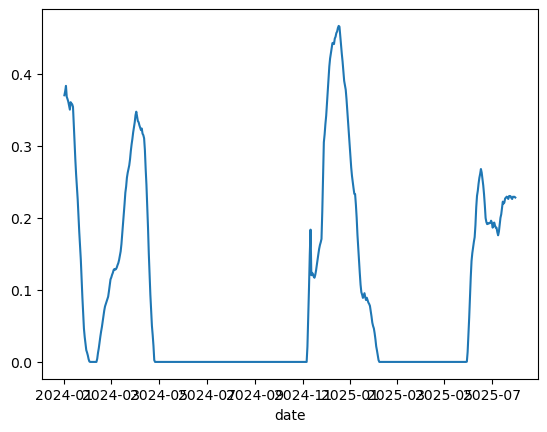

In [212]:
df_os_vov['BTC-USD_final_signal'].plot()

In [183]:
df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
df_os = df_os[df_os.index >= pd.Timestamp(start_date_os).date()]

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


<Axes: xlabel='date'>

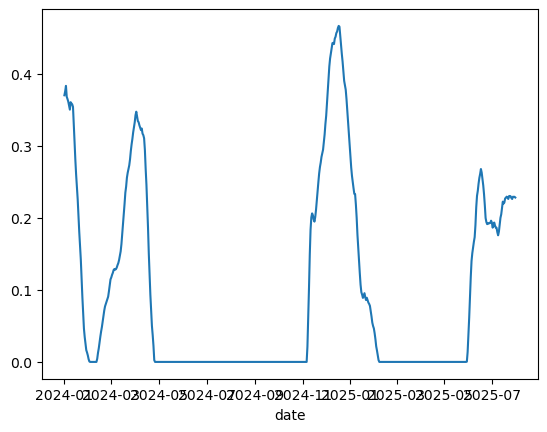

In [187]:
df_os['BTC-USD_final_signal'].plot()

## Walk Forward Analysis for Vol of Vol Signal

In [80]:
import itertools

def generate_vol_of_vol_signal_params():
    parameter_grid = {
        "log_std_window": [10, 14, 20],
        "coef_of_variation_window": [20, 30, 50],
        "vol_of_vol_z_score_window": [126, 180, 252],
        "vol_of_vol_p_min": [0.5, 0.6, 0.7],
        "r2_strong_threshold": [0.75, 0.80, 0.85]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))


In [81]:
def run_walk_forward_vol_of_vol_signal(start_date, end_date, ticker_list):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'log_std_window', 'coef_of_variation_window', 'vol_of_vol_z_score_window', 'vol_of_vol_p_min', 'r2_strong_threshold', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_vol_of_vol_signal_params():
            print(params)
            log_std_window = params['log_std_window']
            coef_of_variation_window = params['coef_of_variation_window']
            vol_of_vol_z_score_window = params['vol_of_vol_z_score_window']
            vol_of_vol_p_min = params['vol_of_vol_p_min']
            r2_strong_threshold = params['r2_strong_threshold']
            
            print(log_std_window, coef_of_variation_window, vol_of_vol_z_score_window, vol_of_vol_p_min, r2_strong_threshold)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_is)

            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        walk_forward_run_cond = in_sample_cond & date_cond

        ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        best_log_std_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['log_std_window'].iloc[0]
        best_coef_of_variation_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['coef_of_variation_window'].iloc[0]
        best_vol_of_vol_z_score_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_z_score_window'].iloc[0]
        best_vol_of_vol_p_min = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_p_min'].iloc[0]
        best_r2_strong_threshold = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['r2_strong_threshold'].iloc[0]
        
        ## Out of Sample Dataframe
        print('Pulling Out of Sample Data!!')
        df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                log_std_window=best_log_std_window, coef_of_variation_window=best_coef_of_variation_window, vol_of_vol_z_score_window=best_vol_of_vol_z_score_window, vol_of_vol_p_min=best_vol_of_vol_p_min, r2_strong_threshold=best_r2_strong_threshold,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
        print('Calculating Out of Sample Asset Returns!!')
        df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
        
        ## Out of Sample Performance Metrics
        print('Pulling Out of Sample Performance Metrics!!')
        row_parameters_os = {
            'sampling_category': 'out_sample',
            'start_date': start_date_os,
            'end_date': end_date_os,
            'log_std_window': best_log_std_window,
            'coef_of_variation_window': best_coef_of_variation_window,
            'vol_of_vol_z_score_window': best_vol_of_vol_z_score_window,
            'vol_of_vol_p_min': best_vol_of_vol_p_min,
            'r2_strong_threshold': best_r2_strong_threshold
        }
        portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                           strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                           passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

        print('Getting Out of Sample Asset Performance!!')
        for ticker in ticker_list:
            ## Out of Sample
            ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                 strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                 annual_trading_days=365, include_transaction_costs_and_fees=False)
            ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
            ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
            portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
        
        row_parameters_os.update(portfolio_perf_metrics_os)

        ## Assign out of sample metrics to performance dataframe
        df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [204]:
%%time
df_performance_vol_of_vol_1 = run_walk_forward_vol_of_vol_signal(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.75}
10 20 126 0.5 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.8}
10 20 126 

In [212]:
df_performance_vol_of_vol_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Performance-2022-04-01-2024-04-01.pickle')

In [214]:
%%time
df_performance_vol_of_vol_2 = run_walk_forward_vol_of_vol_signal(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.75}
10 20 126 0.5 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.8}
10 20 126 

In [215]:
df_performance_vol_of_vol_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Performance-2022-10-01-2024-10-01.pickle')

In [216]:
%%time
df_performance_vol_of_vol_3 = run_walk_forward_vol_of_vol_signal(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.75}
10 20 126 0.5 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.8}
10 20 126 

In [217]:
df_performance_vol_of_vol_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Performance-2023-04-01-2025-04-01.pickle')

In [218]:
%%time
df_performance_vol_of_vol_4 = run_walk_forward_vol_of_vol_signal(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_strong_threshold': 0.75}
10 20 126 0.5 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
{'log_std_window': 10, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.5, 'r2_

In [219]:
df_performance_vol_of_vol_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Performance-2023-10-01-2025-10-01.pickle')

In [220]:
df_performance_vol_of_vol = pd.concat([df_performance_vol_of_vol_1,df_performance_vol_of_vol_2,
                                       df_performance_vol_of_vol_3,df_performance_vol_of_vol_4], axis=0, ignore_index=True)

In [221]:
in_sample_cond = (df_performance_vol_of_vol.sampling_category == 'in_sample')
df_performance_vol_of_vol_is = df_performance_vol_of_vol[in_sample_cond].reset_index(drop=True)
df_performance_vol_of_vol_os = df_performance_vol_of_vol[~in_sample_cond].reset_index(drop=True)

In [222]:
df_performance_vol_of_vol.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Performance-2022-04-01-2025-10-01.pickle')

In [223]:
df_performance_vol_of_vol_is.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.5              0.75                               1.300340   
20             20                       126                       0.6              0.75                               1.291958   
                                                                  0.5              0.75                               1.282372   
14             20                       126                       0.5              0.80                               1.289068   
                                                                                   0.85                               1.288654   
20             20                       180                       0.5              0.75                               1.292534   
                                        126                       0.6              0.85                               1.281316   
                                                                                   0.80                               1.280459   
                                        180                       0.5              0.85                               1.289712   
                                                                  0.6              0.75                               1.295535   
                                                                  0.5              0.80                               1.288597   
                                        126                       0.5              0.85                               1.269413   
14             20                       126                       0.6              0.75                               1.288453   
20             20                       180                       0.6              0.85                               1.293875   
                                        126                       0.5              0.80                               1.268103   
10             20                       126                       0.5              0.75                               1.276110   
20             20                       180                       0.6              0.80                               1.292120   
                                        126                       0.7              0.75                               1.287502   
14             20                       126                       0.6              0.85                               1.280367   
20             20                       126                       0.7              0.85                               1.279423   
14             20                       126                       0.6              0.80                               1.280182   
                                        180                       0.5              0.75                               1.281640   
20             20                       180                       0.7              0.75                               1.288257   
                                        126                       0.7              0.80                               1.278121   
                                        180                       0.7              0.85                               1.286919   
               30                       180                       0.6              0.85                               1.273089   
               20                       180                       0.7              0.80                               1.285830   
14             30                       180                       0.6              0.85                               1.270132   
                                                                         

In [224]:
df_performance_vol_of_vol_os.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
20             20                       126                       0.5              0.75                               0.852552   
14             20                       126                       0.5              0.75                               0.840137   
20             20                       180                       0.5              0.75                               0.058452   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 0.852552   
14             20                       126                       0.5              0.75                 0.840137   
20             20                       180                       0.5              0.75                 0.058452   

                                                                                                                  \
                                                                                                             std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 2.222489   
14             20                       126                       0.5              0.75                      NaN   
20             20                       180                       0.5              0.75                      NaN   

                                                                                                       annualized_return  \
                                                                                                                  median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                     
20             20                       126                       0.5              0.75                         0.603136   
14             20                       126                       0.5              0.75                         0.168011   
20             20                       180                       0.5              0.75                         0.033491   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 0.603136   
14             20                       126                       0.5              0.75                 0.168011   
20             20                       180                       0.5              0.75                 0.033491   

                                                                                                                 \
                                                                                                            std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold            
20             20                       126                       0.5              0.75                 0.93275   
14             20         

In [236]:
df_performance_vol_of_vol_os

,sampling_category,start_date,end_date,log_std_window,coef_of_variation_window,vol_of_vol_z_score_window,vol_of_vol_p_min,r2_strong_threshold,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,out_sample,2023-10-01,2024-03-31,20,20,126,0.5,0.75,1.262690,2.424089,7.006734,0.559227,-0.180211,323 days,0.193814,2.959411,0.003233,508.0,0.115827,0.227383,0.101608,0.172821,0.404875,0.592836,1.305698,0.650467,1.419840,1.874021,0.209252,0.224314,0.140338,1.377997e-01,0.299712,-0.046271,-0.124207,-0.043780,-0.046078,-0.059450
1,out_sample,2024-04-01,2024-09-30,20,20,126,0.5,0.75,-0.056418,-0.718985,-0.375851,0.579076,-0.150107,309 days,0.032990,-0.414532,0.678668,42.0,-0.034964,-0.020914,-0.005965,0.004773,0.035774,-0.983554,-2.109954,-9.438721,-4.627720,-0.163923,0.376153,0.183830,0.039503,1.009731e-01,0.559074,-0.102027,-0.047841,-0.008167,-0.004276,-0.038956
2,out_sample,2024-10-01,2025-03-31,20,20,180,0.5,0.75,0.033491,0.058452,0.168420,0.486121,-0.198855,307 days,0.132231,0.295256,0.767926,369.0,0.131898,-0.012351,-0.020166,-0.023689,0.032628,0.639135,-1.478484,-1.353530,-1.071552,-0.177964,0.269915,0.097889,0.115488,1.289408e-01,0.162335,-0.068871,-0.043992,-0.069225,-0.065338,-0.052888
3,out_sample,2025-04-01,2025-07-31,14,20,126,0.5,0.75,0.168011,0.840137,1.716843,0.310446,-0.097861,341 days,0.117925,1.286522,0.198965,227.0,0.068786,0.099021,0.034098,0.000000,-0.000083,0.250465,0.691089,-0.272970,-inf,-9.297591,0.194997,0.159998,0.116710,6.344903e-27,0.012085,-0.067794,-0.043321,-0.020996,0.000000,-0.003907


## Walk Forward Analysis for Vol of Vol Micro Grid

In [85]:
import itertools

def generate_vol_of_vol_signal_params():
    parameter_grid = {
        "log_std_window": [14, 20],
        "coef_of_variation_window": [20, 30],
        "vol_of_vol_z_score_window": [126, 180],
        "vol_of_vol_p_min": [0.3, 0.4, 0.5, 0.6],
        "r2_strong_threshold": [0.65, 0.75, 0.80]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))


In [87]:
def run_walk_forward_vol_of_vol_signal_micro_grid(start_date, end_date, ticker_list):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'log_std_window', 'coef_of_variation_window', 'vol_of_vol_z_score_window', 'vol_of_vol_p_min', 'r2_strong_threshold', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_vol_of_vol_signal_params():
            print(params)
            log_std_window = params['log_std_window']
            coef_of_variation_window = params['coef_of_variation_window']
            vol_of_vol_z_score_window = params['vol_of_vol_z_score_window']
            vol_of_vol_p_min = params['vol_of_vol_p_min']
            r2_strong_threshold = params['r2_strong_threshold']
            
            print(log_std_window, coef_of_variation_window, vol_of_vol_z_score_window, vol_of_vol_p_min, r2_strong_threshold)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_is)

            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        # ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_log_std_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['log_std_window'].iloc[0]
        # best_coef_of_variation_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['coef_of_variation_window'].iloc[0]
        # best_vol_of_vol_z_score_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_z_score_window'].iloc[0]
        # best_vol_of_vol_p_min = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_p_min'].iloc[0]
        # best_r2_strong_threshold = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['r2_strong_threshold'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [300]:
%%time
df_performance_vol_of_vol_micro_grid_1 = run_walk_forward_vol_of_vol_signal_micro_grid(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.3, 'r2_strong_threshold': 0.65}
14 20 126 0.3 0.65
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [306]:
df_performance_vol_of_vol_micro_grid_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2022-04-01-2024-04-01.pickle')

In [308]:
%%time
df_performance_vol_of_vol_micro_grid_2 = run_walk_forward_vol_of_vol_signal_micro_grid(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.3, 'r2_strong_threshold': 0.65}
14 20 126 0.3 0.65
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [310]:
df_performance_vol_of_vol_micro_grid_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2022-10-01-2024-10-01.pickle')

In [137]:
%%time
df_performance_vol_of_vol_micro_grid_3 = run_walk_forward_vol_of_vol_signal_micro_grid(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.3, 'r2_strong_threshold': 0.65}
14 20 126 0.3 0.65
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [138]:
df_performance_vol_of_vol_micro_grid_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2023-04-01-2025-04-01.pickle')

In [139]:
%%time
df_performance_vol_of_vol_micro_grid_4 = run_walk_forward_vol_of_vol_signal_micro_grid(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.3, 'r2_strong_threshold': 0.65}
14 20 126 0.3 0.65
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
G

In [140]:
df_performance_vol_of_vol_micro_grid_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2023-10-01-2025-10-01.pickle')

In [145]:
df_performance_vol_of_vol_micro_grid = pd.concat([df_performance_vol_of_vol_micro_grid_1, df_performance_vol_of_vol_micro_grid_2,
                                                  df_performance_vol_of_vol_micro_grid_3, df_performance_vol_of_vol_micro_grid_4], axis=0, ignore_index=True)

In [147]:
df_performance_vol_of_vol_micro_grid.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2022-04-01-2025-10-01.pickle')

In [149]:
df_performance_vol_of_vol_micro_grid = pd.read_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_Micro_Grid_Performance-2022-04-01-2025-10-01.pickle')

In [151]:
in_sample_cond = (df_performance_vol_of_vol_micro_grid.sampling_category == 'in_sample')
df_performance_vol_of_vol_micro_grid_is = df_performance_vol_of_vol_micro_grid[in_sample_cond].reset_index(drop=True)
df_performance_vol_of_vol_micro_grid_os = df_performance_vol_of_vol_micro_grid[~in_sample_cond].reset_index(drop=True)

In [157]:
df_performance_vol_of_vol_micro_grid_is.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.3              0.75                               1.306046   
                                                                                   0.65                               1.290327   
                                                                                   0.80                               1.287261   
                                                                  0.4              0.75                               1.302585   
                                                                                   0.65                               1.291936   
                                                                  0.5              0.75                               1.300340   
20             20                       126                       0.3              0.75                               1.274115   
14             20                       126                       0.4              0.80                               1.288578   
                                                                  0.5              0.65                               1.289395   
20             20                       126                       0.4              0.75                               1.279392   
                                                                  0.6              0.75                               1.291958   
                                                                  0.5              0.75                               1.282372   
14             20                       126                       0.5              0.80                               1.289068   
20             20                       180                       0.5              0.75                               1.292534   
                                                                  0.4              0.75                               1.291060   
                                        126                       0.6              0.80                               1.280459   
                                        180                       0.6              0.75                               1.295535   
                                        126                       0.6              0.65                               1.272206   
                                        180                       0.5              0.80                               1.288597   
                                                                  0.4              0.80                               1.285692   
14             20                       126                       0.6              0.75                               1.288453   
20             20                       126                       0.5              0.80                               1.268103   
                                        180                       0.3              0.75                               1.283719   
                                        126                       0.5              0.65                               1.260049   
                                        180                       0.6              0.80                               1.292120   
                                        126                       0.3              0.80                               1.251344   
                                                                  0.4              0.80                               1.260139   
                                                                  0.3              0.65                               1.242660   
14             20                       126                       0.6    

In [159]:
df_performance_vol_of_vol_micro_grid_os.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.3              0.75                               0.471621   
                                                                  0.5              0.75                               0.458478   
                                                                  0.3              0.65                               0.472293   
                                                                  0.4              0.75                               0.461949   
                                                                  0.3              0.80                               0.474042   
                                                                  0.5              0.80                               0.459727   
                                                                  0.4              0.65                               0.462794   
                                                                  0.5              0.65                               0.457603   
                                                                  0.4              0.80                               0.463949   
                                                                  0.6              0.75                               0.449164   
20             20                       180                       0.5              0.75                               0.439707   
                                                                                   0.80                               0.439707   
                                        126                       0.6              0.75                               0.431810   
                                                                  0.5              0.75                               0.429786   
                                        180                       0.6              0.75                               0.437505   
                                                                                   0.80                               0.437505   
14             20                       126                       0.6              0.80                               0.450902   
20             20                       180                       0.4              0.75                               0.442147   
                                                                                   0.80                               0.442147   
                                        126                       0.6              0.80                               0.431810   
                                        180                       0.3              0.80                               0.444400   
                                                                                   0.75                               0.444400   
                                                                  0.5              0.65                               0.441900   
14             20                       126                       0.6              0.65                               0.448184   
20             20                       180                       0.6              0.65                               0.439698   
                                        126                       0.5              0.80                               0.429786   
                                                                  0.4              0.75                               0.428378   
                                        180                       0.4              0.65                               0.444340   
                                                                  0.3    

In [274]:
df_performance_vol_of_vol_os.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
20             20                       126                       0.5              0.75                               0.852552   
14             20                       126                       0.5              0.75                               0.840137   
20             20                       180                       0.5              0.75                               0.058452   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 0.852552   
14             20                       126                       0.5              0.75                 0.840137   
20             20                       180                       0.5              0.75                 0.058452   

                                                                                                                  \
                                                                                                             std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 2.222489   
14             20                       126                       0.5              0.75                      NaN   
20             20                       180                       0.5              0.75                      NaN   

                                                                                                       annualized_return  \
                                                                                                                  median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                     
20             20                       126                       0.5              0.75                         0.603136   
14             20                       126                       0.5              0.75                         0.168011   
20             20                       180                       0.5              0.75                         0.033491   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
20             20                       126                       0.5              0.75                 0.603136   
14             20                       126                       0.5              0.75                 0.168011   
20             20                       180                       0.5              0.75                 0.033491   

                                                                                                                 \
                                                                                                            std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold            
20             20                       126                       0.5              0.75                 0.93275   
14             20         

## Walk Forward Analysis Varying Vol_of_Vol_P_Min

In [89]:
import itertools

def generate_vol_of_vol_signal_p_min_params():
    parameter_grid = {
        "log_std_window": [14],
        "coef_of_variation_window": [20],
        "vol_of_vol_z_score_window": [126],
        "vol_of_vol_p_min": [0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50],
        "r2_strong_threshold": [0.75, 0.80]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [91]:
def run_walk_forward_vol_of_vol_signal_p_min(start_date, end_date, ticker_list):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'log_std_window', 'coef_of_variation_window', 'vol_of_vol_z_score_window', 'vol_of_vol_p_min', 'r2_strong_threshold', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_vol_of_vol_signal_p_min_params():
            print(params)
            log_std_window = params['log_std_window']
            coef_of_variation_window = params['coef_of_variation_window']
            vol_of_vol_z_score_window = params['vol_of_vol_z_score_window']
            vol_of_vol_p_min = params['vol_of_vol_p_min']
            r2_strong_threshold = params['r2_strong_threshold']
            
            print(log_std_window, coef_of_variation_window, vol_of_vol_z_score_window, vol_of_vol_p_min, r2_strong_threshold)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_is)

            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        # ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        # ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_log_std_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['log_std_window'].iloc[0]
        # best_coef_of_variation_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['coef_of_variation_window'].iloc[0]
        # best_vol_of_vol_z_score_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_z_score_window'].iloc[0]
        # best_vol_of_vol_p_min = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_p_min'].iloc[0]
        # best_r2_strong_threshold = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['r2_strong_threshold'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [210]:
%%time
df_performance_vol_of_vol_p_min_1 = run_walk_forward_vol_of_vol_signal_p_min(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.1, 'r2_strong_threshold': 0.75}
14 20 126 0.1 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [211]:
df_performance_vol_of_vol_p_min_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Performance-2022-04-01-2024-04-01.pickle')

In [212]:
%%time
df_performance_vol_of_vol_p_min_2 = run_walk_forward_vol_of_vol_signal_p_min(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.1, 'r2_strong_threshold': 0.75}
14 20 126 0.1 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [213]:
df_performance_vol_of_vol_p_min_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Performance-2022-10-01-2024-10-01.pickle')

In [214]:
%%time
df_performance_vol_of_vol_p_min_3 = run_walk_forward_vol_of_vol_signal_p_min(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.1, 'r2_strong_threshold': 0.75}
14 20 126 0.1 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [215]:
df_performance_vol_of_vol_p_min_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Performance-2023-04-01-2025-04-01.pickle')

In [216]:
%%time
df_performance_vol_of_vol_p_min_4 = run_walk_forward_vol_of_vol_signal_p_min(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.1, 'r2_strong_threshold': 0.75}
14 20 126 0.1 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
G

In [217]:
df_performance_vol_of_vol_p_min_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Performance-2023-10-01-2025-10-01.pickle')

In [224]:
df_performance_vol_of_vol_p_min = pd.concat([df_performance_vol_of_vol_p_min_1, df_performance_vol_of_vol_p_min_2,
                                             df_performance_vol_of_vol_p_min_3, df_performance_vol_of_vol_p_min_4], axis=0, ignore_index=True)

In [225]:
df_performance_vol_of_vol_p_min.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Performance-2022-04-01-2025-10-01.pickle')

In [226]:
in_sample_cond = (df_performance_vol_of_vol_p_min.sampling_category == 'in_sample')
df_performance_vol_of_vol_p_min_is = df_performance_vol_of_vol_p_min[in_sample_cond].reset_index(drop=True)
df_performance_vol_of_vol_p_min_os = df_performance_vol_of_vol_p_min[~in_sample_cond].reset_index(drop=True)

In [232]:
df_performance_vol_of_vol_p_min_is.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.10             0.75                               1.311980   
                                                                  0.15             0.75                               1.313494   
                                                                  0.20             0.75                               1.308795   
                                                                  0.25             0.75                               1.305141   
                                                                  0.10             0.80                               1.282300   
                                                                  0.15             0.80                               1.283908   
                                                                  0.30             0.75                               1.306046   
                                                                  0.20             0.80                               1.284055   
                                                                  0.35             0.75                               1.304377   
                                                                  0.25             0.80                               1.283580   
                                                                  0.30             0.80                               1.287261   
                                                                  0.40             0.75                               1.302585   
                                                                  0.45             0.75                               1.301808   
                                                                  0.35             0.80                               1.287319   
                                                                  0.50             0.75                               1.300340   
                                                                  0.40             0.80                               1.288578   
                                                                  0.45             0.80                               1.290021   
                                                                  0.50             0.80                               1.289068   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.949788   
                                                                  0.15             0.75                 0.949131   
                                                                  0.20             0.75                 0.941553   
                                                                  0.25             0.75                 0.933410   
                                                                  0.10             0.80                 0.928279   
                                                                  0.15             0.80                 0.927839   
                                                                  0.30             0.75                 0.927129   
                                                                  0.20             0.80                 0.923209   
                                                                  0.35             0.75         

In [234]:
df_performance_vol_of_vol_p_min_os.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.10             0.75                               0.491159   
                                                                  0.15             0.75                               0.485221   
                                                                  0.20             0.75                               0.479259   
                                                                  0.30             0.75                               0.471621   
                                                                  0.25             0.75                               0.474816   
                                                                  0.35             0.75                               0.464822   
                                                                  0.10             0.80                               0.491075   
                                                                  0.50             0.75                               0.458478   
                                                                  0.15             0.80                               0.485139   
                                                                  0.20             0.80                               0.479178   
                                                                  0.45             0.75                               0.461970   
                                                                  0.40             0.75                               0.461949   
                                                                  0.30             0.80                               0.474042   
                                                                  0.25             0.80                               0.474743   
                                                                  0.35             0.80                               0.467497   
                                                                  0.50             0.80                               0.459727   
                                                                  0.45             0.80                               0.463375   
                                                                  0.40             0.80                               0.463949   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.663964   
                                                                  0.15             0.75                 0.662598   
                                                                  0.20             0.75                 0.660820   
                                                                  0.30             0.75                 0.658401   
                                                                  0.25             0.75                 0.658372   
                                                                  0.35             0.75                 0.654227   
                                                                  0.10             0.80                 0.654181   
                                                                  0.50             0.75                 0.653435   
                                                                  0.15             0.80         

In [244]:
df_performance_vol_of_vol_p_min_os[df_performance_vol_of_vol_p_min_os.start_date == pd.Timestamp('2024-04-01').date()].sort_values('annualized_sharpe_ratio', ascending=False)

,sampling_category,start_date,end_date,log_std_window,coef_of_variation_window,vol_of_vol_z_score_window,vol_of_vol_p_min,r2_strong_threshold,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
19,out_sample,2024-04-01,2024-09-30,14,20,126,0.10,0.80,-0.056278,-0.721156,-0.382047,0.568324,-0.147307,309 days,0.03299,-0.415450,0.677997,47.0,-0.038498,-0.019983,-0.001308,0.004773,0.035774,-0.934027,-2.633356,-38.127309,-4.62772,-0.163923,0.410793,0.144561,0.008992,0.100973,0.559074,-0.107148,-0.041489,-0.001738,-0.004276,-0.038956
21,out_sample,2024-04-01,2024-09-30,14,20,126,0.15,0.80,-0.056583,-0.724249,-0.383946,0.567726,-0.147372,309 days,0.03299,-0.418673,0.675641,47.0,-0.037398,-0.021097,-0.001868,0.004773,0.035774,-0.932186,-2.658906,-26.563022,-4.62772,-0.163923,0.406497,0.145170,0.013082,0.100973,0.559074,-0.107023,-0.041462,-0.002481,-0.004276,-0.038956
23,out_sample,2024-04-01,2024-09-30,14,20,126,0.20,0.80,-0.056908,-0.727470,-0.385981,0.567151,-0.147436,309 days,0.03299,-0.422060,0.673168,46.0,-0.036430,-0.022109,-0.002405,0.004773,0.035774,-0.930629,-2.675858,-20.738126,-4.62772,-0.163923,0.402677,0.146048,0.016948,0.100973,0.559074,-0.106900,-0.041435,-0.003194,-0.004276,-0.038956
25,out_sample,2024-04-01,2024-09-30,14,20,126,0.25,0.80,-0.057345,-0.730785,-0.388782,0.567150,-0.147499,309 days,0.03299,-0.425937,0.670343,47.0,-0.035390,-0.023031,-0.002907,0.004773,0.035774,-0.926989,-2.686426,-17.229636,-4.62772,-0.163923,0.399335,0.147107,0.020615,0.100973,0.559074,-0.106779,-0.041409,-0.003861,-0.004276,-0.038956
26,out_sample,2024-04-01,2024-09-30,14,20,126,0.30,0.75,-0.057589,-0.732682,-0.388575,0.567115,-0.148205,309 days,0.03299,-0.428133,0.668745,43.0,-0.033101,-0.023394,-0.005559,0.004773,0.035774,-0.909553,-2.694527,-10.100705,-4.62772,-0.163923,0.395636,0.147290,0.036612,0.100973,0.559074,-0.104376,-0.041488,-0.007658,-0.004276,-0.038956
24,out_sample,2024-04-01,2024-09-30,14,20,126,0.25,0.75,-0.057704,-0.733650,-0.389774,0.567042,-0.148044,309 days,0.03299,-0.429216,0.667957,44.0,-0.034332,-0.022259,-0.005325,0.004773,0.035774,-0.918095,-2.680698,-10.446906,-4.62772,-0.163923,0.397971,0.146042,0.035275,0.100973,0.559074,-0.104473,-0.041071,-0.007349,-0.004276,-0.038956
18,out_sample,2024-04-01,2024-09-30,14,20,126,0.10,0.75,-0.058062,-0.734155,-0.389195,0.568696,-0.149184,309 days,0.03299,-0.430898,0.666734,46.0,-0.037641,-0.019406,-0.004381,0.004773,0.035774,-0.929549,-2.624492,-11.549914,-4.62772,-0.163923,0.408666,0.143982,0.031706,0.100973,0.559074,-0.105678,-0.041094,-0.006097,-0.004276,-0.038956
27,out_sample,2024-04-01,2024-09-30,14,20,126,0.30,0.80,-0.057748,-0.734350,-0.391217,0.566766,-0.147610,309 days,0.03299,-0.429853,0.667494,45.0,-0.034403,-0.024220,-0.003402,0.004773,0.035774,-0.924014,-2.698251,-14.722208,-4.62772,-0.163923,0.395956,0.148547,0.024389,0.100973,0.559074,-0.106385,-0.041831,-0.004522,-0.004276,-0.038956
20,out_sample,2024-04-01,2024-09-30,14,20,126,0.15,0.75,-0.058070,-0.735134,-0.389782,0.568007,-0.148980,309 days,0.03299,-0.431590,0.666232,46.0,-0.036573,-0.020443,-0.004715,0.004773,0.035774,-0.927484,-2.649967,-11.234621,-4.62772,-0.163923,0.404587,0.144470,0.032619,0.100973,0.559074,-0.105447,-0.041094,-0.006539,-0.004276,-0.038956
34,out_sample,2024-04-01,2024-09-30,14,20,126,0.50,0.75,-0.057948,-0.736283,-0.390144,0.566464,-0.148530,309 days,0.03299,-

In [202]:
## Old
df_performance_vol_of_vol_p_min_is.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.10             0.75                               1.311980   
                                                                  0.15             0.75                               1.313494   
                                                                  0.20             0.75                               1.308795   
                                                                  0.25             0.75                               1.305141   
                                                                  0.10             0.80                               1.282300   
                                                                  0.15             0.80                               1.283908   
                                                                  0.30             0.75                               1.306046   
                                                                  0.20             0.80                               1.284055   
                                                                  0.35             0.75                               1.304377   
                                                                  0.25             0.80                               1.283580   
                                                                  0.30             0.80                               1.287261   
                                                                  0.40             0.75                               1.302585   
                                                                  0.45             0.75                               1.301808   
                                                                  0.35             0.80                               1.287319   
                                                                  0.50             0.75                               1.300340   
                                                                  0.40             0.80                               1.288578   
                                                                  0.45             0.80                               1.290021   
                                                                  0.50             0.80                               1.289068   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.949788   
                                                                  0.15             0.75                 0.949131   
                                                                  0.20             0.75                 0.941553   
                                                                  0.25             0.75                 0.933410   
                                                                  0.10             0.80                 0.928279   
                                                                  0.15             0.80                 0.927839   
                                                                  0.30             0.75                 0.927129   
                                                                  0.20             0.80                 0.923209   
                                                                  0.35             0.75         

In [206]:
df_performance_vol_of_vol_p_min_os.groupby(['log_std_window','coef_of_variation_window','vol_of_vol_z_score_window','vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio  \
                                                                                                                        median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                           
14             20                       126                       0.10             0.75                               0.825612   
                                                                  0.15             0.75                               0.133175   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.833049   
                                                                  0.15             0.75                 0.133175   

                                                                                                                  \
                                                                                                             std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 1.570936   
                                                                  0.15             0.75                      NaN   

                                                                                                       annualized_return  \
                                                                                                                  median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                     
14             20                       126                       0.10             0.75                         0.166470   
                                                                  0.15             0.75                         0.052435   

                                                                                                                  \
                                                                                                            mean   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.454005   
                                                                  0.15             0.75                 0.052435   

                                                                                                                  \
                                                                                                             std   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold             
14             20                       126                       0.10             0.75                 0.701516   
                                                                  0.15             0.75                      NaN   

                                                                                                       max_drawdown  \
                                                                                                             median   
log_std_window coef_of_variation_window vol_of_vol_z_score_window vol_of_vol_p_min r2_strong_threshold                
14             20                       126                       0.10             0.75                   -0.149184   
                               

## Walk Forward Analysis for Vol of Vol P Min Micro Grid

In [93]:
import itertools

def generate_vol_of_vol_signal_p_min_micro_grid_params():
    parameter_grid = {
        "log_std_window": [14],
        "coef_of_variation_window": [20],
        "vol_of_vol_z_score_window": [126],
        "vol_of_vol_p_min": [0.00, 0.10, 0.15],#, 0.20, 0.25],
        "r2_strong_threshold": [0.75]
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [95]:
def run_walk_forward_vol_of_vol_signal_p_min_micro_grid(start_date, end_date, ticker_list):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'log_std_window', 'coef_of_variation_window', 'vol_of_vol_z_score_window', 'vol_of_vol_p_min', 'r2_strong_threshold', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_vol_of_vol_signal_p_min_micro_grid_params():
            print(params)
            log_std_window = params['log_std_window']
            coef_of_variation_window = params['coef_of_variation_window']
            vol_of_vol_z_score_window = params['vol_of_vol_z_score_window']
            vol_of_vol_p_min = params['vol_of_vol_p_min']
            r2_strong_threshold = params['r2_strong_threshold']
            
            print(log_std_window, coef_of_variation_window, vol_of_vol_z_score_window, vol_of_vol_p_min, r2_strong_threshold)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_is)

            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        # ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        # ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_log_std_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['log_std_window'].iloc[0]
        # best_coef_of_variation_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['coef_of_variation_window'].iloc[0]
        # best_vol_of_vol_z_score_window = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_z_score_window'].iloc[0]
        # best_vol_of_vol_p_min = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['vol_of_vol_p_min'].iloc[0]
        # best_r2_strong_threshold = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['r2_strong_threshold'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'log_std_window': log_std_window,
                'coef_of_variation_window': coef_of_variation_window,
                'vol_of_vol_z_score_window': vol_of_vol_z_score_window,
                'vol_of_vol_p_min': vol_of_vol_p_min,
                'r2_strong_threshold': r2_strong_threshold
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [298]:
%%time
df_performance_vol_of_vol_p_min_micro_grid_1 = run_walk_forward_vol_of_vol_signal_p_min_micro_grid(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.0, 'r2_strong_threshold': 0.75}
14 20 126 0.0 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [299]:
df_performance_vol_of_vol_p_min_micro_grid_1

,sampling_category,start_date,end_date,log_std_window,coef_of_variation_window,vol_of_vol_z_score_window,vol_of_vol_p_min,r2_strong_threshold,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,14,20,126,0.00,0.75,-0.067945,-0.109422,-0.143199,0.553591,-0.474479,543 days,0.222535,0.021026,0.983231,941.0,0.050480,0.017914,0.049483,-0.019146,0.009365,0.093420,-0.218983,0.063118,-0.242112,-0.226791,0.298710,0.188099,0.226380,0.331226,0.232800,-0.225825,-0.112851,-0.117176,-0.254270,-0.210771
1,out_sample,2023-10-01,2024-03-31,14,20,126,0.00,0.75,1.182022,2.314204,5.898850,0.578439,-0.200382,323 days,0.195876,2.832467,0.004812,421.0,0.115537,0.224015,0.069209,0.207669,0.406210,0.509343,1.228905,0.299787,1.715567,1.825090,0.287749,0.258770,0.135972,0.146752,0.328659,-0.050524,-0.133862,-0.043780,-0.046078,-0.059450
2,in_sample,2022-04-01,2023-09-30,14,20,126,0.10,0.75,-0.125139,-0.265377,-0.226560,0.548006,-0.552342,543 days,0.233803,-0.197935,0.843152,1032.0,0.086302,0.002124,0.038404,-0.096398,-0.013357,0.278283,-0.378928,-0.012381,-0.674864,-0.403239,0.282347,0.166757,0.223797,0.306406,0.218334,-0.225825,-0.112984,-0.117176,-0.301264,-0.237178
3,out_sample,2023-10-01,2024-03-31,14,20,126,0.10,0.75,1.253605,2.407690,6.454558,0.560591,-0.194220,323 days,0.195876,2.940144,0.003438,503.0,0.114653,0.228209,0.086846,0.194987,0.405107,0.530679,1.271130,0.517016,1.617046,1.825614,0.236120,0.232226,0.128229,0.140764,0.307736,-0.047629,-0.132322,-0.043780,-0.046078,-0.059450
4,in_sample,2022-04-01,2023-09-30,14,20,126,0.15,0.75,-0.128456,-0.270415,-0.230737,0.552071,-0.556723,543 days,0.232394,-0.206191,0.836701,1031.0,0.086801,0.002703,0.032843,-0.100029,-0.011671,0.280951,-0.373857,-0.050221,-0.678059,-0.387967,0.281983,0.166378,0.224277,0.312623,0.219497,-0.225825,-0.112935,-0.117176,-0.305690,-0.233329
5,out_sample,2023-10-01,2024-03-31,14,20,126,0.15,0.75,1.262135,2.415084,6.534164,0.561537,-0.193159,323 days,0.195876,2.948376,0.003349,498.0,0.113200,0.227853,0.093260,0.191568,0.404191,0.530771,1.277592,0.577788,1.587468,1.825770,0.230159,0.230457,0.133604,0.140311,0.306984,-0.048084,-0.131597,-0.043780,-0.046078,-0.059450


In [300]:
df_performance_vol_of_vol_p_min_micro_grid_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Micro_Grid_Performance-2022-04-01-2024-04-01.pickle')

In [301]:
%%time
df_performance_vol_of_vol_p_min_micro_grid_2 = run_walk_forward_vol_of_vol_signal_p_min_micro_grid(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.0, 'r2_strong_threshold': 0.75}
14 20 126 0.0 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [302]:
df_performance_vol_of_vol_p_min_micro_grid_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Micro_Grid_Performance-2022-10-01-2024-10-01.pickle')

In [303]:
%%time
df_performance_vol_of_vol_p_min_micro_grid_3 = run_walk_forward_vol_of_vol_signal_p_min_micro_grid(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.0, 'r2_strong_threshold': 0.75}
14 20 126 0.0 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop

In [304]:
df_performance_vol_of_vol_p_min_micro_grid_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Micro_Grid_Performance-2023-04-01-2025-04-01.pickle')

In [305]:
%%time
df_performance_vol_of_vol_p_min_micro_grid_4 = run_walk_forward_vol_of_vol_signal_p_min_micro_grid(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'log_std_window': 14, 'coef_of_variation_window': 20, 'vol_of_vol_z_score_window': 126, 'vol_of_vol_p_min': 0.0, 'r2_strong_threshold': 0.75}
14 20 126 0.0 0.75
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
G

In [306]:
df_performance_vol_of_vol_p_min_micro_grid_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Micro_Grid_Performance-2023-10-01-2025-10-01.pickle')

In [307]:
df_performance_vol_of_vol_p_min_micro_grid = pd.concat([df_performance_vol_of_vol_p_min_micro_grid_1, df_performance_vol_of_vol_p_min_micro_grid_2,
                                                        df_performance_vol_of_vol_p_min_micro_grid_3, df_performance_vol_of_vol_p_min_micro_grid_4], axis=0, ignore_index=True)

In [308]:
df_performance_vol_of_vol_p_min_micro_grid.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Vol_of_Vol_Signal_P_Min_Micro_Grid_Performance-2022-04-01-2025-10-01.pickle')

In [309]:
in_sample_cond = (df_performance_vol_of_vol_p_min_micro_grid.sampling_category == 'in_sample')
df_performance_vol_of_vol_p_min_micro_grid_is = df_performance_vol_of_vol_p_min_micro_grid[in_sample_cond].reset_index(drop=True)
df_performance_vol_of_vol_p_min_micro_grid_os = df_performance_vol_of_vol_p_min_micro_grid[~in_sample_cond].reset_index(drop=True)

In [328]:
df_performance_vol_of_vol_p_min_micro_grid

,sampling_category,start_date,end_date,log_std_window,coef_of_variation_window,vol_of_vol_z_score_window,vol_of_vol_p_min,r2_strong_threshold,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,14,20,126,0.00,0.75,-0.067945,-0.109422,-0.143199,0.553591,-0.474479,543 days,0.222535,0.021026,0.983231,941.0,0.050480,0.017914,0.049483,-0.019146,0.009365,0.093420,-0.218983,0.063118,-0.242112,-0.226791,0.298710,0.188099,0.226380,3.312263e-01,0.232800,-0.225825,-0.112851,-0.117176,-0.254270,-0.210771
1,out_sample,2023-10-01,2024-03-31,14,20,126,0.00,0.75,1.182022,2.314204,5.898850,0.578439,-0.200382,323 days,0.195876,2.832467,0.004812,421.0,0.115537,0.224015,0.069209,0.207669,0.406210,0.509343,1.228905,0.299787,1.715567,1.825090,0.287749,0.258770,0.135972,1.467519e-01,0.328659,-0.050524,-0.133862,-0.043780,-0.046078,-0.059450
2,in_sample,2022-04-01,2023-09-30,14,20,126,0.10,0.75,-0.125139,-0.265377,-0.226560,0.548006,-0.552342,543 days,0.233803,-0.197935,0.843152,1032.0,0.086302,0.002124,0.038404,-0.096398,-0.013357,0.278283,-0.378928,-0.012381,-0.674864,-0.403239,0.282347,0.166757,0.223797,3.064064e-01,0.218334,-0.225825,-0.112984,-0.117176,-0.301264,-0.237178
3,out_sample,2023-10-01,2024-03-31,14,20,126,0.10,0.75,1.253605,2.407690,6.454558,0.560591,-0.194220,323 days,0.195876,2.940144,0.003438,503.0,0.114653,0.228209,0.086846,0.194987,0.405107,0.530679,1.271130,0.517016,1.617046,1.825614,0.236120,0.232226,0.128229,1.407643e-01,0.307736,-0.047629,-0.132322,-0.043780,-0.046078,-0.059450
4,in_sample,2022-04-01,2023-09-30,14,20,126,0.15,0.75,-0.128456,-0.270415,-0.230737,0.552071,-0.556723,543 days,0.232394,-0.206191,0.836701,1031.0,0.086801,0.002703,0.032843,-0.100029,-0.011671,0.280951,-0.373857,-0.050221,-0.678059,-0.387967,0.281983,0.166378,0.224277,3.126230e-01,0.219497,-0.225825,-0.112935,-0.117176,-0.305690,-0.233329
5,out_sample,2023-10-01,2024-03-31,14,20,126,0.15,0.75,1.262135,2.415084,6.534164,0.561537,-0.193159,323 days,0.195876,2.948376,0.003349,498.0,0.113200,0.227853,0.093260,0.191568,0.404191,0.530771,1.277592,0.577788,1.587468,1.825770,0.230159,0.230457,0.133604,1.403112e-01,0.306984,-0.048084,-0.131597,-0.043780,-0.046078,-0.059450
6,in_sample,2022-10-01,2024-03-31,14,20,126,0.00,0.75,0.750727,1.495741,2.732894,0.556777,-0.274700,305 days,0.252941,2.471910,0.013634,1105.0,0.202151,0.166180,0.081225,0.155371,0.207426,0.964659,0.950957,0.277859,0.779631,0.869644,0.256578,0.202978,0.220775,2.144203e-01,0.296001,-0.074953,-0.133344,-0.117176,-0.086858,-0.219390
7,out_sample,2024-04-01,2024-09-30,14,20,126,0.00,0.75,-0.058127,-0.732719,-0.388542,0.555627,-0.149604,309 days,0.032990,-0.430173,0.667261,40.0,-0.040177,-0.017029,-0.003642,0.004773,0.035774,-0.934310,-2.541931,-11.773623,-4.627720,-0.163923,0.418348,0.154421,0.058193,1.009731e-01,0.559074,-0.106155,-0.041096,-0.005116,-0.004276,-0.038956
8,in_sample,2022-10-01,2024-03-31,14,20,126,0.10,0.75,0.712911,1.440566,2.050125,0.538644,-0.347740,305 days,0.263529,2.387795,0.017168,1285.0,0.232543,0.143579,0.081416,0.115725,0.188528,1.158175,0.780027,0.278017,0.559910,0.785407,0.225337,0.183092,0.210334,1.871993e-01,0.275864,-0.072948,-0.131788,-0.117176,-0.093959,-0.245578
9,out_sample,2024-04-01,2024-09-30,14,20,126,0.10,0.75,-0.058062,-0.734155,-0.389195,0.568696,-0.149184,309 days,0.032990,-0.430898,0.666734,46.0,-0

In [324]:
df_performance_vol_of_vol_p_min_micro_grid_is.groupby(['vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio            \
                                                      median      mean   
vol_of_vol_p_min r2_strong_threshold                                     
0.10             0.75                               1.311980  0.949788   
0.15             0.75                               1.313494  0.949131   
0.00             0.75                               1.180003  0.936581   

                                               annualized_return            \
                                           std            median      mean   
vol_of_vol_p_min r2_strong_threshold                                         
0.10             0.75                 0.813243          0.517454  0.405670   
0.15             0.75                 0.816181          0.518151  0.405297   
0.00             0.75                 0.719435          0.450570  0.395980   

                                               max_drawdown            \
                                           std       median      mean   
vol_of_vol_p_min r2_strong_threshold                                    
0.10             0.75                 0.365728    -0.311830 -0.349894   
0.15             0.75                 0.367573    -0.312226 -0.350989   
0.00             0.75                 0.341076    -0.280807 -0.316223   

                                               trade_count           \
                                           std      median     mean   
vol_of_vol_p_min r2_strong_threshold                                  
0.10             0.75                 0.144244      1063.0  1101.00   
0.15             0.75                 0.146649      1060.0  1096.00   
0.00             0.75                 0.108430       946.5   974.25   

                                                  \
                                             std   
vol_of_vol_p_min r2_strong_threshold               
0.10             0.75                 129.524772   
0.15             0.75                 126.935679   
0.00             0.75                  90.108731   

                                     BTC-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.318064   
0.15             0.75                                       0.332899   
0.00             0.75                                       0.025817   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                 0.437337  0.511152   
0.15             0.75                 0.446878  0.515503   
0.00             0.75                 0.226901  0.498971   

                                     ETH-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.591884   
0.15             0.75                                       0.583158   
0.00             0.75                                       0.583438   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                 0.396217  0.524703   
0.15             0.75                 0.393624  0.520439   
0.00             0.75                 0.474712  0.494342   

                                     SOL-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.076648   
0.15             0.75                                       0.045583

In [326]:
df_performance_vol_of_vol_p_min_micro_grid_os.groupby(['vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio            \
                                                      median      mean   
vol_of_vol_p_min r2_strong_threshold                                     
0.10             0.75                               0.491159  0.663964   
0.15             0.75                               0.485221  0.662598   
0.00             0.75                               0.231279  0.511011   

                                               annualized_return            \
                                           std            median      mean   
vol_of_vol_p_min r2_strong_threshold                                         
0.10             0.75                 1.326494          0.112478  0.355125   
0.15             0.75                 1.333624          0.110335  0.356184   
0.00             0.75                 1.340961          0.060583  0.311265   

                                               max_drawdown            \
                                           std       median      mean   
vol_of_vol_p_min r2_strong_threshold                                    
0.10             0.75                 0.605964    -0.167232 -0.156636   
0.15             0.75                 0.610994    -0.167492 -0.156501   
0.00             0.75                 0.588556    -0.167899 -0.162234   

                                               trade_count          \
                                           std      median    mean   
vol_of_vol_p_min r2_strong_threshold                                 
0.10             0.75                 0.043754       308.5  291.50   
0.15             0.75                 0.043626       307.5  289.75   
0.00             0.75                 0.039316       274.0  252.25   

                                                  \
                                             std   
vol_of_vol_p_min r2_strong_threshold               
0.10             0.75                 198.246480   
0.15             0.75                 196.415164   
0.00             0.75                 163.831977   

                                     BTC-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.328219   
0.15             0.75                                       0.347601   
0.00             0.75                                      -0.249490   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                 0.064392  0.672455   
0.15             0.75                 0.074622  0.678270   
0.00             0.75                -0.230987  0.721766   

                                     ETH-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                      -0.342814   
0.15             0.75                                      -0.370174   
0.00             0.75                                      -0.225735   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                -0.509747  1.818738   
0.15             0.75                -0.528180  1.835388   
0.00             0.75                -0.441124  1.814685   

                                     SOL-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                      -0.286838   
0.15             0.75                                      -0.353086   
0.

In [282]:
df_performance_vol_of_vol_p_min_micro_grid_is.groupby(['vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio            \
                                                      median      mean   
vol_of_vol_p_min r2_strong_threshold                                     
0.10             0.75                               1.311980  0.949788   
0.15             0.75                               1.313494  0.949131   
0.20             0.75                               1.308795  0.941553   
0.00             0.75                               1.180003  0.936581   
0.25             0.75                               1.305141  0.933410   
0.10             0.80                               1.282300  0.928279   
0.15             0.80                               1.283908  0.927839   
0.20             0.80                               1.284055  0.923209   
0.25             0.80                               1.283580  0.917455   
0.00             0.80                               1.144479  0.910881   

                                               annualized_return            \
                                           std            median      mean   
vol_of_vol_p_min r2_strong_threshold                                         
0.10             0.75                 0.813243          0.517454  0.405670   
0.15             0.75                 0.816181          0.518151  0.405297   
0.20             0.75                 0.824504          0.516212  0.402631   
0.00             0.75                 0.719435          0.450570  0.395980   
0.25             0.75                 0.830145          0.514436  0.398921   
0.10             0.80                 0.799032          0.502625  0.393681   
0.15             0.80                 0.802136          0.503405  0.393458   
0.20             0.80                 0.812349          0.503618  0.392213   
0.25             0.80                 0.819584          0.503437  0.389853   
0.00             0.80                 0.703015          0.433586  0.381854   

                                               max_drawdown            \
                                           std       median      mean   
vol_of_vol_p_min r2_strong_threshold                                    
0.10             0.75                 0.365728    -0.311830 -0.349894   
0.15             0.75                 0.367573    -0.312226 -0.350989   
0.20             0.75                 0.370351    -0.313279 -0.352961   
0.00             0.75                 0.341076    -0.280807 -0.316223   
0.25             0.75                 0.371537    -0.313160 -0.353741   
0.10             0.80                 0.357576    -0.311157 -0.349037   
0.15             0.80                 0.359560    -0.311755 -0.350354   
0.20             0.80                 0.363163    -0.312400 -0.351793   
0.25             0.80                 0.365294    -0.312393 -0.352719   
0.00             0.80                 0.331429    -0.279721 -0.315164   

                                               trade_count           \
                                           std      median     mean   
vol_of_vol_p_min r2_strong_threshold                                  
0.10             0.75                 0.144244      1063.0  1101.00   
0.15             0.75                 0.146649      1060.0  1096.00   
0.20             0.75                 0.147662      1062.5  1097.75   
0.00             0.75                 0.108430       946.5   974.25   
0.25             0.75                 0.150201      1062.5  1099.00   
0.10             0.80                 0.145083      1062.5  1100.75   
0.15             0.80                 0.147277      1060.0  1096.50   
0.20             0.80                 0.148812      1062.0  1097.50   
0.25             0.80                 0.151206      1060.5  1096.50   
0.00             0.80                 0.109185       943.0   970.00   

                                                  \
                                             std   
vol_of_vol_p_min r2_strong_threshold               
0.10             0.75        

In [284]:
df_performance_vol_of_vol_p_min_micro_grid_os.groupby(['vol_of_vol_p_min','r2_strong_threshold']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio            \
                                                      median      mean   
vol_of_vol_p_min r2_strong_threshold                                     
0.10             0.75                               0.825612  0.825612   
0.00             0.75                               0.790743  0.790743   
0.15             0.75                               0.133175  0.133175   

                                             annualized_return            \
                                         std            median      mean   
vol_of_vol_p_min r2_strong_threshold                                       
0.10             0.75                    NaN          0.166470  0.166470   
0.00             0.75                 2.1545          0.561948  0.561948   
0.15             0.75                    NaN          0.052435  0.052435   

                                               max_drawdown            \
                                           std       median      mean   
vol_of_vol_p_min r2_strong_threshold                                    
0.10             0.75                      NaN    -0.097861 -0.097861   
0.00             0.75                 0.876918    -0.174993 -0.174993   
0.15             0.75                      NaN    -0.186005 -0.186005   

                                               trade_count                     \
                                           std      median   mean         std   
vol_of_vol_p_min r2_strong_threshold                                            
0.10             0.75                      NaN       230.0  230.0         NaN   
0.00             0.75                 0.035906       230.5  230.5  269.407684   
0.15             0.75                      NaN       386.0  386.0         NaN   

                                     BTC-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.250643   
0.00             0.75                                      -0.212484   
0.15             0.75                                       0.444627   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                 0.250643       NaN   
0.00             0.75                -0.212484  1.020817   
0.15             0.75                 0.444627       NaN   

                                     ETH-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                       0.711706   
0.00             0.75                                      -0.656513   
0.15             0.75                                      -1.440974   

                                                          \
                                          mean       std   
vol_of_vol_p_min r2_strong_threshold                       
0.10             0.75                 0.711706       NaN   
0.00             0.75                -0.656513  2.666384   
0.15             0.75                -1.440974       NaN   

                                     SOL-USD_annualized_sharpe_ratio  \
                                                              median   
vol_of_vol_p_min r2_strong_threshold                                   
0.10             0.75                                      -0.304447   
0.00             0.75                                      -5.736918   
0.15             0.75                                      -0.428456   

                                                         \
                                          mean      std   
vol_of_vol_p_min r2_strong_threshold                      
0.10       

In [288]:
df_performance_vol_of_vol_p_min_micro_grid_os

,sampling_category,start_date,end_date,log_std_window,coef_of_variation_window,vol_of_vol_z_score_window,vol_of_vol_p_min,r2_strong_threshold,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,out_sample,2023-10-01,2024-03-31,14,20,126,0.00,0.75,1.182022,2.314204,5.898850,0.578439,-0.200382,323 days,0.195876,2.832467,0.004812,421.0,0.115537,0.224015,0.069209,0.207669,0.406210,0.509343,1.228905,0.299787,1.715567,1.825090,0.287749,0.258770,0.135972,1.467519e-01,0.328659,-0.050524,-0.133862,-0.043780,-0.046078,-0.059450
1,out_sample,2024-04-01,2024-09-30,14,20,126,0.00,0.75,-0.058127,-0.732719,-0.388542,0.555627,-0.149604,309 days,0.032990,-0.430173,0.667261,40.0,-0.040177,-0.017029,-0.003642,0.004773,0.035774,-0.934310,-2.541931,-11.773623,-4.627720,-0.163923,0.418348,0.154421,0.058193,1.009731e-01,0.559074,-0.106155,-0.041096,-0.005116,-0.004276,-0.038956
2,out_sample,2024-10-01,2025-03-31,14,20,126,0.15,0.75,0.052435,0.133175,0.281903,0.489156,-0.186005,307 days,0.123967,0.378998,0.704856,386.0,0.103551,0.001888,0.014593,-0.016642,0.027087,0.444627,-1.440974,-0.428456,-0.902928,-0.247909,0.270593,0.077193,0.170020,1.368752e-01,0.162260,-0.073568,-0.035517,-0.074394,-0.064172,-0.052611
3,out_sample,2025-04-01,2025-07-31,14,20,126,0.10,0.75,0.166470,0.825612,1.701097,0.314683,-0.097861,341 days,0.117925,1.268145,0.205444,230.0,0.068803,0.099809,0.030923,0.000000,-0.000476,0.250643,0.711706,-0.304447,-inf,-38.633807,0.194997,0.157349,0.126174,6.344903e-27,0.002930,-0.067794,-0.040157,-0.023018,0.000000,-0.000858


## Walk Forward Analysis for Original Trend Following Signal, With Rolling R Squared and With Rolling R Squared & Vol of Vol Signal

In [97]:
start_date = pd.to_datetime('2022-04-01').date()
end_date = pd.to_datetime('2023-12-31').date()
start_date_os = pd.to_datetime('2024-01-01').date()
end_date_os = pd.to_datetime('2025-10-01').date()
WARMUP_DAYS = 285
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','ADA-USD','AVAX-USD']#,'XRP-USD','AAVE-USD']
fast_mavg = 20
slow_mavg = 200
mavg_stepsize = 8
mavg_z_score_window = 126
entry_rolling_donchian_window = 56
exit_rolling_donchian_window = 28
use_donchian_exit_gate = False
long_only = True
use_coinbase_data = True
use_saved_files = True
saved_file_end_date = '2025-07-31'
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 2.0
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

ma_crossover_signal_weight = 0.9
donchian_signal_weight = 0.1
weighted_signal_ewm_window = 4
use_activation = False
tanh_activation_constant_dict = None
rolling_r2_window = 100
lower_r_sqr_limit = 0.45
upper_r_sqr_limit = 0.90
r2_smooth_window = 3
r2_confirm_days = 0
log_std_window = 14
coef_of_variation_window = 20
vol_of_vol_z_score_window = 126
vol_of_vol_p_min = 0.10
r2_strong_threshold = 0.75
use_specific_start_date = True
signal_start_date = pd.Timestamp('2022-04-01').date()

In [99]:
import itertools

def generate_trend_signal_params():
    parameter_grid = {
        "trend_signal": ['Original', 'With Rolling R Sqr', 'With Rolling R Sqr & Vol of Vol']
    }
    keys, values = zip(*parameter_grid.items())
    for prod in itertools.product(*values):
        yield dict(zip(keys, prod))

In [122]:
def run_walk_forward_trend_signal(start_date, end_date, ticker_list):

    start_date = pd.Timestamp(start_date).date()
    end_date = pd.Timestamp(end_date).date()
    perf_cols = ['sampling_category', 'start_date', 'end_date', 'trend_signal', 'annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio',
                 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    ticker_perf_cols = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown']
    perf_cols.extend([f'{ticker}_{col}' for col in ticker_perf_cols for ticker in ticker_list])
    
    df_performance = pd.DataFrame(columns=perf_cols)
    
    IS_LEN = pd.DateOffset(months=18)
    OS_LEN = pd.DateOffset(months=6)
    start_date_is = start_date
    last_available_date = pd.Timestamp('2025-07-31').date()
    WARMUP_DAYS = 323
    while True:
        end_date_is = (start_date_is + IS_LEN - pd.Timedelta(days=1)).date()
        start_date_os = (end_date_is + pd.Timedelta(days=1))
        end_date_os = (start_date_os + OS_LEN - pd.Timedelta(days=1)).date()
        fmt = "%Y-%m-%d"
        
        fields = [
            ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
            ("IS start",          start_date_is),
            ("IS end",            end_date_is),
            ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
            ("OS start",          start_date_os),
            ("OS end",            end_date_os),
        ]
        
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
        ## Break Condition for While loop
        if end_date_os > end_date - pd.Timedelta(days=1):
            break

        if end_date_os > last_available_date:
            print('end_date_os > last_available_date')
            end_date_os = last_available_date
            fields = [
                ("Warm-up IS start",  start_date_is - pd.Timedelta(days=WARMUP_DAYS)),
                ("IS start",          start_date_is),
                ("IS end",            end_date_is),
                ("Warm-up OS start",  start_date_os - pd.Timedelta(days=WARMUP_DAYS)),
                ("OS start",          start_date_os),
                ("OS end",            end_date_os),
            ]
        
        print("Run Dates: ")
        print(", ".join(f"{k}: {v:{fmt}}" for k, v in fields))
    
        for params in generate_trend_signal_params():
            print(params)
            trend_signal = params['trend_signal']
            
            print(trend_signal)

            ## In Sample Dataframe
            print('Pulling In Sample Data!!')
            if trend_signal == 'With Rolling R Sqr':
                df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                    start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            elif trend_signal == 'Original':
                df_is = apply_target_volatility_position_sizing_continuous_strategy(
                    start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_is)
            elif trend_signal == 'With Rolling R Sqr & Vol of Vol':
                df_is = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                    start_date=start_date_is - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_is, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_is)
            print('Calculating In Sample Asset Returns!!')
            df_is = calculate_asset_level_returns(df_is, end_date_is, ticker_list)

            ## In Sample Performance Metrics
            print('Getting In Sample Performance Metrics!!')
            row_parameters_is = {
                'sampling_category': 'in_sample',
                'start_date': start_date_is,
                'end_date': end_date_is,
                'trend_signal': trend_signal
            }
            portfolio_perf_metrics_is = calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

            print('Getting In Sample Asset Performance!!')
            for ticker in ticker_list:
                ## In Sample
                ticker_perf_metrics_is = perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_is = {key: ticker_perf_metrics_is[key] for key in ticker_perf_cols}
                ticker_perf_metrics_is = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_is.items()}
                portfolio_perf_metrics_is.update(ticker_perf_metrics_is)
            
            row_parameters_is.update(portfolio_perf_metrics_is)

            ## Assign in sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_is

        # ## Get Moving Average and Donchian Channel Weights with best performing in-sample Sharpe Ratio
        # in_sample_cond = (df_performance['sampling_category'] == 'in_sample')
        # date_cond = (df_performance['start_date'] == start_date_is)# & (df_performance['end_date'] == end_date_is)
        # walk_forward_run_cond = in_sample_cond & date_cond

        # ## Get Performing Parameters in the In-Sample period based on the Rolling R2 score
        # best_trend_signal = df_performance[walk_forward_run_cond].sort_values('annualized_sharpe_ratio', ascending=False)['trend_signal'].iloc[0]
        
            ## Out of Sample Dataframe
            print('Pulling Out of Sample Data!!')
            if trend_signal == 'With Rolling R Sqr':
                df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
            elif trend_signal == 'Original':
                df_os = apply_target_volatility_position_sizing_continuous_strategy(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
                    use_donchian_exit_gate=use_donchian_exit_gate,
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
                    annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date_os)
            elif trend_signal == 'With Rolling R Sqr & Vol of Vol':
                df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
                    start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
                    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
                    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
                    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
                    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
                    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
                    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
                    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
                    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
                    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
                    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date_os)
                
            print('Calculating Out of Sample Asset Returns!!')
            df_os = calculate_asset_level_returns(df_os, end_date_os, ticker_list)
            
            ## Out of Sample Performance Metrics
            print('Pulling Out of Sample Performance Metrics!!')
            row_parameters_os = {
                'sampling_category': 'out_sample',
                'start_date': start_date_os,
                'end_date': end_date_os,
                'trend_signal': trend_signal
            }
            portfolio_perf_metrics_os = calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                               strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                               passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    
            print('Getting Out of Sample Asset Performance!!')
            for ticker in ticker_list:
                ## Out of Sample
                ticker_perf_metrics_os = perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col=f'{ticker}_daily_pct_returns',
                                                                                     strategy_trade_count_col=f'{ticker}_position_count', 
                                                                                     annual_trading_days=365, include_transaction_costs_and_fees=False)
                ticker_perf_metrics_os = {key: ticker_perf_metrics_os[key] for key in ticker_perf_cols}
                ticker_perf_metrics_os = {f'{ticker}_{key}': value for key, value in ticker_perf_metrics_os.items()}
                portfolio_perf_metrics_os.update(ticker_perf_metrics_os)
            
            row_parameters_os.update(portfolio_perf_metrics_os)
    
            ## Assign out of sample metrics to performance dataframe
            df_performance.loc[df_performance.shape[0]] = row_parameters_os

        start_date_is = (start_date_is + OS_LEN).date()
        
    return df_performance

In [124]:
%%time
df_performance_best_trend_signal_1 = run_walk_forward_trend_signal(start_date='2022-04-01', end_date='2024-04-01', ticker_list=ticker_list)

Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
Run Dates: 
Warm-up IS start: 2021-05-13, IS start: 2022-04-01, IS end: 2023-09-30, Warm-up OS start: 2022-11-12, OS start: 2023-10-01, OS end: 2024-03-31
{'trend_signal': 'Original'}
Original
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [125]:
df_performance_best_trend_signal_1.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2022-04-01-2024-04-01.pickle')

In [126]:
%%time
df_performance_best_trend_signal_2 = run_walk_forward_trend_signal(start_date='2022-10-01', end_date='2024-10-01',ticker_list=ticker_list)

Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
Run Dates: 
Warm-up IS start: 2021-11-12, IS start: 2022-10-01, IS end: 2024-03-31, Warm-up OS start: 2023-05-14, OS start: 2024-04-01, OS end: 2024-09-30
{'trend_signal': 'Original'}
Original
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [127]:
df_performance_best_trend_signal_2.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2022-10-01-2024-10-01.pickle')

In [128]:
%%time
df_performance_best_trend_signal_3 = run_walk_forward_trend_signal(start_date='2023-04-01', end_date='2025-04-01',ticker_list=ticker_list)

Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
Run Dates: 
Warm-up IS start: 2022-05-13, IS start: 2023-04-01, IS end: 2024-09-30, Warm-up OS start: 2023-11-13, OS start: 2024-10-01, OS end: 2025-03-31
{'trend_signal': 'Original'}
Original
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [129]:
df_performance_best_trend_signal_3.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2023-04-01-2025-04-01.pickle')

In [130]:
%%time
df_performance_best_trend_signal_4 = run_walk_forward_trend_signal(start_date='2023-10-01', end_date='2025-10-01',ticker_list=ticker_list)

Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-09-30
end_date_os > last_available_date
Run Dates: 
Warm-up IS start: 2022-11-12, IS start: 2023-10-01, IS end: 2025-03-31, Warm-up OS start: 2024-05-13, OS start: 2025-04-01, OS end: 2025-07-31
{'trend_signal': 'Original'}
Original
Pulling In Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Calculating In Sample Asset Returns!!
Getting In Sample Performance Metrics!!
Getting In Sample Asset Performance!!
Pulling Out of Sample Data!!
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Ca

In [131]:
df_performance_best_trend_signal_4.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2023-10-01-2025-10-01.pickle')

In [132]:
df_performance_best_trend_signal = pd.concat([df_performance_best_trend_signal_1, df_performance_best_trend_signal_2,
                                              df_performance_best_trend_signal_3, df_performance_best_trend_signal_4], axis=0, ignore_index=True)

In [133]:
df_performance_best_trend_signal.to_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2022-04-01-2025-10-01.pickle')

In [134]:
df_performance_best_trend_signal = pd.read_pickle(
    '/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Best_Trend_Signal_Performance-2022-04-01-2025-10-01.pickle')

In [135]:
df_performance_best_trend_signal_is = df_performance_best_trend_signal[df_performance_best_trend_signal.sampling_category == 'in_sample'].reset_index(drop=True)
df_performance_best_trend_signal_os = df_performance_best_trend_signal[df_performance_best_trend_signal.sampling_category == 'out_sample'].reset_index(drop=True)

In [136]:
df_performance_best_trend_signal

,sampling_category,start_date,end_date,trend_signal,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,Original,-0.351452,-1.027936,-0.563400,0.575355,-0.623806,543 days,0.239437,-1.260556,0.207884,672.0,0.027705,-0.058449,-0.104385,-0.113013,-0.042464,-0.164130,-0.829023,-0.797395,-1.590178,-1.367025,0.155622,0.191400,0.285328,1.636742e-01,0.114733,-0.145481,-0.216875,-0.233511,-0.224491,-0.137833
1,out_sample,2023-10-01,2024-03-31,Original,1.285010,2.425124,7.012018,0.581578,-0.183258,317 days,0.204124,2.958385,0.003244,395.0,0.123199,0.209080,0.375090,0.160740,0.140702,0.786197,1.355847,1.833430,1.285525,1.207484,0.167542,0.193370,0.271701,1.412414e-01,0.131665,-0.049782,-0.097819,-0.074859,-0.047645,-0.059484
2,in_sample,2022-04-01,2023-09-30,With Rolling R Sqr,-0.189532,-0.464938,-0.328296,0.547196,-0.577319,543 days,0.235211,-0.474847,0.635042,975.0,0.074962,0.009600,-0.001739,-0.136067,-0.027274,0.221555,-0.307363,-0.274641,-0.857662,-0.821536,0.275839,0.167512,0.233696,3.199771e-01,0.144944,-0.226610,-0.112848,-0.143193,-0.336344,-0.194056
3,out_sample,2023-10-01,2024-03-31,With Rolling R Sqr,1.270968,2.420165,7.001529,0.563227,-0.181527,323 days,0.193814,2.953731,0.003292,485.0,0.119147,0.223278,0.096339,0.180927,0.393009,0.654782,1.259057,0.558375,1.486033,1.841731,0.195449,0.228415,0.149589,1.396450e-01,0.295251,-0.050749,-0.128166,-0.043780,-0.046078,-0.059450
4,in_sample,2022-04-01,2023-09-30,With Rolling R Sqr & Vol of Vol,-0.125139,-0.265377,-0.226560,0.548006,-0.552342,543 days,0.233803,-0.197935,0.843152,1032.0,0.086302,0.002124,0.038404,-0.096398,-0.013357,0.278283,-0.378928,-0.012381,-0.674864,-0.403239,0.282347,0.166757,0.223797,3.064064e-01,0.218334,-0.225825,-0.112984,-0.117176,-0.301264,-0.237178
5,out_sample,2023-10-01,2024-03-31,With Rolling R Sqr & Vol of Vol,1.253605,2.407690,6.454558,0.560591,-0.194220,323 days,0.195876,2.940144,0.003438,503.0,0.114653,0.228209,0.086846,0.194987,0.405107,0.530679,1.271130,0.517016,1.617046,1.825614,0.236120,0.232226,0.128229,1.407643e-01,0.307736,-0.047629,-0.132322,-0.043780,-0.046078,-0.059450
6,in_sample,2022-10-01,2024-03-31,Original,0.440521,1.013988,1.318057,0.556590,-0.334220,305 days,0.265882,1.741222,0.082007,895.0,0.154568,0.159814,0.059207,0.073260,0.066961,0.941363,1.062886,0.137376,0.303286,0.257025,0.162927,0.152085,0.277565,1.315521e-01,0.118713,-0.074438,-0.095941,-0.275714,-0.078484,-0.084287
7,out_sample,2024-04-01,2024-09-30,Original,-0.068622,-0.822606,-0.441723,0.557314,-0.155350,309 days,0.032990,-0.530548,0.595975,41.0,-0.030722,-0.031572,-0.009323,0.008005,0.030846,-1.023024,-2.003224,-5.858124,-2.800455,-0.263132,0.344625,0.221383,0.068432,1.532879e-01,0.509030,-0.095701,-0.059236,-0.012623,-0.005738,-0.038956
8,in_sample,2022-10-01,2024-03-31,With Rolling R Sqr,0.654282,1.364511,1.868509,0.532674,-0.350163,305 days,0.264706,2.274107,0.023208,1224.0,0.224928,0.146103,0.050847,0.104512,0.163917,1.226720,0.804442,0.077079,0.482385,0.775621,0.202376,0.181572,0.223827,1.843546e-01,0.228097,-0.080602,-0.126992,-0.146361,-0.103338,-0.202762
9,out_sample,2024-04-01,2024-09-30,With Rolling R Sqr,-0.060669,-0.757543,-0.403771,0.566024,-0.150256,309 days,0.032990,-0.456498,0.648237,38.0,-0.034453,-0.025353,-0.007235,0.004773,0.035774,-1.023224,-2.109296,-7.150336,-4.627720,-0.163923,0.360349,0.194

In [150]:
df_performance_best_trend_signal_is.groupby(['trend_signal']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                 median      mean       std   
trend_signal                                                                  
With Rolling R Sqr & Vol of Vol                1.311980  0.949788  0.813243   
With Rolling R Sqr                             1.275666  0.862727  0.887212   
Original                                       0.937001  0.545954  1.067983   

                                annualized_return                      \
                                           median      mean       std   
trend_signal                                                            
With Rolling R Sqr & Vol of Vol          0.517454  0.405670  0.365728   
With Rolling R Sqr                       0.501097  0.366736  0.377812   
Original                                 0.375376  0.247133  0.415016   

                                max_drawdown                     trade_count  \
                                      median      mean       std      median   
trend_signal                                                                   
With Rolling R Sqr & Vol of Vol    -0.311830 -0.349894  0.144244      1063.0   
With Rolling R Sqr                 -0.310048 -0.353381  0.159129      1013.5   
Original                           -0.367697 -0.414915  0.145414       684.0   

                                                      \
                                    mean         std   
trend_signal                                           
With Rolling R Sqr & Vol of Vol  1101.00  129.524772   
With Rolling R Sqr               1051.25  122.630543   
Original                          708.75  135.280881   

                                BTC-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.318064  0.437337   
With Rolling R Sqr                                     0.382165  0.472548   
Original                                               0.224205  0.306411   

                                          ETH-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.511152                        0.591884   
With Rolling R Sqr               0.567304                        0.507223   
Original                         0.499777                        0.523240   

                                                     \
                                     mean       std   
trend_signal                                          
With Rolling R Sqr & Vol of Vol  0.396217  0.524703   
With Rolling R Sqr               0.377881  0.479081   
Original                         0.320086  0.807267   

                                SOL-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.076648  0.088451   
With Rolling R Sqr                                    -0.114722 -0.106751   
Original                                               0.087859  0.115600   

                                          ADA-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.162900                        0.450362   
With Rolling R Sqr               0.144246                        0.321555   
Original                         0.769839                        0.442326   

                                                     \
                                     mean       std   
trend_s

In [152]:
df_performance_best_trend_signal_os.groupby(['trend_signal']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                 median      mean       std   
trend_signal                                                                  
With Rolling R Sqr & Vol of Vol                0.491159  0.663964  1.326494   
With Rolling R Sqr                             0.431403  0.631357  1.356371   
Original                                       0.307081  0.554170  1.360013   

                                annualized_return                      \
                                           median      mean       std   
trend_signal                                                            
With Rolling R Sqr & Vol of Vol          0.112478  0.355125  0.605964   
With Rolling R Sqr                       0.096664  0.350907  0.620379   
Original                                 0.104008  0.356101  0.625296   

                                max_drawdown                     trade_count  \
                                      median      mean       std      median   
trend_signal                                                                   
With Rolling R Sqr & Vol of Vol    -0.167232 -0.156636  0.043754       308.5   
With Rolling R Sqr                 -0.165892 -0.158531  0.046150       290.5   
Original                           -0.180168 -0.197039  0.051693       207.0   

                                                    \
                                  mean         std   
trend_signal                                         
With Rolling R Sqr & Vol of Vol  291.5  198.246480   
With Rolling R Sqr               276.0  191.838474   
Original                         212.5  152.469669   

                                BTC-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.328219  0.064392   
With Rolling R Sqr                                     0.452600  0.138018   
Original                                               0.198565  0.040076   

                                          ETH-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.672455                       -0.342814   
With Rolling R Sqr               0.798179                       -0.410255   
Original                         0.783436                        0.021424   

                                                     \
                                     mean       std   
trend_signal                                          
With Rolling R Sqr & Vol of Vol -0.509747  1.818738   
With Rolling R Sqr              -0.417687  1.641613   
Original                        -0.151132  1.487438   

                                SOL-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                       -0.286838 -2.901643   
With Rolling R Sqr                                    -0.842666 -2.069323   
Original                                              -0.745967 -1.379157   

                                          ADA-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  5.777971                       -2.761849   
With Rolling R Sqr               3.476137                       -2.896963   
Original                         3.228893                       -1.265304   

                                                    \
                                     mean      std   
trend_signal         

In [116]:
## Old
df_performance_best_trend_signal_is.groupby(['trend_signal']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                 median      mean       std   
trend_signal                                                                  
With Rolling R Sqr & Vol of Vol                1.311980  0.949788  0.813243   
With Rolling R Sqr                             1.275666  0.862727  0.887212   
Original                                       0.937001  0.545954  1.067983   

                                annualized_return                      \
                                           median      mean       std   
trend_signal                                                            
With Rolling R Sqr & Vol of Vol          0.517454  0.405670  0.365728   
With Rolling R Sqr                       0.501097  0.366736  0.377812   
Original                                 0.375376  0.247133  0.415016   

                                max_drawdown                     trade_count  \
                                      median      mean       std      median   
trend_signal                                                                   
With Rolling R Sqr & Vol of Vol    -0.311830 -0.349894  0.144244      1063.0   
With Rolling R Sqr                 -0.310048 -0.353381  0.159129      1013.5   
Original                           -0.367697 -0.414915  0.145414       684.0   

                                                      \
                                    mean         std   
trend_signal                                           
With Rolling R Sqr & Vol of Vol  1101.00  129.524772   
With Rolling R Sqr               1051.25  122.630543   
Original                          708.75  135.280881   

                                BTC-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.318064  0.437337   
With Rolling R Sqr                                     0.382165  0.472548   
Original                                               0.224205  0.306411   

                                          ETH-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.511152                        0.591884   
With Rolling R Sqr               0.567304                        0.507223   
Original                         0.499777                        0.523240   

                                                     \
                                     mean       std   
trend_signal                                          
With Rolling R Sqr & Vol of Vol  0.396217  0.524703   
With Rolling R Sqr               0.377881  0.479081   
Original                         0.320086  0.807267   

                                SOL-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.076648  0.088451   
With Rolling R Sqr                                    -0.114722 -0.106751   
Original                                               0.087859  0.115600   

                                          ADA-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.162900                        0.450362   
With Rolling R Sqr               0.144246                        0.321555   
Original                         0.769839                        0.442326   

                                                     \
                                     mean       std   
trend_s

In [118]:
## Old
df_performance_best_trend_signal_os.groupby(['trend_signal']).agg(agg_dict).sort_values(('annualized_sharpe_ratio','mean'), ascending=False)

annualized_sharpe_ratio                      \
                                                 median      mean       std   
trend_signal                                                                  
With Rolling R Sqr & Vol of Vol                0.156707  0.610081  1.619246   
Original                                       0.182941  0.182941       NaN   

                                annualized_return                     \
                                           median      mean      std   
trend_signal                                                           
With Rolling R Sqr & Vol of Vol          0.058485  0.418010  0.72599   
Original                                 0.067805  0.067805      NaN   

                                max_drawdown                     trade_count  \
                                      median      mean       std      median   
trend_signal                                                                   
With Rolling R Sqr & Vol of Vol    -0.185281 -0.176228  0.023844       387.0   
Original                           -0.177077 -0.177077       NaN       148.0   

                                                  \
                                  mean       std   
trend_signal                                       
With Rolling R Sqr & Vol of Vol  312.0  237.5521   
Original                         148.0       NaN   

                                BTC-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                        0.405796  0.002308   
Original                                              -0.029688 -0.029688   

                                          ETH-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  0.809424                       -1.397333   
Original                              NaN                        0.683477   

                                                     \
                                     mean       std   
trend_signal                                          
With Rolling R Sqr & Vol of Vol -0.916899  1.991754   
Original                         0.683477       NaN   

                                SOL-USD_annualized_sharpe_ratio            \
                                                         median      mean   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol                       -0.269228 -3.767375   
Original                                              -0.529714 -0.529714   

                                          ADA-USD_annualized_sharpe_ratio  \
                                      std                          median   
trend_signal                                                                
With Rolling R Sqr & Vol of Vol  6.751331                       -0.895979   
Original                              NaN                       -4.621528   

                                                     \
                                     mean       std   
trend_signal                                          
With Rolling R Sqr & Vol of Vol -1.302218  3.142141   
Original                        -4.621528       NaN   

                                AVAX-USD_annualized_sharpe_ratio            \
                                                          median      mean   
trend_signal                                                                 
With Rolling R Sqr & Vol of Vol                        -0.163923  0.473383   
Original                                               -1.910508 -1.910508   

                                          
                                     std  
trend_signal                            

In [387]:
df_performance_best_trend_signal_is[df_performance_best_trend_signal_is.start_date == pd.Timestamp('2022-04-01').date()]

,sampling_category,start_date,end_date,trend_signal,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2022-04-01,2023-09-30,Original,-0.351452,-1.027936,-0.563400,0.575355,-0.623806,543 days,0.239437,-1.260556,0.207884,672.0,0.027705,-0.058449,-0.104385,-0.113013,-0.042464,-0.164130,-0.829023,-0.797395,-1.590178,-1.367025,0.155622,0.191400,0.285328,0.163674,0.114733,-0.145481,-0.216875,-0.233511,-0.224491,-0.137833
1,in_sample,2022-04-01,2023-09-30,With Rolling R Sqr,-0.189532,-0.464938,-0.328296,0.547196,-0.577319,543 days,0.235211,-0.474847,0.635042,975.0,0.074962,0.009600,-0.001739,-0.136067,-0.027274,0.221555,-0.307363,-0.274641,-0.857662,-0.821536,0.275839,0.167512,0.233696,0.319977,0.144944,-0.226610,-0.112848,-0.143193,-0.336344,-0.194056
2,in_sample,2022-04-01,2023-09-30,With Rolling R Sqr & Vol of Vol,-0.125139,-0.265377,-0.226560,0.548006,-0.552342,543 days,0.233803,-0.197935,0.843152,1032.0,0.086302,0.002124,0.038404,-0.096398,-0.013357,0.278283,-0.378928,-0.012381,-0.674864,-0.403239,0.282347,0.166757,0.223797,0.306406,0.218334,-0.225825,-0.112984,-0.117176,-0.301264,-0.237178


In [388]:
df_performance_best_trend_signal_is[df_performance_best_trend_signal_is.start_date == pd.Timestamp('2022-10-01').date()]

,sampling_category,start_date,end_date,trend_signal,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
3,in_sample,2022-10-01,2024-03-31,Original,0.440521,1.013988,1.318057,0.556590,-0.334220,305 days,0.265882,1.741222,0.082007,895.0,0.154568,0.159814,0.059207,0.073260,0.066961,0.941363,1.062886,0.137376,0.303286,0.257025,0.162927,0.152085,0.277565,0.131552,0.118713,-0.074438,-0.095941,-0.275714,-0.078484,-0.084287
4,in_sample,2022-10-01,2024-03-31,With Rolling R Sqr,0.654282,1.364511,1.868509,0.532674,-0.350163,305 days,0.264706,2.274107,0.023208,1224.0,0.224928,0.146103,0.050847,0.104512,0.163917,1.226720,0.804442,0.077079,0.482385,0.775621,0.202376,0.181572,0.223827,0.184355,0.228097,-0.080602,-0.126992,-0.146361,-0.103338,-0.202762
5,in_sample,2022-10-01,2024-03-31,With Rolling R Sqr & Vol of Vol,0.712911,1.440566,2.050125,0.538644,-0.347740,305 days,0.263529,2.387795,0.017168,1285.0,0.232543,0.143579,0.081416,0.115725,0.188528,1.158175,0.780027,0.278017,0.559910,0.785407,0.225337,0.183092,0.210334,0.187199,0.275864,-0.072948,-0.131788,-0.117176,-0.093959,-0.245578


In [390]:
df_performance_best_trend_signal_is[df_performance_best_trend_signal_is.start_date == pd.Timestamp('2023-04-01').date()]

,sampling_category,start_date,end_date,trend_signal,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
6,in_sample,2023-04-01,2024-09-30,Original,0.310232,0.860014,0.773312,0.547792,-0.401173,311 days,0.188014,1.549770,0.121569,572.0,0.044408,0.097078,0.043787,0.097732,0.100068,-0.011638,0.535357,0.038341,0.667339,0.678205,0.183201,0.178504,0.275805,0.137186,0.154521,-0.096748,-0.104443,-0.280404,-0.062039,-0.058690
7,in_sample,2023-04-01,2024-09-30,With Rolling R Sqr,0.499680,1.330043,2.312170,0.410444,-0.216109,311 days,0.185664,2.277491,0.023005,954.0,0.031619,0.106540,0.034659,0.118101,0.234860,-0.100859,0.549558,-0.102206,0.961481,1.293257,0.223051,0.210923,0.174711,0.123453,0.196579,-0.101923,-0.127142,-0.117057,-0.046091,-0.058313
8,in_sample,2023-04-01,2024-09-30,With Rolling R Sqr & Vol of Vol,0.509573,1.358016,2.279217,0.407492,-0.223574,311 days,0.185664,2.321660,0.020487,993.0,0.035032,0.108148,0.038696,0.125340,0.242049,-0.044953,0.567281,-0.077509,1.049377,1.291467,0.259051,0.208989,0.159092,0.124271,0.204041,-0.106739,-0.148545,-0.117057,-0.046091,-0.058313


In [392]:
df_performance_best_trend_signal_is[df_performance_best_trend_signal_is.start_date == pd.Timestamp('2023-10-01').date()]

,sampling_category,start_date,end_date,trend_signal,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
9,in_sample,2023-10-01,2025-03-31,Original,0.589231,1.337752,1.961077,0.581090,-0.300463,317 days,0.214118,2.249737,0.024721,696.0,0.097342,0.098606,0.189265,0.107652,0.114457,0.460048,0.511122,1.084080,0.581366,0.663232,0.189789,0.179781,0.225967,0.172268,0.174989,-0.097106,-0.107142,-0.074859,-0.105536,-0.075065
10,in_sample,2023-10-01,2025-03-31,With Rolling R Sqr,0.502513,1.221290,1.861623,0.455345,-0.269933,384 days,0.205882,2.082255,0.037618,1052.0,0.122002,0.096691,0.037343,0.060445,0.224823,0.542776,0.464888,-0.127238,0.160726,1.118503,0.244709,0.193897,0.138256,0.137581,0.208490,-0.102061,-0.144927,-0.068636,-0.113481,-0.101484
11,in_sample,2023-10-01,2025-03-31,With Rolling R Sqr & Vol of Vol,0.525336,1.265945,1.903940,0.454056,-0.275920,323 days,0.202353,2.150510,0.031797,1094.0,0.096557,0.112832,0.060732,0.076897,0.228053,0.357845,0.616486,0.165677,0.340815,1.107745,0.269267,0.188657,0.151319,0.140898,0.214410,-0.105462,-0.164739,-0.073595,-0.109255,-0.101484


## Signal Analysis

In [298]:
def plot_signal_performance(df_1, df_2, ticker):

    fig = plt.figure(figsize=(20,12))
    layout = (2,2)
    signal_ax = plt.subplot2grid(layout, (0,0))
    price_ax = signal_ax.twinx()
    equity_curve_ax = plt.subplot2grid(layout, (0,1))
    sharpe_ax = plt.subplot2grid(layout, (1,0))
    portfolio_value_ax = plt.subplot2grid(layout, (1,1))

    _ = signal_ax.plot(df_1.index, df_1[f'{ticker}_final_signal'], label='Orig Signal', alpha=0.9)
    _ = signal_ax.plot(df_2.index, df_2[f'{ticker}_final_signal'], label='New Signal', alpha=0.9)
    _ = price_ax.plot(df_1.index, df_2[f'{ticker}_open'], label='Price', alpha=0.7, linestyle='--', color='magenta')
    _ = signal_ax.set_title(f'Orignal Signal vs New Signal')
    _ = signal_ax.set_ylabel('Signal')
    _ = signal_ax.set_xlabel('Date')
    _ = signal_ax.legend(loc='upper left')
    _ = signal_ax.grid()

    _ = equity_curve_ax.plot(df_1.index, df_1[f'equity_curve'], label='Orig Signal', alpha=0.9)
    _ = equity_curve_ax.plot(df_2.index, df_2[f'equity_curve'], label='New Signal', alpha=0.9)
    _ = equity_curve_ax.set_title(f'Equity Curve')
    _ = equity_curve_ax.set_ylabel('Equity Curve')
    _ = equity_curve_ax.set_xlabel('Date')
    _ = equity_curve_ax.legend(loc='upper left')
    _ = equity_curve_ax.grid()

    rolling_sharpe_1_cond = (df_1[f'portfolio_rolling_sharpe_50'] > -10)
    rolling_sharpe_2_cond = (df_2[f'portfolio_rolling_sharpe_50'] > -10)
    _ = sharpe_ax.plot(df_1[rolling_sharpe_1_cond].index, df_1[rolling_sharpe_1_cond][f'portfolio_rolling_sharpe_50'], label='Orig Signal', alpha=0.9)
    _ = sharpe_ax.plot(df_2[rolling_sharpe_2_cond].index, df_2[rolling_sharpe_2_cond][f'portfolio_rolling_sharpe_50'], label='New Signal', alpha=0.9)
    _ = sharpe_ax.set_title(f'Rolling Sharpe')
    _ = sharpe_ax.set_ylabel(f'Rolling Sharpe')
    _ = sharpe_ax.set_xlabel('Date')
    _ = sharpe_ax.legend(loc='upper left')
    _ = sharpe_ax.grid()

    _ = portfolio_value_ax.plot(df_1.index, df_1[f'total_portfolio_value'], label='Orig Signal', alpha=0.9)
    _ = portfolio_value_ax.plot(df_2.index, df_2[f'total_portfolio_value'], label='New Signal', alpha=0.9)
    _ = portfolio_value_ax.set_title(f'Total Portfolio Value')
    _ = portfolio_value_ax.set_ylabel('Portfolio Value')
    _ = portfolio_value_ax.set_xlabel('Date')
    _ = portfolio_value_ax.legend(loc='upper left')
    _ = portfolio_value_ax.grid()

    plt.tight_layout()

    return

In [246]:
start_date = pd.Timestamp('2022-04-01').date()
end_date = pd.Timestamp('2025-07-31').date()
WARMUP_DAYS = 300

print('Original Trend Signal')
df_final_orig = tf.apply_target_volatility_position_sizing_continuous_strategy(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    notional_threshold_pct=notional_threshold_pct, cooldown_counter_threshold=cooldown_counter_threshold,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final_orig = df_final_orig[df_final_orig.index >= start_date]
df_final_orig = perf.calculate_asset_level_returns(df_final_orig, end_date, ticker_list)
calculate_risk_and_performance_metrics(df_final_orig, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

print('Original Trend Signal with Rolling R-Square Filter')
df_final_rolling_r2 = tf.apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
    use_donchian_exit_gate=use_donchian_exit_gate,
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    notional_threshold_pct=notional_threshold_pct, cooldown_counter_threshold=cooldown_counter_threshold,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=True, signal_start_date=start_date)
df_final_rolling_r2 = df_final_rolling_r2[df_final_rolling_r2.index >= start_date]
df_final_rolling_r2 = perf.calculate_asset_level_returns(df_final_rolling_r2, end_date, ticker_list)
calculate_risk_and_performance_metrics(df_final_rolling_r2, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

print('Original Trend Signal with Rolling R-Square and Vol of Vol Filter')
df_final_rolling_r2_vov = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr_vol_of_vol(
    start_date=start_date - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_window=mavg_z_score_window, 
    entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate, 
    ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, weighted_signal_ewm_window=weighted_signal_ewm_window,
    rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, r2_smooth_window=r2_smooth_window, r2_confirm_days=r2_confirm_days,
    log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window, vol_of_vol_p_min=vol_of_vol_p_min, r2_strong_threshold=r2_strong_threshold,
    use_activation=use_activation, tanh_activation_constant_dict=tanh_activation_constant_dict,
    moving_avg_type=moving_avg_type, long_only=long_only, price_or_returns_calc=price_or_returns_calc,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate,
    notional_threshold_pct=notional_threshold_pct, cooldown_counter_threshold=cooldown_counter_threshold,
    use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date, 
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=start_date)
df_final_rolling_r2_vov = df_final_rolling_r2_vov[df_final_rolling_r2_vov.index >= start_date]
df_final_rolling_r2_vov = perf.calculate_asset_level_returns(df_final_rolling_r2_vov, end_date, ticker_list)
calculate_risk_and_performance_metrics(df_final_rolling_r2_vov, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                       strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                       passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

Original Trend Signal
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Original Trend Signal with Rolling R-Square Filter
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!
Original Trend Signal with Rolling R-Square and Vol of Vol Filter
Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


{'annualized_return': 0.2298812531496115,
 'annualized_sharpe_ratio': 0.5844840799088791,
 'calmar_ratio': 0.39318562871401574,
 'annualized_std_dev': 0.48461056272783076,
 'max_drawdown': -0.5846634168738045,
 'max_drawdown_duration': Timedelta('585 days 00:00:00'),
 'hit_rate': 0.3243021346469622,
 't_statistic': 1.2786160813260912,
 'p_value': 0.20127605809215054,
 'trade_count': 2284.0}

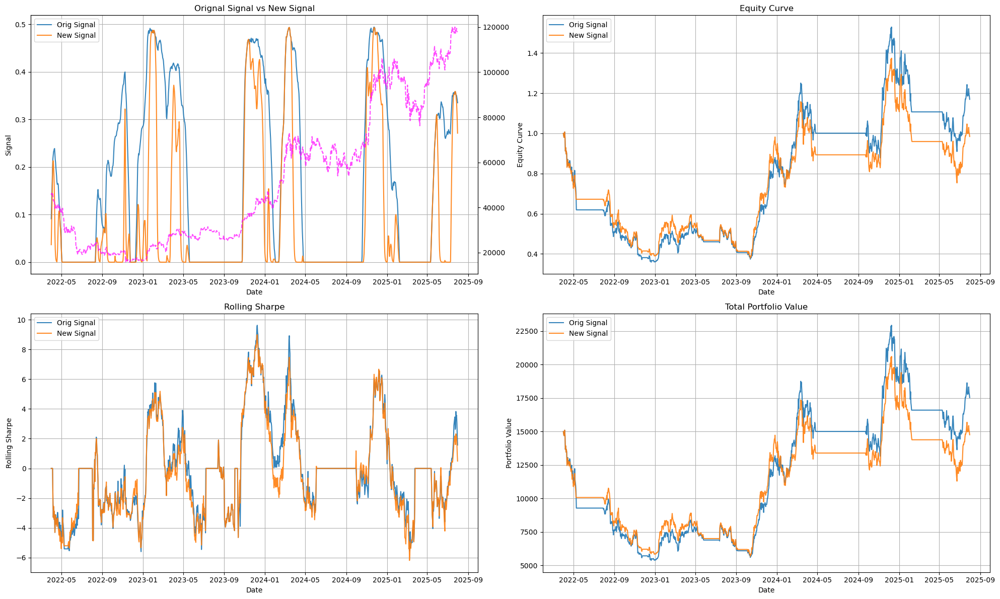

In [300]:
plot_signal_performance(df_final_orig, df_final_with_rolling_r2, ticker='BTC-USD')

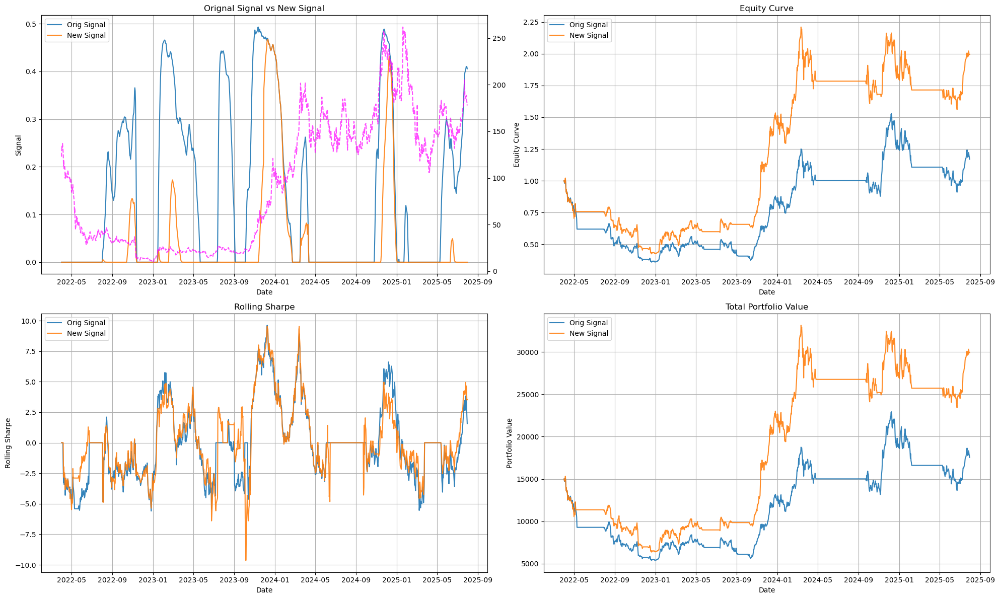

In [318]:
plot_signal_performance(df_final_orig, df_final_rolling_r2_vov, ticker='SOL-USD')

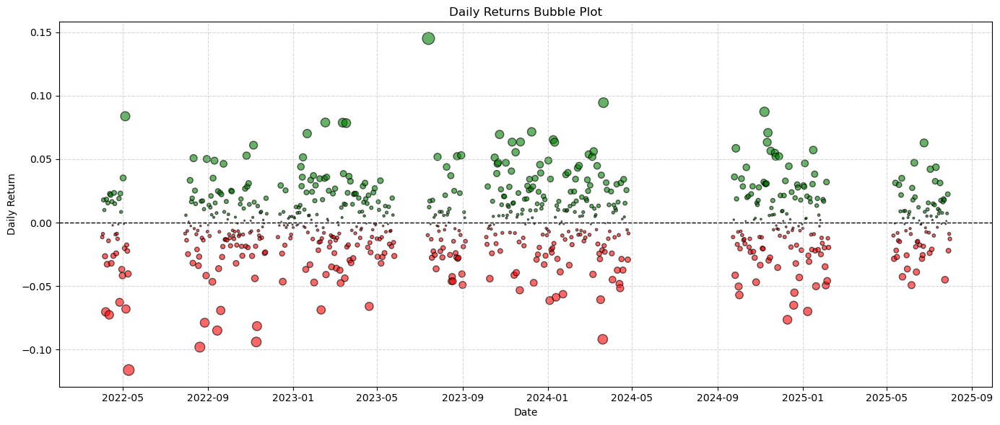

In [308]:
perf.plot_daily_returns_bubble(df_final_orig, return_col='portfolio_daily_pct_returns')

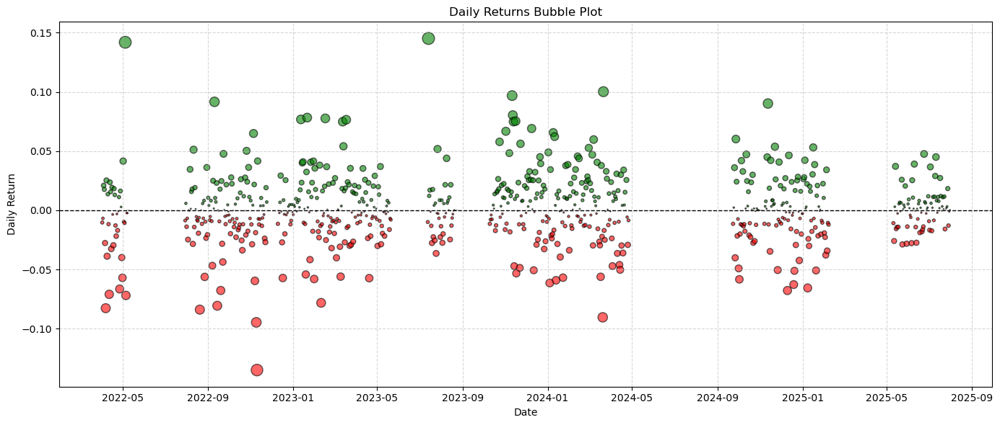

In [310]:
perf.plot_daily_returns_bubble(df_final_rolling_r2, return_col='portfolio_daily_pct_returns')

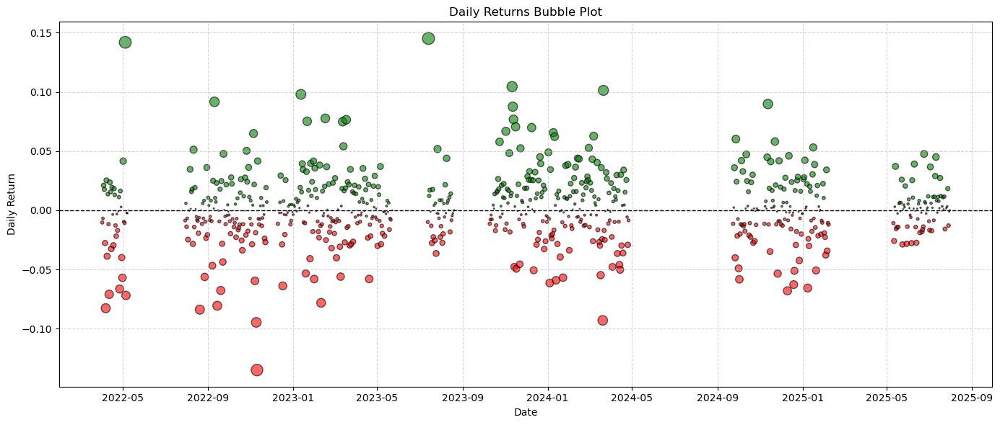

In [312]:
perf.plot_daily_returns_bubble(df_final_rolling_r2_vov, return_col='portfolio_daily_pct_returns')

In [416]:
log_std_window=14; coef_of_variation_window=30; vol_of_vol_z_score_window=252; vol_of_vol_p_min=0.6
df_trend = get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr(start_date=start_date_os, end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                      slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, entry_rolling_donchian_window=entry_rolling_donchian_window, 
                                                                      exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate,
                                                                      donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                                      rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit,
                                                                      long_only=long_only, use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

In [484]:
print(start_date_os)
print(start_date_os - pd.Timedelta(days=283))

2024-01-01
2023-03-24


In [514]:
log_std_window=14; coef_of_variation_window=30; vol_of_vol_z_score_window=252; vol_of_vol_p_min=0.6
WARMUP_DAYS = 534
df_trend_vov = get_trend_donchian_signal_for_portfolio_with_rolling_r_sqr_vol_of_vol(start_date=start_date_os - pd.Timedelta(days=WARMUP_DAYS), end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                                     slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, entry_rolling_donchian_window=entry_rolling_donchian_window, 
                                                                                     exit_rolling_donchian_window=exit_rolling_donchian_window, use_donchian_exit_gate=use_donchian_exit_gate,
                                                                                     donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                                                     rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit,
                                                                                     log_std_window=log_std_window, coef_of_variation_window=coef_of_variation_window, vol_of_vol_z_score_window=vol_of_vol_z_score_window,
                                                                                     vol_of_vol_p_min=vol_of_vol_p_min,
                                                                                     long_only=long_only, use_coinbase_data=use_coinbase_data, use_saved_files=use_saved_files, saved_file_end_date=saved_file_end_date)

In [516]:
for ticker in ticker_list:
    df_trend_vov[f'{ticker}_t_1_close'] = df_trend_vov[f'{ticker}_close'].shift(1)

In [518]:
df_trend_vov.head()

,BTC-USD_close,BTC-USD_open,BTC-USD_mavg_ribbon_slope,BTC-USD_mavg_ribbon_rank,BTC-USD_final_weighted_additive_signal,BTC-USD_rolling_r_sqr,BTC-USD_vol_of_vol_penalty,BTC-USD_regime_filter,BTC-USD_final_signal,ETH-USD_close,ETH-USD_open,ETH-USD_mavg_ribbon_slope,ETH-USD_mavg_ribbon_rank,ETH-USD_final_weighted_additive_signal,ETH-USD_rolling_r_sqr,ETH-USD_vol_of_vol_penalty,ETH-USD_regime_filter,ETH-USD_final_signal,SOL-USD_close,SOL-USD_open,SOL-USD_mavg_ribbon_slope,SOL-USD_mavg_ribbon_rank,SOL-USD_final_weighted_additive_signal,SOL-USD_rolling_r_sqr,SOL-USD_vol_of_vol_penalty,SOL-USD_regime_filter,SOL-USD_final_signal,ADA-USD_close,ADA-USD_open,ADA-USD_mavg_ribbon_slope,ADA-USD_mavg_ribbon_rank,ADA-USD_final_weighted_additive_signal,ADA-USD_rolling_r_sqr,ADA-USD_vol_of_vol_penalty,ADA-USD_regime_filter,ADA-USD_final_signal,AVAX-USD_close,AVAX-USD_open,AVAX-USD_mavg_ribbon_slope,AVAX-USD_mavg_ribbon_rank,AVAX-USD_final_weighted_additive_signal,AVAX-USD_rolling_r_sqr,AVAX-USD_vol_of_vol_penalty,AVAX-USD_regime_filter,AVAX-USD_final_signal,BTC-USD_t_1_close,ETH-USD_t_1_close,SOL-USD_t_1_close,ADA-USD_t_1_close,AVAX-USD_t_1_close
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-07-16,21189.68,20823.06,NaN,NaN,NaN,0.0,1.0,0.0,NaN,1355.70,1231.07,NaN,NaN,NaN,0.0,1.0,0.0,NaN,39.60,37.36,NaN,NaN,NaN,0.0,1.0,0.0,NaN,0.4579,0.4419,NaN,NaN,NaN,0.0,1.0,0.0,NaN,21.24,19.36,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-17,20791.74,21189.23,4.594532e-15,NaN,NaN,0.0,1.0,0.0,NaN,1338.20,1355.50,3.308833e-15,NaN,NaN,0.0,1.0,0.0,NaN,38.63,39.57,1.686995e-15,NaN,NaN,0.0,1.0,0.0,NaN,0.4477,0.4578,-3.078208e-16,NaN,NaN,0.0,1.0,0.0,NaN,20.62,21.24,1.666389e-15,NaN,NaN,0.0,1.0,0.0,NaN,21189.68,1355.70,39.60,0.4579,21.24
2022-07-18,22427.56,20791.74,-7.407949e-04,NaN,NaN,0.0,1.0,0.0,NaN,1581.34,1338.03,-5.076767e-04,NaN,NaN,0.0,1.0,0.0,NaN,43.55,38.59,-9.690477e-04,NaN,NaN,0.0,1.0,0.0,NaN,0.4900,0.4477,-8.802512e-04,NaN,NaN,0.0,1.0,0.0,NaN,23.97,20.62,-1.157574e-03,NaN,NaN,0.0,1.0,0.0,NaN,20791.74,1338.20,38.63,0.4477,20.62
2022-07-19,23395.06,22434.97,1.561179e-03,NaN,NaN,0.0,1.0,0.0,NaN,1542.63,1581.09,5.565238e-03,NaN,NaN,0.0,1.0,0.0,NaN,44.88,43.56,2.855367e-03,NaN,NaN,0.0,1.0,0.0,NaN,0.5151,0.4901,1.866406e-03,NaN,NaN,0.0,1.0,0.0,NaN,24.73,23.97,3.697623e-03,NaN,NaN,0.0,1.0,0.0,NaN,22427.56,1581.34,43.55,0.4900,23.97
2022-07-20,23226.99,23398.46,5.254617e-03,NaN,NaN,0.0,1.0,0.0,NaN,1522.12,1542.60,9.985883e-03,NaN,NaN,0.0,1.0,0.0,NaN,42.05,44.86,7.425057e-03,NaN,NaN,0.0,1.0,0.0,NaN,0.4911,0.5152,6.256236e-03,NaN,NaN,0.0,1.0,0.0,NaN,23.59,24.71,9.226307e-03,NaN,NaN,0.0,1.0,0.0,NaN,23395.06,1542.63,44.88,0.5151,24.73


In [520]:
df_trend_vov_check = generate_vol_of_vol_signal_log_space(df_trend_vov, ticker='AVAX-USD', t_1_close_price_col='AVAX-USD_t_1_close')

<Axes: xlabel='date'>

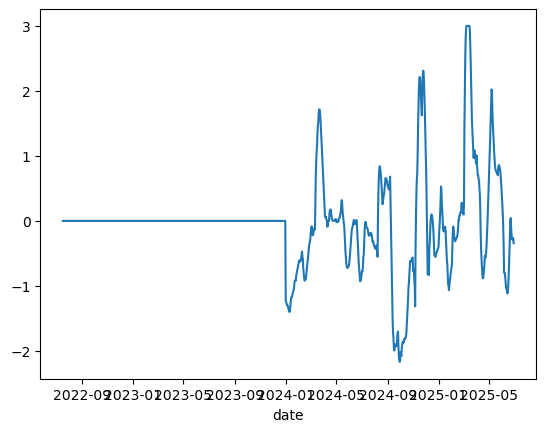

In [522]:
df_trend_vov['AVAX-USD_vol_of_vol_robust_z_score'].plot()

In [526]:
cols = [col for col in df_trend_vov_check.columns if 'AVAX-USD' in col]
df_trend_vov_check[cols]

,AVAX-USD_close,AVAX-USD_open,AVAX-USD_mavg_ribbon_slope,AVAX-USD_mavg_ribbon_rank,AVAX-USD_final_weighted_additive_signal,AVAX-USD_rolling_r_sqr,AVAX-USD_vol_of_vol_penalty,AVAX-USD_regime_filter,AVAX-USD_final_signal,AVAX-USD_t_1_close,AVAX-USD_t_1_log_returns,AVAX-USD_ann_log_volatility,AVAX-USD_coef_variation_vol,AVAX-USD_cov_vol_rolling_252_median,AVAX-USD_cov_vol_rolling_252_median_abs_dev,AVAX-USD_vol_of_vol_robust_z_score,AVAX-USD_vol_of_vol_signal_raw
date,,,,,,,,,,,,,,,,,
2022-07-16,21.24,19.36,NaN,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
2022-07-17,20.62,21.24,1.666389e-15,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,21.24,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
2022-07-18,23.97,20.62,-1.157574e-03,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,20.62,-0.029625,NaN,NaN,NaN,NaN,0.000000,0.000000
2022-07-19,24.73,23.97,3.697623e-03,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,23.97,0.150542,2.433913,NaN,NaN,NaN,0.000000,0.000000
2022-07-20,23.59,24.71,9.226307e-03,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,24.73,0.031214,1.753043,NaN,NaN,NaN,0.000000,0.000000
2022-07-21,24.98,23.58,1.228539e-02,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,23.59,-0.047194,1.478124,NaN,NaN,NaN,0.000000,0.000000
2022-07-22,23.63,24.99,1.723023e-02,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,24.98,0.057253,1.369216,NaN,NaN,NaN,0.000000,0.000000
2022-07-23,23.60,23.64,1.943783e-02,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,23.63,-0.055558,1.284936,NaN,NaN,NaN,0.000000,0.000000
2022-07-24,23.80,23.62,2.133395e-02,NaN,NaN,0.000000e+00,1.000000,0.000000e+00,NaN,23.60,-0.001270,1.152548,NaN,NaN,NaN,0.000000,0.000000


In [510]:
df_trend_vov[(df_trend_vov.index <= pd.Timestamp('2024-06-22').date())].shape

(534, 57)

In [512]:
534/2

267.0

<Axes: xlabel='date'>

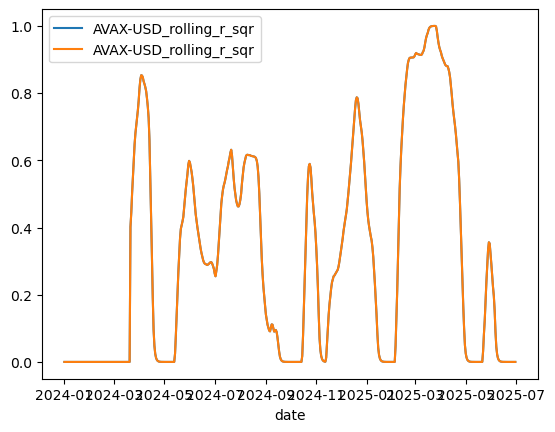

In [420]:
df_trend['AVAX-USD_rolling_r_sqr'].plot()

<Axes: xlabel='date'>

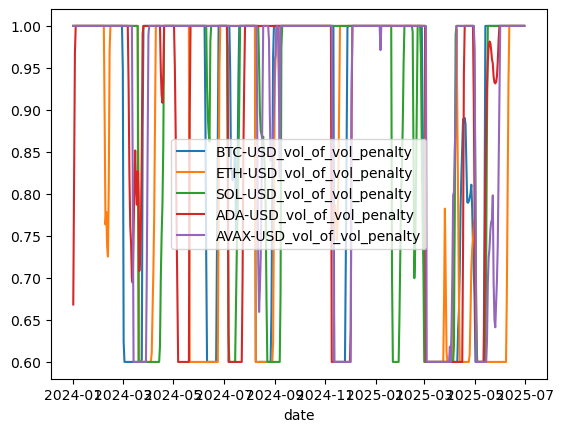

In [528]:
## 534
date_cond = (df_trend_vov.index >= start_date_os)
df_trend_vov[date_cond][['BTC-USD_vol_of_vol_penalty','ETH-USD_vol_of_vol_penalty','SOL-USD_vol_of_vol_penalty','ADA-USD_vol_of_vol_penalty','AVAX-USD_vol_of_vol_penalty']].plot()

<Axes: xlabel='date'>

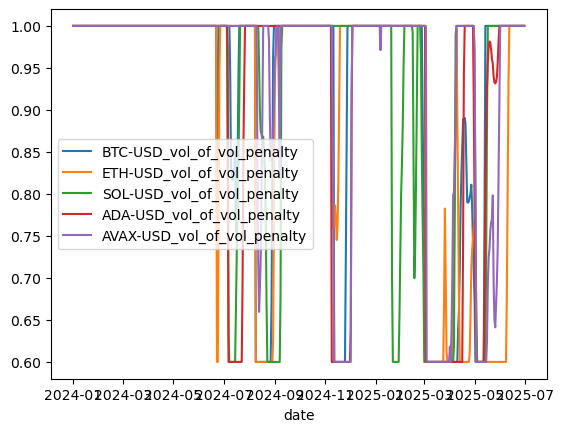

In [502]:
## 360
date_cond = (df_trend_vov.index >= start_date_os)
df_trend_vov[date_cond][['BTC-USD_vol_of_vol_penalty','ETH-USD_vol_of_vol_penalty','SOL-USD_vol_of_vol_penalty','ADA-USD_vol_of_vol_penalty','AVAX-USD_vol_of_vol_penalty']].plot()

<Axes: xlabel='date'>

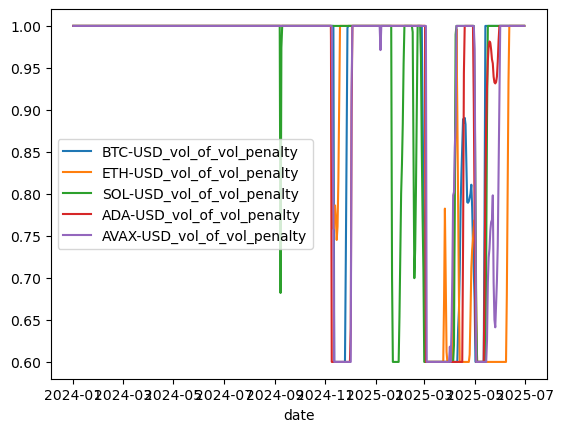

In [488]:
## 283
date_cond = (df_trend_vov.index >= start_date_os)
df_trend_vov[date_cond][['BTC-USD_vol_of_vol_penalty','ETH-USD_vol_of_vol_penalty','SOL-USD_vol_of_vol_penalty','ADA-USD_vol_of_vol_penalty','AVAX-USD_vol_of_vol_penalty']].plot()

<Axes: xlabel='date'>

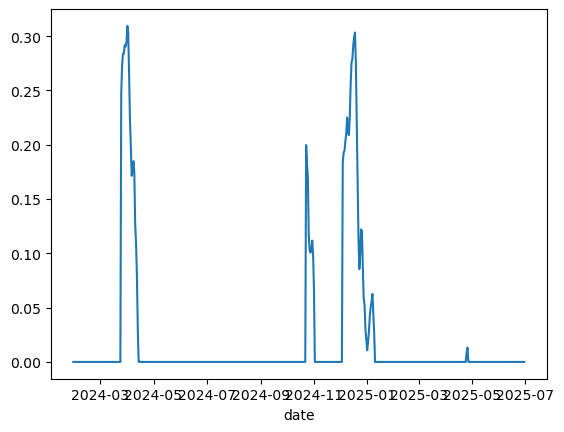

In [392]:
df_os['AVAX-USD_final_signal'].plot()

In [386]:
start_date_os

datetime.date(2024, 1, 1)

In [576]:
perf.calculate_risk_and_performance_metrics(df_os_vov[df_os_vov.index >= pd.Timestamp(start_date_os).date()], strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions',
                                           include_transaction_costs_and_fees=False, annual_trading_days=365)

{'annualized_return': -0.02122948238308009,
 'annualized_sharpe_ratio': 0.029174153461011945,
 'calmar_ratio': -0.0494950809484958,
 'annualized_std_dev': 0.4894843478339456,
 'max_drawdown': -0.4289210559160682,
 'max_drawdown_duration': Timedelta('475 days 00:00:00'),
 'hit_rate': 0.2979890310786106,
 't_statistic': 0.1827808998098945,
 'p_value': 0.855037783355945,
 'trade_count': 1042.0}

In [578]:
df_os = apply_target_volatility_position_sizing_continuous_strategy_with_rolling_r_sqr(
            start_date=start_date_os, end_date=end_date_os, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
            mavg_stepsize=mavg_stepsize, entry_rolling_donchian_window=entry_rolling_donchian_window, exit_rolling_donchian_window=exit_rolling_donchian_window, 
            use_donchian_exit_gate=use_donchian_exit_gate, ma_crossover_signal_weight=ma_crossover_signal_weight, donchian_signal_weight=donchian_signal_weight, 
            rolling_r2_window=rolling_r2_window, lower_r_sqr_limit=lower_r_sqr_limit, upper_r_sqr_limit=upper_r_sqr_limit, long_only=long_only,
            initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
            rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
            rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
            annualized_target_volatility=annualized_target_volatility,
            annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [580]:
perf.calculate_risk_and_performance_metrics(df_os, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions',
                                           include_transaction_costs_and_fees=False, annual_trading_days=365)

{'annualized_return': -0.15594733200722966,
 'annualized_sharpe_ratio': -0.5786746974924701,
 'calmar_ratio': -0.4228520782782886,
 'annualized_std_dev': 0.5498902387847863,
 'max_drawdown': -0.36879878335278554,
 'max_drawdown_duration': Timedelta('455 days 00:00:00'),
 'hit_rate': 0.15399239543726237,
 't_statistic': -0.499259304161487,
 'p_value': 0.6178058646975957,
 'trade_count': 318.0}

In [510]:
df_rolling_r2_locked_params_performance.to_pickle('/Users/adheerchauhan/Documents/git/trend_following/trend_following_results/Portfolio_Rolling_R_Squared_Locked_Params_OS_Performance-2021-06-01-2025-05-31.pickle')

In [524]:
agg_dict = {'annualized_sharpe_ratio':['median','mean','std'],
            'annualized_return':['median','mean','std'],
            'calmar_ratio':['median','mean','std'],
            'annualized_std_dev':['median','mean','std'],
            'max_drawdown':['median','mean','std'],}

agg_dict = {'annualized_sharpe_ratio':['median','mean'],
            'annualized_return':['median','mean'],
            # 'calmar_ratio':['median','mean'],
            'annualized_std_dev':['median','mean'],
            'max_drawdown':['median','mean'],
            'BTC-USD_annualized_sharpe_ratio':['median','mean'],
            'ETH-USD_annualized_sharpe_ratio':['median','mean'],
            'SOL-USD_annualized_sharpe_ratio':['median','mean'],
            'ADA-USD_annualized_sharpe_ratio':['median','mean'],
            'AVAX-USD_annualized_sharpe_ratio':['median','mean']}
df_rolling_r2_locked_params_performance.groupby(['rolling_r2_window','lower_r_sqr_limit','upper_r_sqr_limit']).agg(agg_dict)

annualized_sharpe_ratio  \
                                                                       median   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit                           
50                0.2               0.6                              0.140177   
                                    0.9                              0.051404   
                  0.3               0.6                             -0.142183   
                                    0.9                             -0.235173   
80                0.2               0.6                              0.853225   
                                    0.9                              0.853812   
                  0.3               0.6                              0.704425   
                                    0.9                              0.687912   

                                                                 \
                                                           mean   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit             
50                0.2               0.6                0.155338   
                                    0.9                0.145652   
                  0.3               0.6                0.106637   
                                    0.9                0.104349   
80                0.2               0.6                0.873205   
                                    0.9                0.865304   
                  0.3               0.6                0.679917   
                                    0.9                0.658588   

                                                      annualized_return  \
                                                                 median   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit                     
50                0.2               0.6                        0.024744   
                                    0.9                       -0.014146   
                  0.3               0.6                       -0.080547   
                                    0.9                       -0.093296   
80                0.2               0.6                        0.334249   
                                    0.9                        0.331881   
                  0.3               0.6                        0.268579   
                                    0.9                        0.262812   

                                                                 \
                                                           mean   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit             
50                0.2               0.6                0.228914   
                                    0.9                0.230789   
                  0.3               0.6                0.268728   
                                    0.9                0.279422   
80                0.2               0.6                0.345938   
                                    0.9                0.341528   
                  0.3               0.6                0.256595   
                                    0.9                0.248517   

                                                      annualized_std_dev  \
                                                                  median   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit                      
50                0.2               0.6                         0.593591   
                                    0.9                         0.602959   
                  0.3               0.6                         0.627126   
                                    0.9                         0.634717   
80                0.2               0.6                         0.600429   
                                    0.9                         0.608485   
                  0.3               0.6                         0.616281   
                                    0.9                         0.620426   

                       

In [522]:
agg_dict = {'annualized_sharpe_ratio':['median','mean'],
            'annualized_return':['median','mean'],
            # 'calmar_ratio':['median','mean'],
            'annualized_std_dev':['median','mean'],
            'max_drawdown':['median','mean'],
            'BTC-USD_annualized_sharpe_ratio':['median','mean'],
            'ETH-USD_annualized_sharpe_ratio':['median','mean'],
            'SOL-USD_annualized_sharpe_ratio':['median','mean'],
            'ADA-USD_annualized_sharpe_ratio':['median','mean'],
            'AVAX-USD_annualized_sharpe_ratio':['median','mean']}
df_rolling_r2_locked_params_performance.groupby(['rolling_r2_window','lower_r_sqr_limit','upper_r_sqr_limit','start_date']).agg(agg_dict)

annualized_sharpe_ratio  \
                                                                                  median   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit start_date                           
50                0.2               0.6               2023-06-01                1.872357   
                                                      2023-12-01               -0.100270   
                                                      2024-06-01                0.380623   
                                                      2024-12-01               -1.531359   
                                    0.9               2023-06-01                1.932569   
                                                      2023-12-01               -0.212618   
                                                      2024-06-01                0.315427   
                                                      2024-12-01               -1.452771   
                  0.3               0.6               2023-06-01                2.274751   
                                                      2023-12-01               -0.573259   
                                                      2024-06-01                0.288892   
                                                      2024-12-01               -1.563838   
                                    0.9               2023-06-01                2.336882   
                                                      2023-12-01               -0.710277   
                                                      2024-06-01                0.239931   
                                                      2024-12-01               -1.449138   
80                0.2               0.6               2023-06-01                1.475890   
                                                      2023-12-01                0.310482   
                                                      2024-06-01                0.891134   
                                                      2024-12-01                0.815315   
                                    0.9               2023-06-01                1.478576   
                                                      2023-12-01                0.275015   
                                                      2024-06-01                0.828826   
                                                      2024-12-01                0.878797   
                  0.3               0.6               2023-06-01                1.120458   
                                                      2023-12-01                0.190359   
                                                      2024-06-01                0.468764   
                                                      2024-12-01                0.940086   
                                    0.9               2023-06-01                1.123806   
                                                      2023-12-01                0.134723   
                                                      2024-06-01                0.380944   
                                                      2024-12-01                0.994880   

                                                                            \
                                                                      mean   
rolling_r2_window lower_r_sqr_limit upper_r_sqr_limit start_date             
50                0.2               0.6               2023-06-01  1.872357   
                                                      2023-12-01 -0.100270   
                                                      2024-06-01  0.380623   
                                                      2024-12-01 -1.531359   
                                    0.9               2023-06-01  1.932569   
                                                      2023-12-01 -0.212618   
                                                      2024-06-01  0.315427   
                                                      2024-12-01

In [171]:
## With activation
fast_mavg = 16
slow_mavg = 224
mavg_stepsize = 8
entry_window = 28
exit_window = 28
exit_gate = False
w_mavg = 0.8
w_donchian = 0.2
df_is = apply_target_volatility_position_sizing_continuous_strategy(
    start_date=pd.Timestamp('2021-06-01').date(), end_date=pd.Timestamp('2023-11-30').date(), ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, entry_rolling_donchian_window=entry_window, exit_rolling_donchian_window=exit_window, 
    use_donchian_exit_gate=exit_gate, ma_crossover_signal_weight=w_mavg, donchian_signal_weight=w_donchian, 
    tanh_activation_constant_dict=None, long_only=long_only,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


<Axes: xlabel='date'>

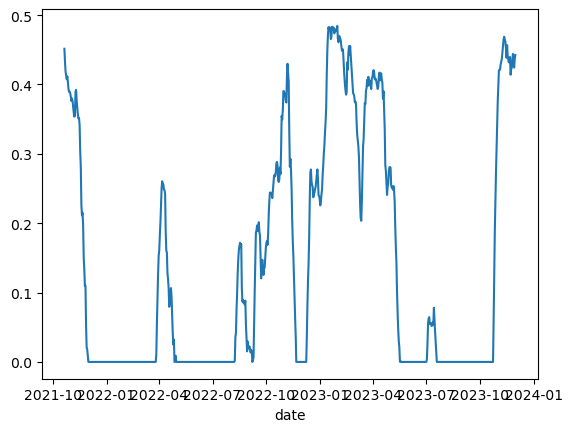

In [163]:
## Without Activation
df_is['BTC-USD_final_signal'].plot()

<Axes: xlabel='date'>

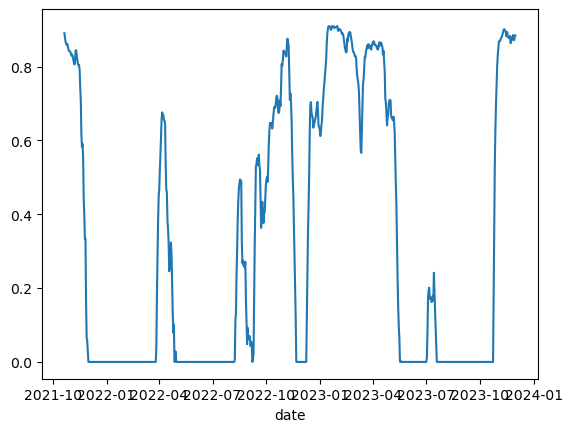

In [172]:
## With Activation
df_is['BTC-USD_final_signal'].plot()

In [155]:
df_is.head()

,BTC-USD_20_avg_true_range_price,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_cash_shrink_factor,BTC-USD_close,BTC-USD_cooldown_counter,BTC-USD_event,BTC-USD_final_signal,BTC-USD_final_weighted_additive_signal,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_stopout_flag,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,ETH-USD_20_avg_true_range_price,ETH-USD_actual_position_notional,ETH-USD_actual_position_size,ETH-USD_annualized_volatility_20,ETH-USD_cash_shrink_factor,ETH-USD_close,ETH-USD_cooldown_counter,ETH-USD_event,ETH-USD_final_signal,ETH-USD_final_weighted_additive_signal,ETH-USD_new_position_entry_exit_price,ETH-USD_new_position_notional,ETH-USD_new_position_size,ETH-USD_open,ETH-USD_open_position_notional,ETH-USD_open_position_size,ETH-USD_short_sale_proceeds,ETH-USD_stop_loss,ETH-USD_stopout_flag,ETH-USD_t_1_close,ETH-USD_t_1_close_pct_returns,ETH-USD_target_notional,ETH-USD_target_size,ETH-USD_target_vol_normalized_weight,ETH-USD_vol_adjusted_trend_signal,SOL-USD_20_avg_true_range_price,SOL-USD_actual_position_notional,SOL-USD_actual_position_size,SOL-USD_annualized_volatility_20,SOL-USD_cash_shrink_factor,SOL-USD_close,SOL-USD_cooldown_counter,SOL-USD_event,SOL-USD_final_signal,SOL-USD_final_weighted_additive_signal,SOL-USD_new_position_entry_exit_price,SOL-USD_new_position_notional,SOL-USD_new_position_size,SOL-USD_open,SOL-USD_open_position_notional,SOL-USD_open_position_size,SOL-USD_short_sale_proceeds,SOL-USD_stop_loss,SOL-USD_stopout_flag,SOL-USD_t_1_close,SOL-USD_t_1_close_pct_returns,SOL-USD_target_notional,SOL-USD_target_size,SOL-USD_target_vol_normalized_weight,SOL-USD_vol_adjusted_trend_signal,ADA-USD_20_avg_true_range_price,ADA-USD_actual_position_notional,ADA-USD_actual_position_size,ADA-USD_annualized_volatility_20,ADA-USD_cash_shrink_factor,ADA-USD_close,ADA-USD_cooldown_counter,ADA-USD_event,ADA-USD_final_signal,ADA-USD_final_weighted_additive_signal,ADA-USD_new_position_entry_exit_price,ADA-USD_new_position_notional,ADA-USD_new_position_size,ADA-USD_open,ADA-USD_open_position_notional,ADA-USD_open_position_size,ADA-USD_short_sale_proceeds,ADA-USD_stop_loss,ADA-USD_stopout_flag,ADA-USD_t_1_close,ADA-USD_t_1_close_pct_returns,ADA-USD_target_notional,ADA-USD_target_size,ADA-USD_target_vol_normalized_weight,ADA-USD_vol_adjusted_trend_signal,AVAX-USD_20_avg_true_range_price,AVAX-USD_actual_position_notional,AVAX-USD_actual_position_size,AVAX-USD_annualized_volatility_20,AVAX-USD_cash_shrink_factor,AVAX-USD_close,AVAX-USD_cooldown_counter,AVAX-USD_event,AVAX-USD_final_signal,AVAX-USD_final_weighted_additive_signal,AVAX-USD_new_position_entry_exit_price,AVAX-USD_new_position_notional,AVAX-USD_new_position_size,AVAX-USD_open,AVAX-USD_open_position_notional,AVAX-USD_open_position_size,AVAX-USD_short_sale_proceeds,AVAX-USD_stop_loss,AVAX-USD_stopout_flag,AVAX-USD_t_1_close,AVAX-USD_t_1_close_pct_returns,AVAX-USD_target_notional,AVAX-USD_target_size,AVAX-USD_target_vol_normalized_weight,AVAX-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,cash_shrink_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-21,3029.172671,0.000000,0.000000,0.654385,0.0,62204.02,0.0,NaN,0.451489,0.451489,0.00,0.000000,0.000000,66021.26,0.000000,0.000000,0.0,0.000000,False,66026.54,0.02

In [157]:
perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions',
                                           include_transaction_costs_and_fees=False, annual_trading_days=365)

{'annualized_return': -0.23400134562743602,
 'annualized_sharpe_ratio': -0.47510497520815587,
 'calmar_ratio': -0.3280133746315728,
 'annualized_std_dev': 0.5652218255963256,
 'max_drawdown': -0.7133896472674877,
 'max_drawdown_duration': Timedelta('739 days 00:00:00'),
 'hit_rate': 0.3203631647211414,
 't_statistic': -0.5329376375777404,
 'p_value': 0.5942305209159131,
 'trade_count': 1054.0}

In [132]:
np.abs(df_is['BTC-USD_final_weighted_additive_signal']).quantile(0.95)

0.46594857579383253

In [108]:
np.abs(df_is['ETH-USD_final_weighted_additive_signal']).quantile(0.95)

0.4699992899434025

In [110]:
np.abs(df_is['ADA-USD_final_weighted_additive_signal']).quantile(0.95)

0.4706896393150276

In [112]:
np.abs(df_is['SOL-USD_final_weighted_additive_signal']).quantile(0.95)

0.47152392407208465

In [114]:
np.abs(df_is['AVAX-USD_final_weighted_additive_signal']).quantile(0.95)

0.47236458399095443

In [248]:
final_weighted_signal_cols = [f'{ticker}_final_weighted_additive_signal' for ticker in ticker_list]
tanh_activation_constant_dict = {}
for ticker in ticker_list:
    tanh_activation_constant_dict[ticker] = np.abs(df_is[f'{ticker}_final_weighted_additive_signal']).quantile(0.95)

In [250]:
tanh_activation_constant_dict

{'BTC-USD': 0.46594857579383253,
 'ETH-USD': 0.4699992899434025,
 'SOL-USD': 0.47152392407208465,
 'ADA-USD': 0.4706896393150276,
 'AVAX-USD': 0.47254282901082484}

In [136]:
fast_mavg = 16
slow_mavg = 224
mavg_stepsize = 8
entry_window = 28
exit_window = 28
exit_gate = False
w_mavg = 0.8
w_donchian = 0.2
df_is = apply_target_volatility_position_sizing_continuous_strategy(
    start_date=pd.Timestamp('2021-06-01').date(), end_date=pd.Timestamp('2023-11-30').date(), ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
    mavg_stepsize=mavg_stepsize, entry_rolling_donchian_window=entry_window, exit_rolling_donchian_window=exit_window, 
    use_donchian_exit_gate=exit_gate, ma_crossover_signal_weight=w_mavg, donchian_signal_weight=w_donchian, 
    tanh_activation_constant_dict=tanh_activation_constant_dict, long_only=long_only,
    initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
    rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
    transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
    rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage,
    annualized_target_volatility=annualized_target_volatility,
    annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

Generating Moving Average Ribbon Signal!!
Generating Volatility Adjusted Trend Signal!!
Getting Average True Range for Stop Loss Calculation!!
Calculating Volatility Targeted Position Size and Cash Management!!
Calculating Portfolio Performance!!


In [138]:
perf.calculate_risk_and_performance_metrics(df_is, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions',
                                           include_transaction_costs_and_fees=False, annual_trading_days=365)

{'annualized_return': -0.23399189526878894,
 'annualized_sharpe_ratio': -0.47448346144804493,
 'calmar_ratio': -0.32790121104352055,
 'annualized_std_dev': 0.564685901685028,
 'max_drawdown': -0.7136048522789153,
 'max_drawdown_duration': Timedelta('739 days 00:00:00'),
 'hit_rate': 0.3203631647211414,
 't_statistic': -0.5321355580181899,
 'p_value': 0.5947856141730341,
 'trade_count': 1060.0}

In [388]:
## Decide on which entry gate to use for the Donchian Channel Signal
## Lock the Stepsize to 8 and gate to False
entry_cond = ((df_performance_os['cluster'] == 'MA_16_224') & (df_performance_os['entry'].isin([21, 28])) & (df_performance_os['gate'] == False) & (df_performance_os['step'].isin([6, 8])))
df_ma_ribbon_weight_performance = (
    df_performance_os[entry_cond]
    .groupby(["cluster","entry","step","mavg_ribbon_weight","donchian_weight"])
    .agg(mean_sharpe      = ("annualized_sharpe_ratio","mean"),
        sharpe_std       = ("annualized_sharpe_ratio","std"),
        worst_sharpe     = ("annualized_sharpe_ratio","min"),
        pos_sharpe_pct   = ("annualized_sharpe_ratio", lambda x: (x > 0).mean()),  # % of slices with Sharpe > 0
        worst_dd         = ("max_drawdown","min"),
        mean_dd          = ("max_drawdown","mean"),
        mean_return      = ("annualized_return","mean"),
        mean_trade_count = ("trade_count","mean"))
    .reset_index()
    .sort_values("mean_sharpe", ascending=False)
)
## Entry window of 28 has the best performance

In [390]:
df_ma_ribbon_weight_performance

,cluster,entry,step,mavg_ribbon_weight,donchian_weight,mean_sharpe,sharpe_std,worst_sharpe,pos_sharpe_pct,worst_dd,mean_dd,mean_return,mean_trade_count
2,MA_16_224,28,8,0.8,0.2,1.599653,0.000000,1.599653,1.000000,-0.299902,-0.299902,0.876251,240.000000
0,MA_16_224,28,6,0.7,0.3,1.406795,0.000000,1.406795,1.000000,-0.318594,-0.318594,0.739236,253.000000
1,MA_16_224,28,6,1.0,0.0,0.301437,0.902938,-0.866479,0.666667,-0.290080,-0.241992,0.240621,189.666667
3,MA_16_224,28,8,1.0,0.0,0.288365,0.943051,-0.848256,0.666667,-0.290532,-0.241953,0.246418,187.333333


In [362]:
# OOS only, fixed structure
filt = (df_performance_os["cluster"].eq("MA_16_224") &
        df_performance_os["entry"].eq(28) &
        df_performance_os["step"].eq(8) &
        df_performance_os["gate"].eq(False) &
        df_performance_os["exit"].isin([21, 28]))      # or include all exits you keep

w_profile = (df_performance_os.loc[filt]
             .groupby("mavg_ribbon_weight")["annualized_sharpe_ratio"]
             .agg(mean_sharpe="mean", worst="min", count="size")
             .sort_index())

print(w_profile)  # look for a broad top; 0.65–0.70 should stand out


                    mean_sharpe     worst  count
mavg_ribbon_weight                              
0.8                    1.599653  1.599653      2
1.0                    0.288365 -0.848256      6


In [372]:
filt = (df_performance_is["cluster"].eq("MA_16_224") &
        df_performance_is["entry"].eq(28) &
        df_performance_is["step"].eq(8) &
        df_performance_is["gate"].eq(False) &
        df_performance_is["exit"].isin([21, 28])) 

In [380]:
(df_performance_is[filt].groupby("mavg_ribbon_weight")["annualized_sharpe_ratio"]
 .agg(mean_sharpe="mean", worst="min", count="size")
 .sort_index())

,mean_sharpe,worst,count
mavg_ribbon_weight,,,
0.0,-0.336300,-1.790570,8
0.1,-0.339208,-1.533497,8
0.2,-0.329561,-1.764056,8
0.3,-0.357665,-1.570500,8
0.4,-0.456633,-1.835694,8
0.5,-0.182735,-1.338456,8
0.6,-0.090852,-1.242756,8
0.7,0.042317,-1.171769,8
0.8,0.132148,-0.994416,8


In [115]:
df_performance.head()

,sampling_category,start_date,end_date,mavg_strategy,donchian_strategy,mavg_ribbon_weight,donchian_weight,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,BTC-USD_annualized_return,ETH-USD_annualized_return,SOL-USD_annualized_return,ADA-USD_annualized_return,AVAX-USD_annualized_return,BTC-USD_annualized_sharpe_ratio,ETH-USD_annualized_sharpe_ratio,SOL-USD_annualized_sharpe_ratio,ADA-USD_annualized_sharpe_ratio,AVAX-USD_annualized_sharpe_ratio,BTC-USD_annualized_std_dev,ETH-USD_annualized_std_dev,SOL-USD_annualized_std_dev,ADA-USD_annualized_std_dev,AVAX-USD_annualized_std_dev,BTC-USD_max_drawdown,ETH-USD_max_drawdown,SOL-USD_max_drawdown,ADA-USD_max_drawdown,AVAX-USD_max_drawdown
0,in_sample,2021-06-01,2023-05-31,f16_s224_n2,en28_ex7_gFalse,0.0,1.0,-0.620453,-1.790570,-0.724938,0.605099,-0.855872,554 days,0.295918,-2.148274,0.032100,971.0,-0.079120,0.032138,-0.133513,-0.177671,-0.019710,-1.050796,-0.069017,-1.763589,-1.083856,-0.239506,0.174840,0.197752,0.157529,0.317532,0.293483,-0.237771,-0.157088,-0.260887,-0.404989,-0.288162
1,in_sample,2021-06-01,2023-05-31,f16_s224_n2,en28_ex7_gFalse,0.1,0.9,-0.562871,-1.525900,-0.689592,0.601925,-0.816238,568 days,0.301020,-1.811222,0.070618,937.0,-0.029747,0.038420,-0.153291,-0.155203,0.021465,-0.617141,-0.021369,-2.003182,-1.020310,-0.027091,0.173697,0.196139,0.156923,0.301969,0.306230,-0.194526,-0.150356,-0.286476,-0.363167,-0.261788
2,in_sample,2021-06-01,2023-05-31,f16_s224_n2,en28_ex7_gFalse,0.2,0.8,-0.609231,-1.811975,-0.726001,0.589945,-0.839160,568 days,0.292517,-2.170978,0.030333,919.0,-0.024450,0.027445,-0.129162,-0.184051,-0.099614,-0.556325,-0.107031,-1.771100,-1.303042,-0.694627,0.175399,0.191048,0.154967,0.283487,0.285592,-0.193790,-0.156090,-0.252184,-0.351628,-0.356505
3,in_sample,2021-06-01,2023-05-31,f16_s224_n2,en28_ex7_gFalse,0.3,0.7,-0.573392,-1.628057,-0.701307,0.591289,-0.817604,568 days,0.295918,-1.937661,0.053144,931.0,-0.055202,0.013657,-0.114844,-0.100404,-0.110949,-0.832067,-0.164491,-1.689328,-0.811004,-0.761776,0.172670,0.216746,0.147796,0.271066,0.281934,-0.228792,-0.135720,-0.231022,-0.233637,-0.365411
4,in_sample,2021-06-01,2023-05-31,f16_s224_n2,en28_ex7_gFalse,0.4,0.6,-0.582723,-1.713242,-0.721869,0.577925,-0.807242,568 days,0.295918,-2.043427,0.041456,958.0,-0.045804,0.003794,-0.081056,-0.150840,-0.124228,-0.762874,-0.272796,-1.484869,-1.268906,-0.809378,0.168052,0.190338,0.131368,0.239434,0.285846,-0.242211,-0.105343,-0.182060,-0.254528,-0.368907
